# Notebook for running trajectory analysis on the Tumor - Epithelium subset

###### https://www.biorxiv.org/content/10.1101/2023.06.21.545980v1

## Import Jobs

In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import scvelo as scv
import cellrank as cr
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as hc
import matplotlib.patches as patches
import plotly.express as px

import matplotlib as mpl
import matplotlib
from matplotlib import rcParams
from adjustText import adjust_text
from scipy.stats import zscore
from copy import deepcopy
from kneed.knee_locator import KneeLocator
from sklearn.metrics.cluster import adjusted_rand_score
from py_pcha.PCHA import PCHA
from skimage import filters
from scipy import stats
from pprint import pprint

import palantir
import scipy
import sys
import os
import glob
import anndata
import itertools
import phenograph
import sklearn
import scanorama
import scikit_posthocs

# pip install petsc petsc4py slepc slepc4py
# These two packages can be tricky to install properly:
import slepc4py
import petsc4py

from os import path
from pathlib import Path
from scipy.ndimage.filters import convolve

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.


In [2]:
# Define output directory:
output_dir = '/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/'
!mkdir -p {output_dir}
print(f'output_dir: {output_dir}')
run_in_background_wait_default=True

output_dir: /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/


In [2]:
# Format notebook preferences

boolean_to_color = {True:'crimson',False:'steelblue'}

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))
display(HTML("<style>.output_result { max-width:85% !important; }</style>"))

In [5]:
# Define default parameters

%matplotlib inline

sc.settings.figdir = output_dir
sc.set_figure_params(dpi=80, dpi_save=300)

matplotlib.style.use('default')
scv.settings.set_figure_params('scanpy')
sns.set_style('white')

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

plt.rcParams['figure.figsize']=(6,4) #rescale figures
sc.settings.verbosity = 4

In [6]:
# Define helper functions:

def flatten(l):
    if all(isinstance(x, list) for x in l):
        return [item for sublist in l for item in sublist]
    elif all(isinstance(x, np.ndarray) for x in l):
        return [item for sublist in l for item in sublist]
    else:
        return 'Input List is Not Nested'
    
# run bash command in background if stdoutfile does not exist. If it does, output contents of stdoutfile.
# If force=true, overwrite and re-run command.
def run_in_background(command, stdoutfile, stderrfile="", force=False, quiet=False, 
                      wait=run_in_background_wait_default):
    if force or not path.exists(stdoutfile):
        command = 'bash -c \'' + command + '\' > ' + stdoutfile
        if stderrfile:
            command = command + ' 2>' + stderrfile
        else:
            command = command + ' 2>&1'
        if not wait:
            command = command + ' &'
        print('calling ' + command + '\n')
        os.system(command)
    else:
        wait=True
    if wait:
        if not quiet:
            print("Output from stdout file " + stdoutfile)
            !cat {stdoutfile}
        else:
            print("Output from stdout file " + stdoutfile + " is suppressed")
        if stderrfile and path.exists(stderrfile):
            print("Output from stderr file " + stderrfile)
            !cat {stderrfile}
            
            
def filter_genes(adata, minCell):
    hasCell = adata.layers['X'] > 0
    numCell = np.array(hasCell.sum(axis=0))
    tooSmall = [i < minCell for i in numCell]
    is_invalid = np.zeros(adata.shape[1], np.bool)
    is_invalid[np.where(tooSmall)[0]] = True
    print(f"Removing {np.sum(is_invalid)} out of {len(is_invalid)} genes with less than {minCell} cells")
    adata.var['n_cells_by_counts'] = numCell
    return is_invalid

In [8]:
%pip freeze

adjustText==0.7.3
aiohttp==3.8.4
aiosignal==1.3.1
anndata==0.8.0
anndata2ri==1.0.6
annoy==1.17.0
appdirs==1.4.4
arboreto==0.1.6
argon2-cffi==20.1.0
asn1crypto==0.24.0
async-generator==1.10
async-timeout==4.0.2
asynctest==0.13.0
attrs==21.2.0
backcall==0.2.0
beautifulsoup4==4.9.3
biofluff==3.0.4
biopython==1.81
bioservices==1.7.11
biothings-client==0.3.0
bleach==3.3.0
bokeh==2.4.3
boltons==23.0.0
cached-property==1.5.2
cellrank==1.5.1
certifi==2018.1.18
cffi==1.14.5
chardet==3.0.4
charset-normalizer==3.1.0
click==8.0.1
cloudpickle==2.2.1
cmake==3.18.2
cmocean==2.0
colorama==0.4.4
colorlog==5.0.1
compress-json==1.0.8
configparser==5.3.0
cryptography==2.1.4
ctxcore==0.2.0
cycler==0.10.0
Cython==0.29.23
cytoolz==0.12.1
dask==2022.2.0
dateparser==1.1.8
decorator==4.4.2
defusedxml==0.7.1
dill==0.3.4
diskcache==5.6.3
distributed==2022.2.0
distro-info===0.18ubuntu0.18.04.1
docrep==0.3.2
doubletdetection==3.0
easydev==0.11.1
entrypoints==0.3
environments-utils==1.0.10
et-xmlfile==1.1.0
fa2==0.3

## Import Value Maps

In [ ]:
# Import mouse to human mapping dictionary from GitHub:

import pickle 

with open('/workdir/varmus_single_cell/code/github_notebooks/mToH_mapping.pkl', 'rb') as f:
    mToH_mapping = pickle.load(f)

In [14]:
cell_type_cmap = {'Tumor cells': '#A4D10A', 
                  'AT1': '#FE84B4', 
                  'AT2': '#C70B0B', 
                  'LUAD': '#A3523B',
                  'B cells': '#F9D318', 
                  'Basal cells': '#4FFF9F', 
                  'Chondrocytes': '#79A274',
                  'Club cells': '#D36C39', 
                  'Transitional Club-AT2': '#C64A18',
                  'EC arterial': '#6B0C0C', 
                  'EC aerocyte': '#8D6868',
                  'EC general capillary': '#BF5B5B', 
                  'EC venous': '#782C2C', 
                  'Lymphatic EC': '#BD872F',
                  'Ciliated cells': '#D39939', 
                  'cDC1': '#C438FB',
                  'cDC2': '#E9B1FF',
                  'Migratory DCs': '#962A6F',
                  'DCs': '#C438FB',
                  'Endothelial cells': '#6B0C0C',
                  'Stromal cells': '#9BA65A', 
                  'Ionocyte': '#3C787D',
                  'Tuft': '#66966C',
                  'Secretory cells': '#B0A170',
                  'Submucosal cells': '#A4B070',
                  'Pericytes': '#046C50',
                  'Myofibroblasts': '#C15376',
                  'Smooth muscle': '#946E6E',
                  'Mesothelium': '#E16666',
                  'Fibroblast cells': '#216C04', 
                  'Alveolar macrophages': '#7AD9DA',
                  'Interstitial Macrophages': '#7AAEDA',
                  'Macrophages/mMDSC': '#7AC0DA',
                  'Monocytes': '#51ECAE', 
                  'Monocytic cells': '#51ECAE',
                  'Mast cells': '#A16E0F', 
                  'Multiciliated cells': '#F17C62',
                  'NK cells': '#EA0C0C', 
                  'Granulocytic cells': '#9CA7A8', 
                  'T cells': '#F47D08', 
                  'Plasma cells': '#90F162',
                  'Mature B cells/Plasma cells': '#90F162',
                  'pDC': '#51119A',
                  'PNEC': '#0B11C7',
                  'Tumor AT2': '#A3523B',
                  'Tumor PNEC': '#3B3587',
                  'Tumor cells': '#8A7B7B',
                  'unassigned': '#DEDEDE'}

genotype_cmap = {'RPMT': '#4FA169',
                 'ERPMT': '#F58CD9',
                 'RPP10MT': '#EEA13E',
                 'EPMT': '#7E8E96',
                 'ERPT': '#675E3F', 
                 'Normal AT2': '#C70B0B',
                 'Normal PNEC': '#0B11C7',
                 'Normal AT2_Pten': '#8B3418', 
                 'Normal AT2_cMYC': '#E1C88C',
                 'Normal PNEC_cMYC': '#8CE1CA'}

# Origin Palette
origin_cmap = {'AT2': '#C70B0B',
               'PNEC': '#0B11C7'}

# Normal vs tumor cmap
normal_tumor_cmap = {'Tumor': '#DE5454',
                     'Normal': '#959AA6'}

sample_cmap = {'AT2_1mo': '#AD0404', 
               'ERPMT_pool': '#ff0000', 
               'ERPMT_doxMRD': '#E896D1', 
               'ERPMT_3moMRD': '#9012F1', 
               'transformed_SCLC': '#46A8FF', 
               'RPMT_pool': '#0432ff',}

## Import Data

In [9]:
adata = sc.read('/workdir/varmus_single_cell/data/NOBACKUP/GEO_Upload_1023/'+
                'Gardner_et-al-2023_processed_adata_histological_transformation_subset.h5ad')

In [10]:
adata.shape

(15828, 24215)

In [11]:
print(np.max(adata.X))
print(np.max(adata.layers['logX']))
print(np.max(adata.layers['X']))

4.854183
4.854183
7147.8774


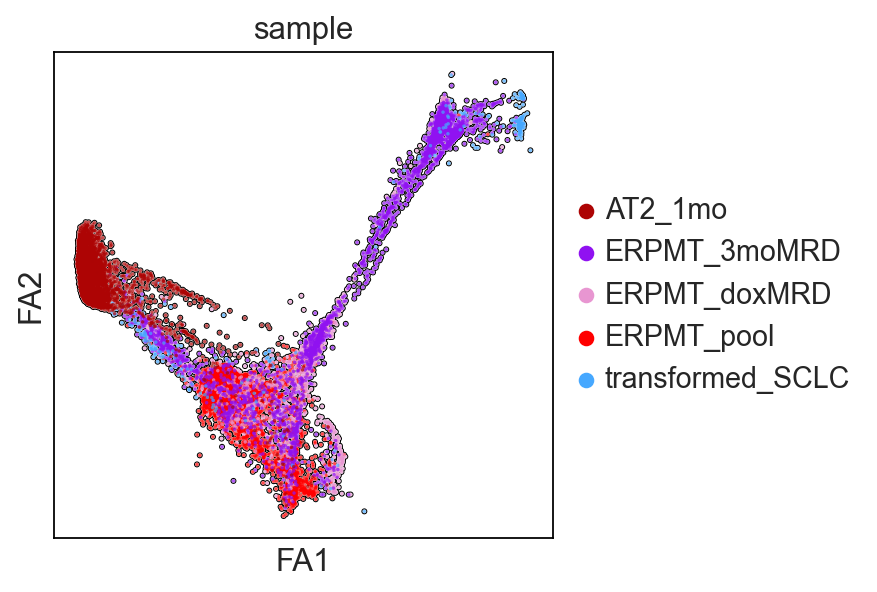

In [15]:
sc.settings.verbosity = 4
sc.set_figure_params(dpi=80, dpi_save=300) 

adata.uns['sample_colors'] = [sample_cmap[x] for x in sorted(adata.obs['sample'].unique())]
sc.pl.draw_graph(adata, color='sample', s=10, add_outline=True)

## Trajectory Analyses

###### This notebook is to rerun CellRank, the other notebook visualizes the results.
###### For this notebook, we first will remove the original CellRank results:

In [22]:
for x in ['ERPMT_pool_macrostate_probs', 'ERPMT_doxMRD_macrostate_probs', 'transformed_SCLC_macrostate_probs', 'AT2_1mo_macrostate_probs', 
          'top_macrostate', 'initial_states_probs', 'terminal_states_probs', 'palantir_pseudotime', 'palantir_diff_score']:
    
    del adata.obs[x]
    
    
for x in ['highly_variable', 'means', 'dispersions', 'dispersions_norm']:
    
    del adata.var[x]
    
    
for x in ['neighbors_40_connectivities', 'neighbors_40_distances']:
    
    del adata.obsp[x]
    
del adata.obsm['T_fwd_draw_graph_fa']

In [23]:
output_dir

'/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/'

In [24]:
#output_dir = '/workdir/varmus_single_cell/merged_pipeline_out/TEC_out/Trajectory_Analyses_RERUN/'
sc.settings.figdir = output_dir
scv.settings.figdir = output_dir
cr.settings.figdir = output_dir

### Select HVGs

extracting highly variable genes
    finished (0:00:46)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Found 4713 highly variable genes
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//hvgs_scanpy_cellranger_20bins_nomax_Project_Batch_AT2_SCLC_Traj_Sub.png


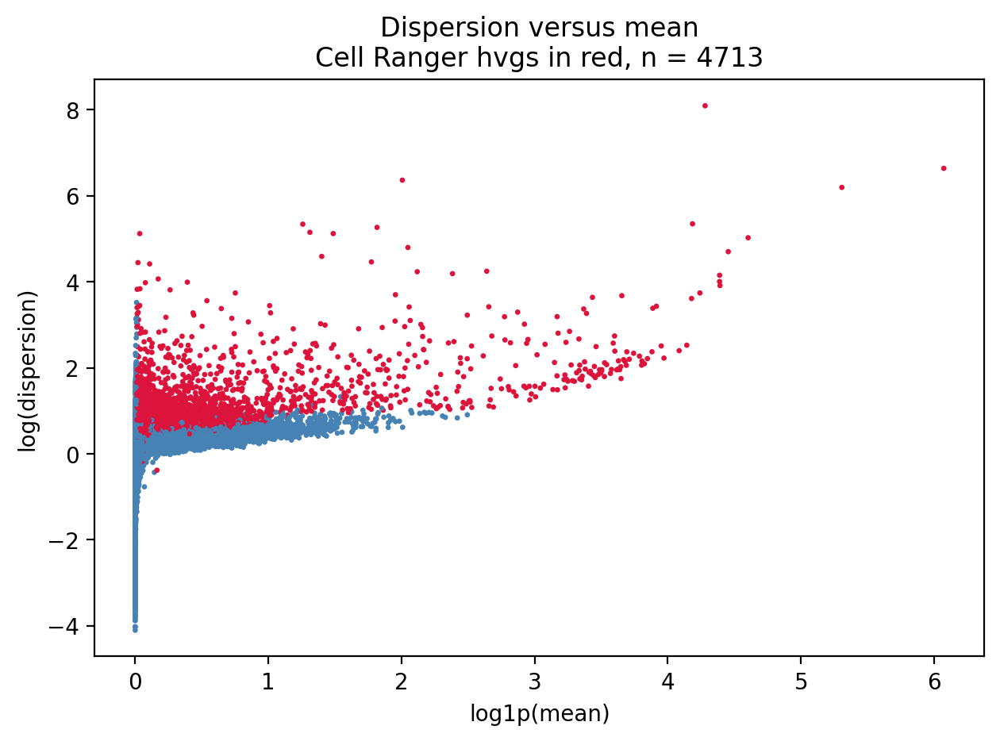

In [28]:
matplotlib.style.use('default')

adata.X = adata.layers['X']

sc.settings.verbosity=4
numHVG = 1000
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', batch_key='project_batch', n_bins=20, max_mean=np.inf)

colors_cell_ranger = [boolean_to_color[True] if x >0 else boolean_to_color[False]
                      for x in adata.var['highly_variable']]

plt.scatter(np.log1p(adata.var['means']), np.log(adata.var['dispersions']),
            s=2, c=colors_cell_ranger)

plt.xlabel('log1p(mean)')
plt.ylabel('log(dispersion)')
plt.title(f'Dispersion versus mean\nCell Ranger hvgs in red, n = {sum(adata.var["highly_variable"])}')
print(f'Found {sum(adata.var["highly_variable"])} highly variable genes')
fn = output_dir + '/hvgs_scanpy_cellranger_20bins_nomax_Project_Batch_AT2_SCLC_Traj_Sub.png'
plt.tight_layout()

print(fn)
plt.savefig(fn, dpi=400)

#### Compute PCA

In [29]:
matplotlib.style.use('default')
adata.X = adata.layers['logX']

sc.tl.pca(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:20)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


0.001
Optimal nPCs = 8
Optimal PCs index = 7
Deviation = 0.00027042627334594727
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_0.001.png


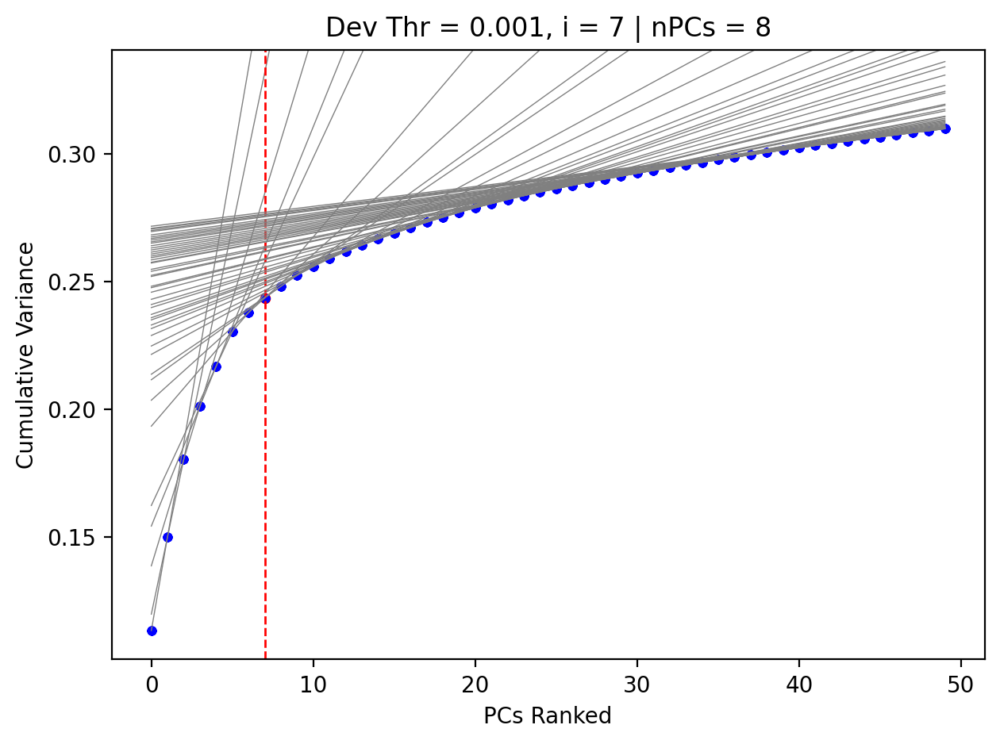

0.0009
Optimal nPCs = 8
Optimal PCs index = 7
Deviation = 0.00027042627334594727
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_0.0009.png


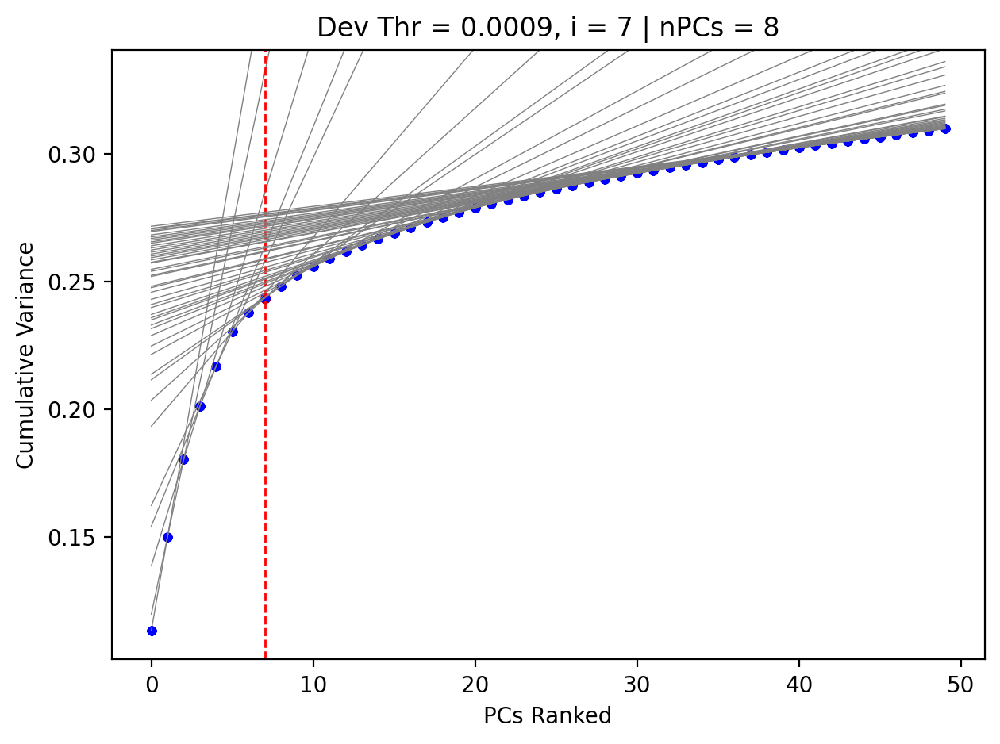

0.0008
Optimal nPCs = 8
Optimal PCs index = 7
Deviation = 0.00027042627334594727
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_0.0008.png


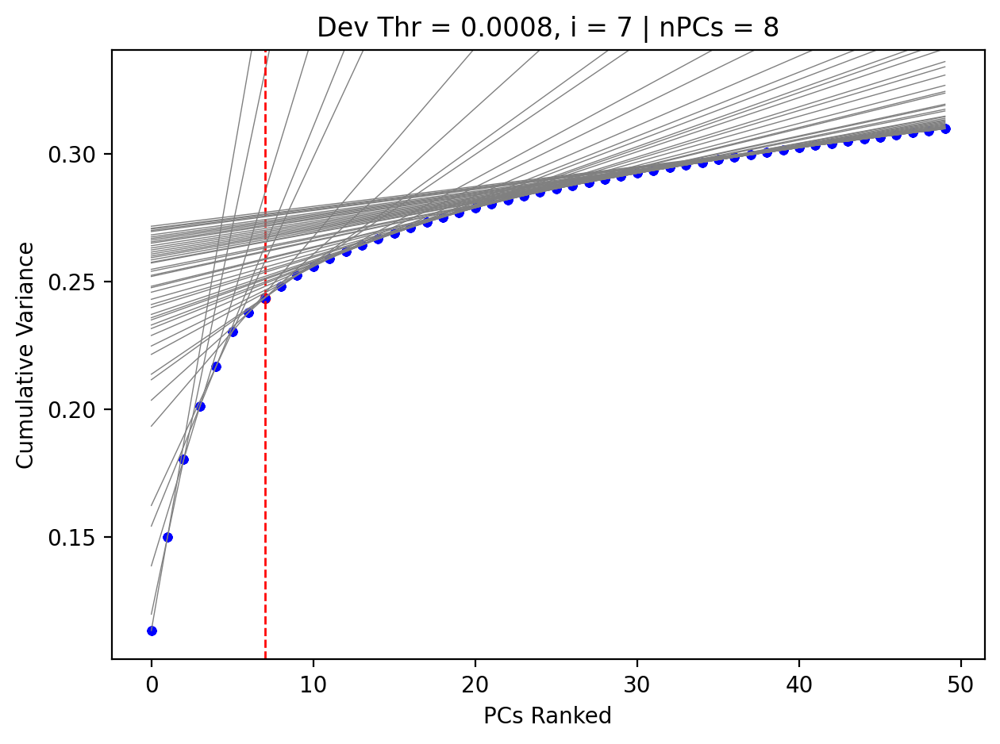

0.0007
Optimal nPCs = 8
Optimal PCs index = 7
Deviation = 0.00027042627334594727
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_0.0007.png


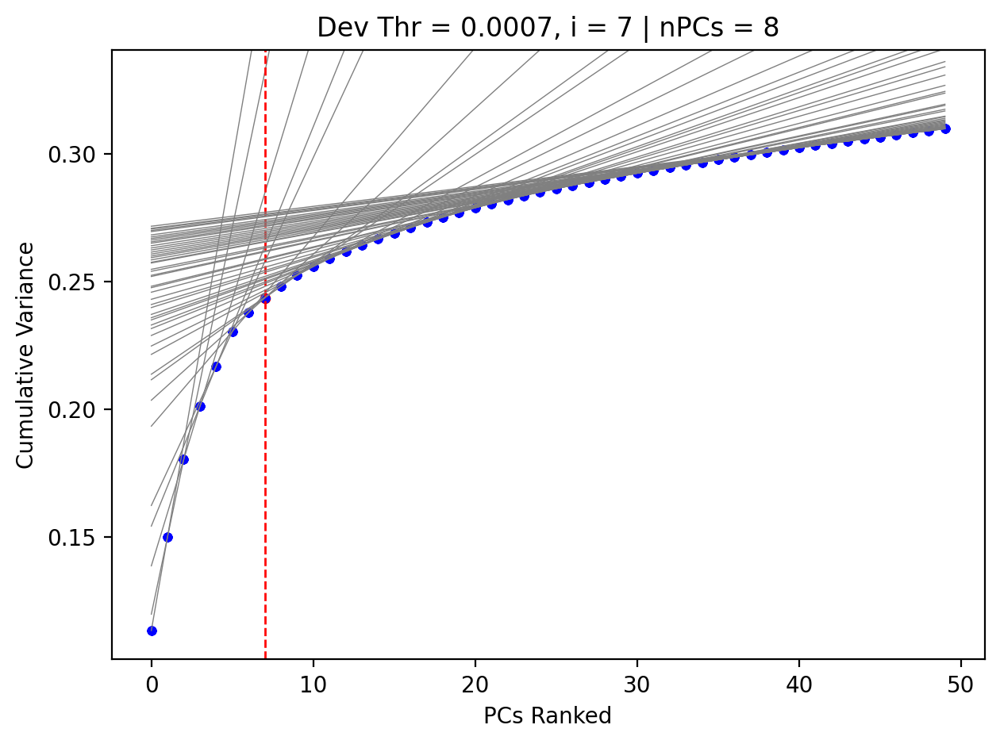

0.0006
Optimal nPCs = 8
Optimal PCs index = 7
Deviation = 0.00027042627334594727
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_0.0006.png


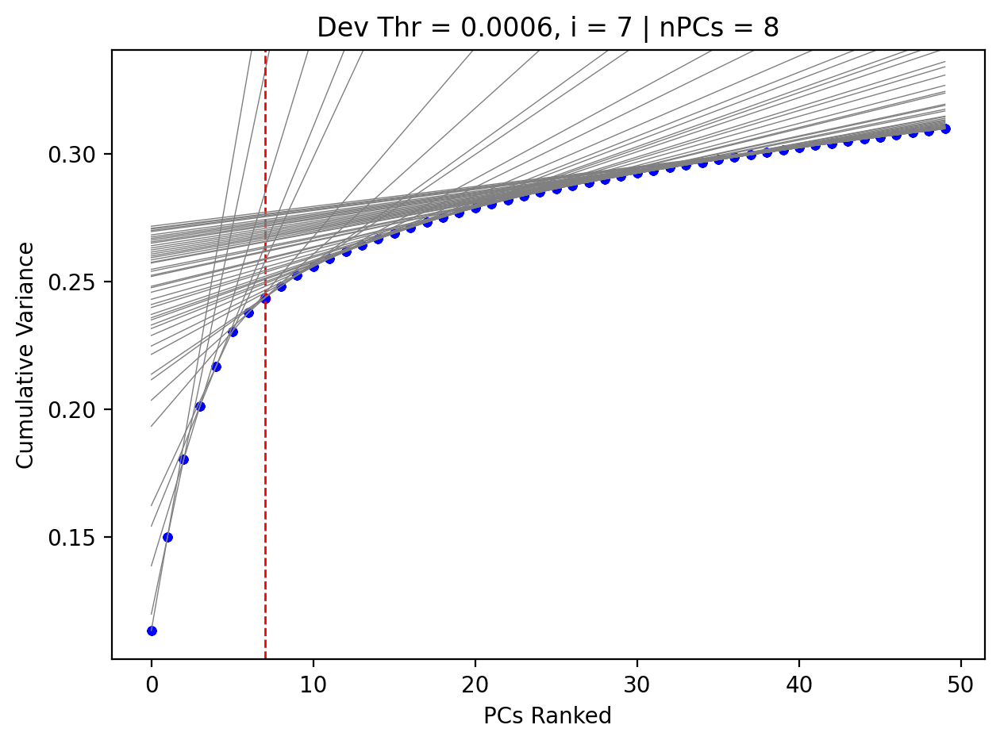

0.0005
Optimal nPCs = 8
Optimal PCs index = 7
Deviation = 0.00027042627334594727
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_0.0005.png


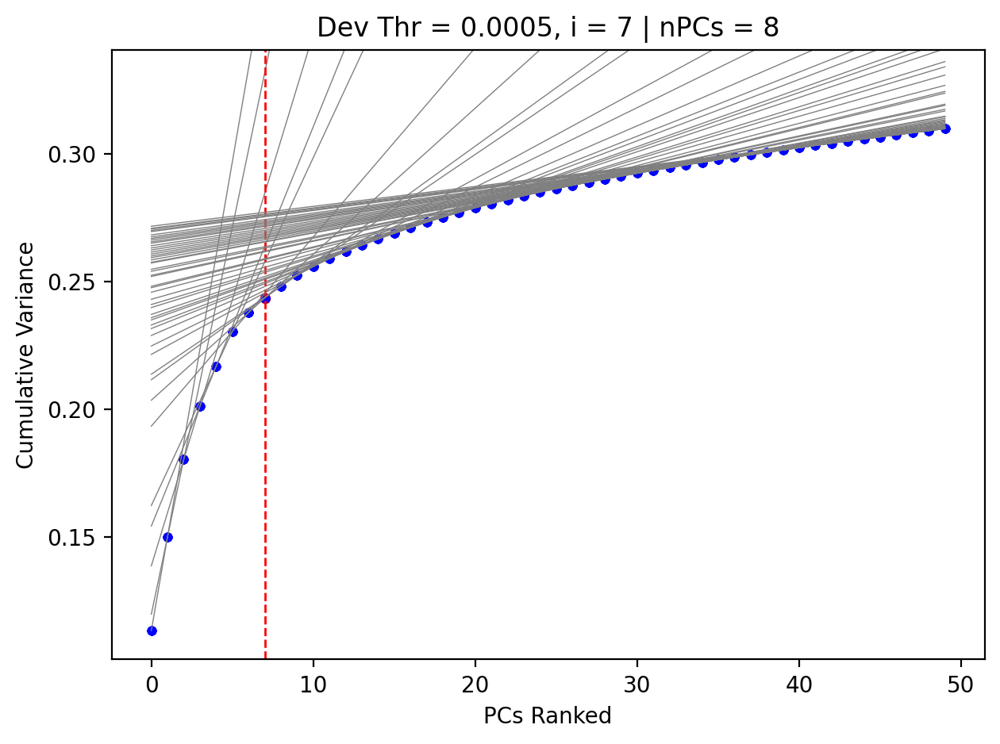

0.0004
Optimal nPCs = 8
Optimal PCs index = 7
Deviation = 0.00027042627334594727
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_0.0004.png


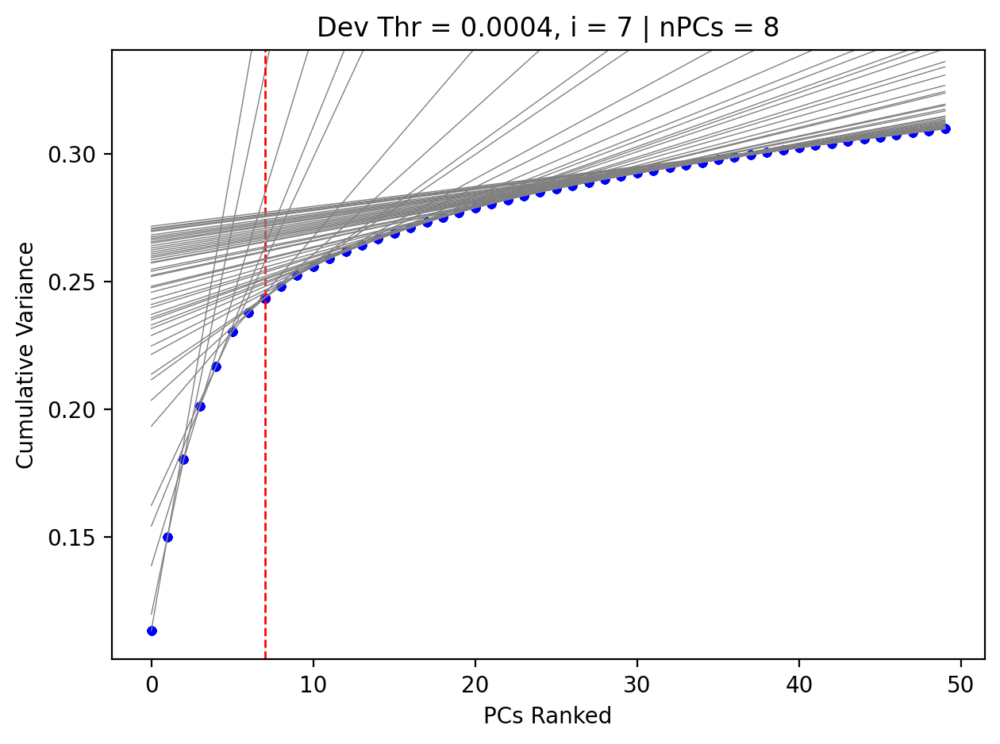

0.0003
Optimal nPCs = 8
Optimal PCs index = 7
Deviation = 0.00027042627334594727
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_0.0003.png


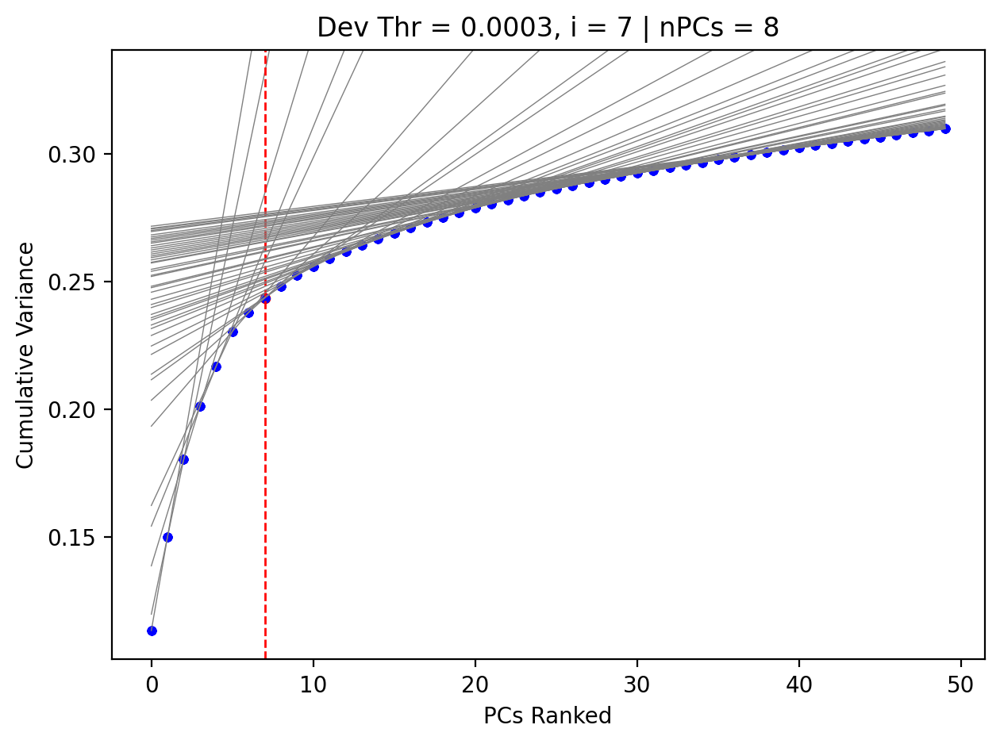

0.0002
Optimal nPCs = 13
Optimal PCs index = 12
Deviation = 0.0001061856746673584
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_0.0002.png


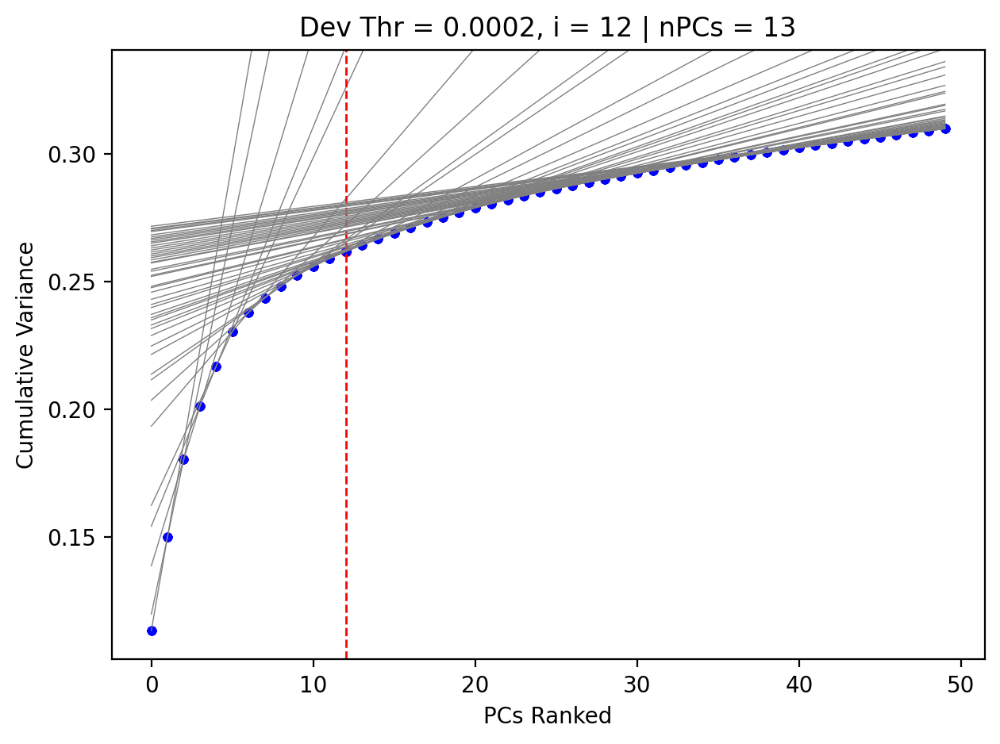

0.0001
Optimal nPCs = 15
Optimal PCs index = 14
Deviation = 5.7369470596313477e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_0.0001.png


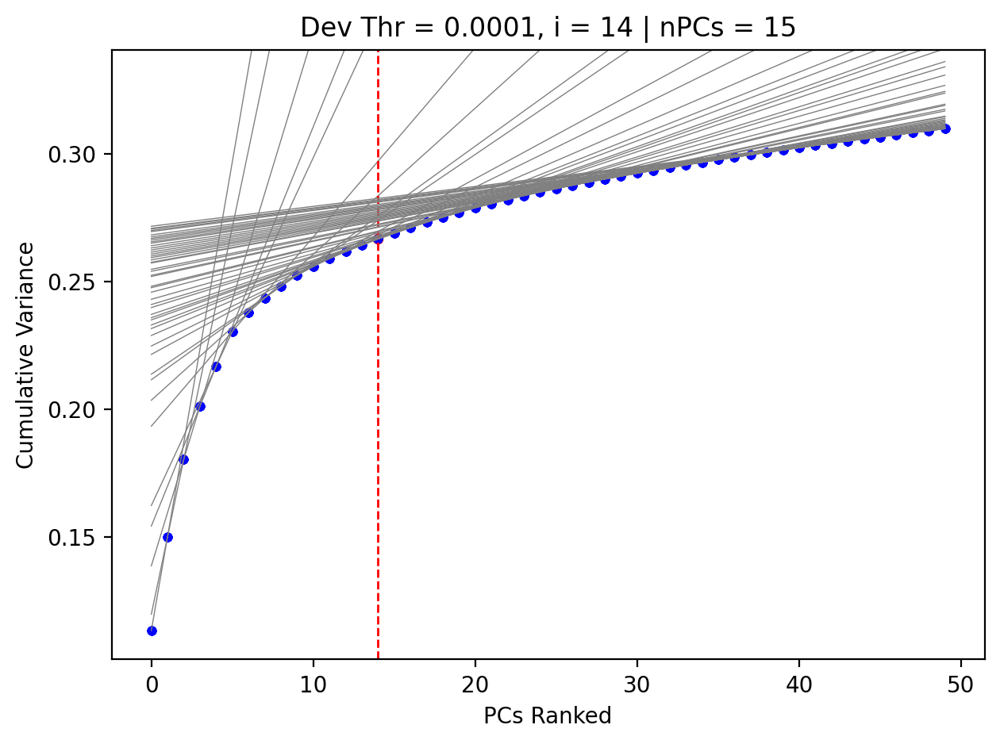

9e-05
Optimal nPCs = 15
Optimal PCs index = 14
Deviation = 5.7369470596313477e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_9e-05.png


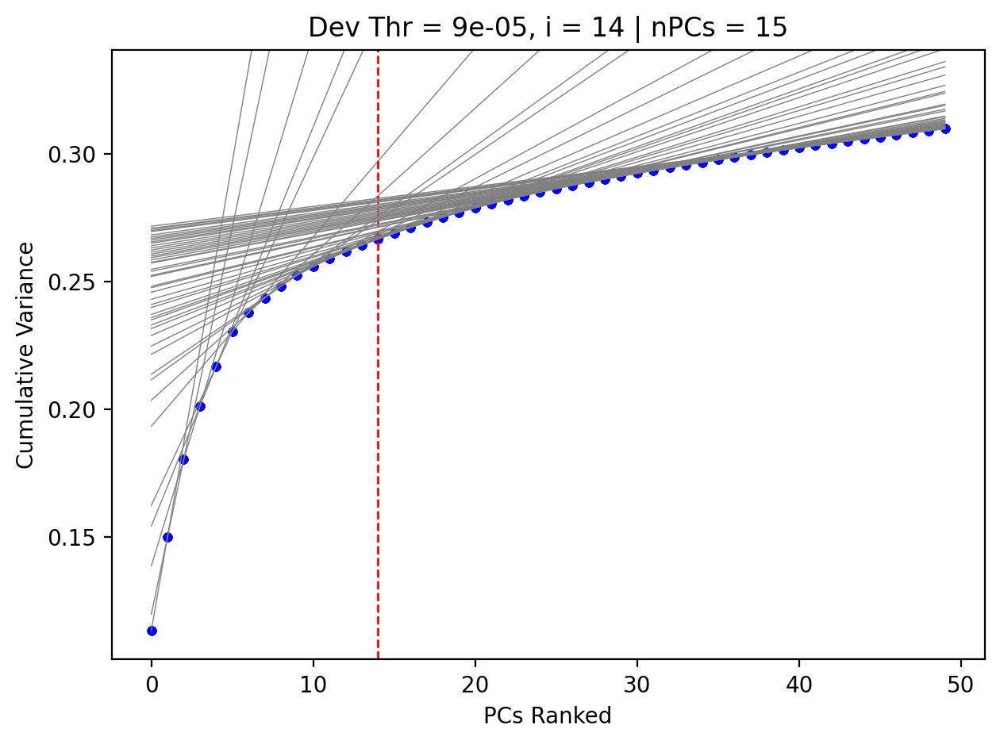

8e-05
Optimal nPCs = 15
Optimal PCs index = 14
Deviation = 5.7369470596313477e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_8e-05.png


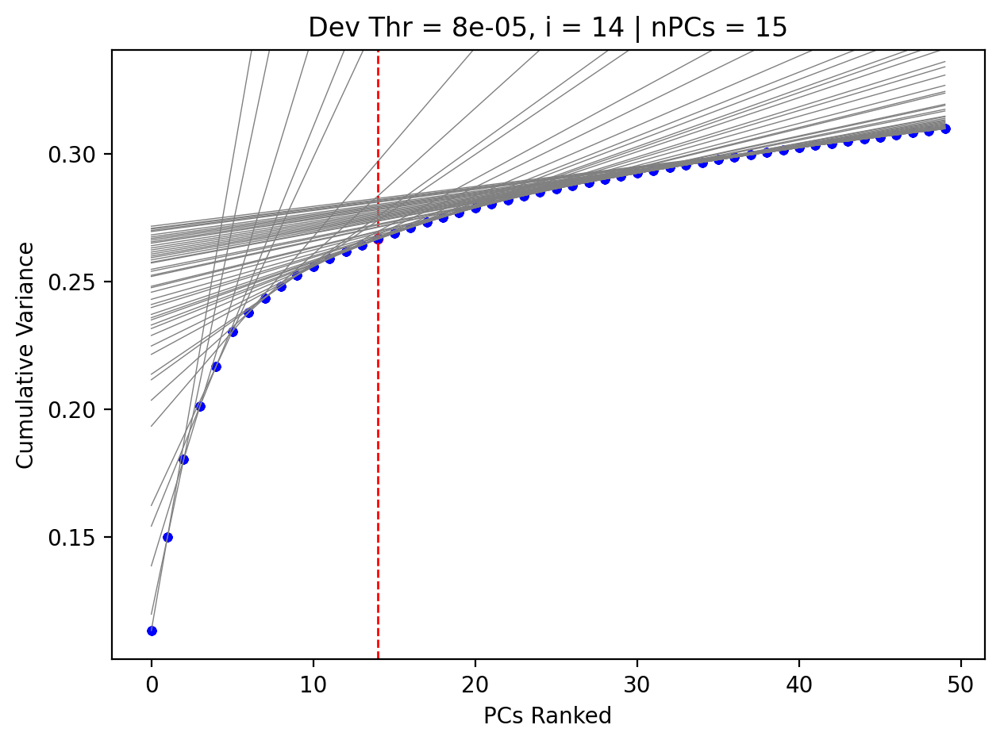

7e-05
Optimal nPCs = 15
Optimal PCs index = 14
Deviation = 5.7369470596313477e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_7e-05.png


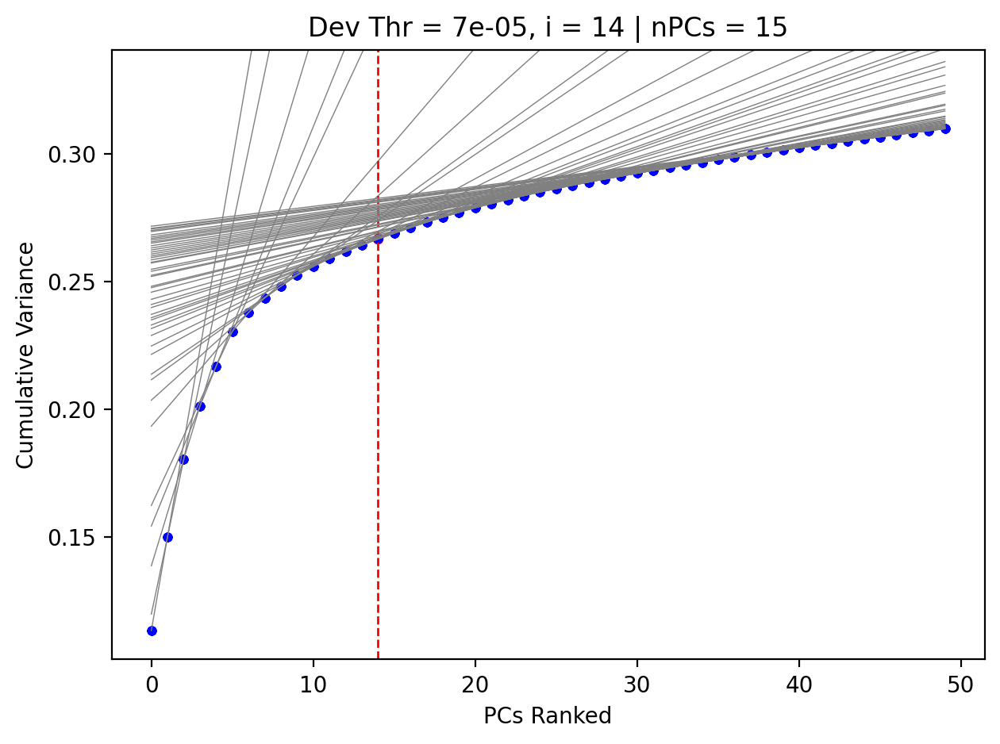

6e-05
Optimal nPCs = 15
Optimal PCs index = 14
Deviation = 5.7369470596313477e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_6e-05.png


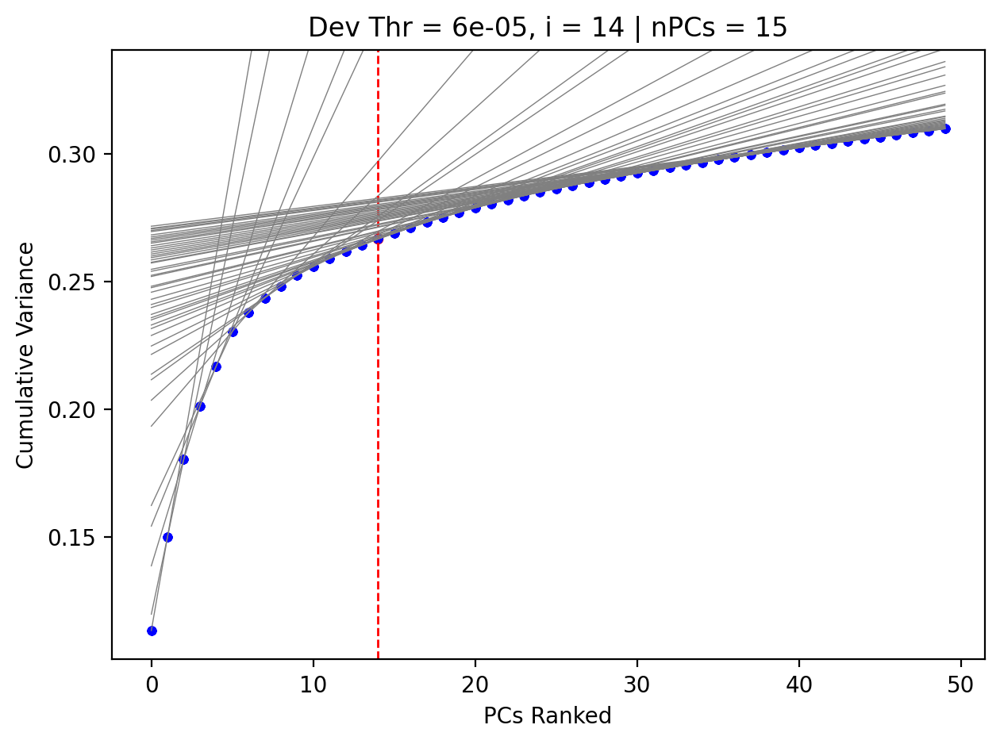

5e-05
Optimal nPCs = 22
Optimal PCs index = 21
Deviation = 2.4974346160888672e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_5e-05.png


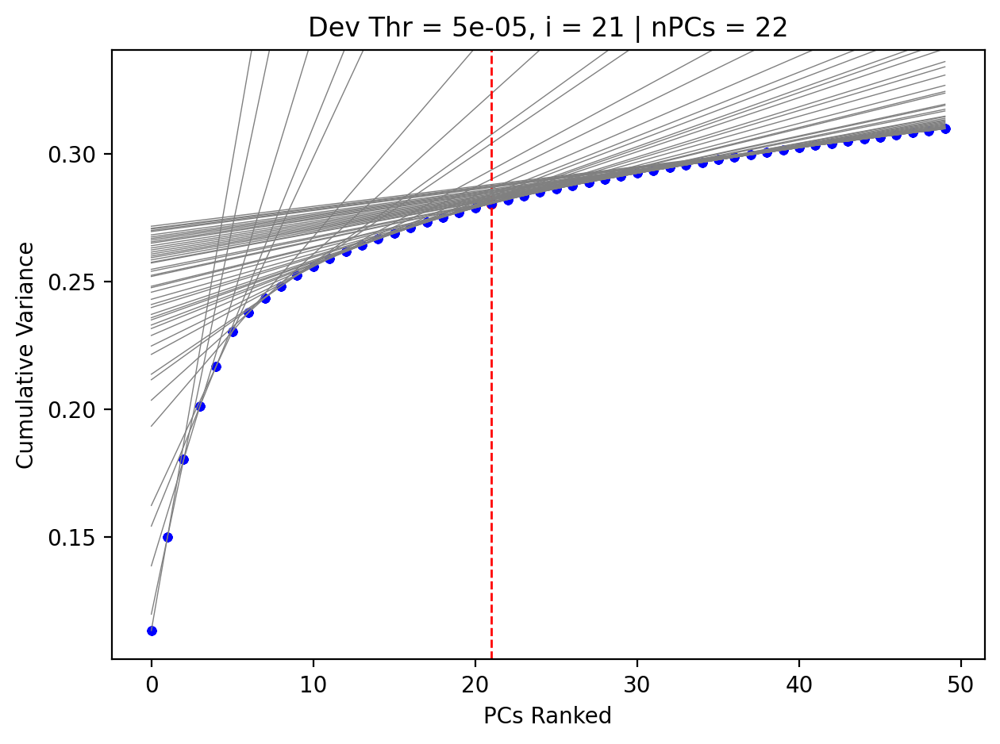

4e-05
Optimal nPCs = 22
Optimal PCs index = 21
Deviation = 2.4974346160888672e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_4e-05.png


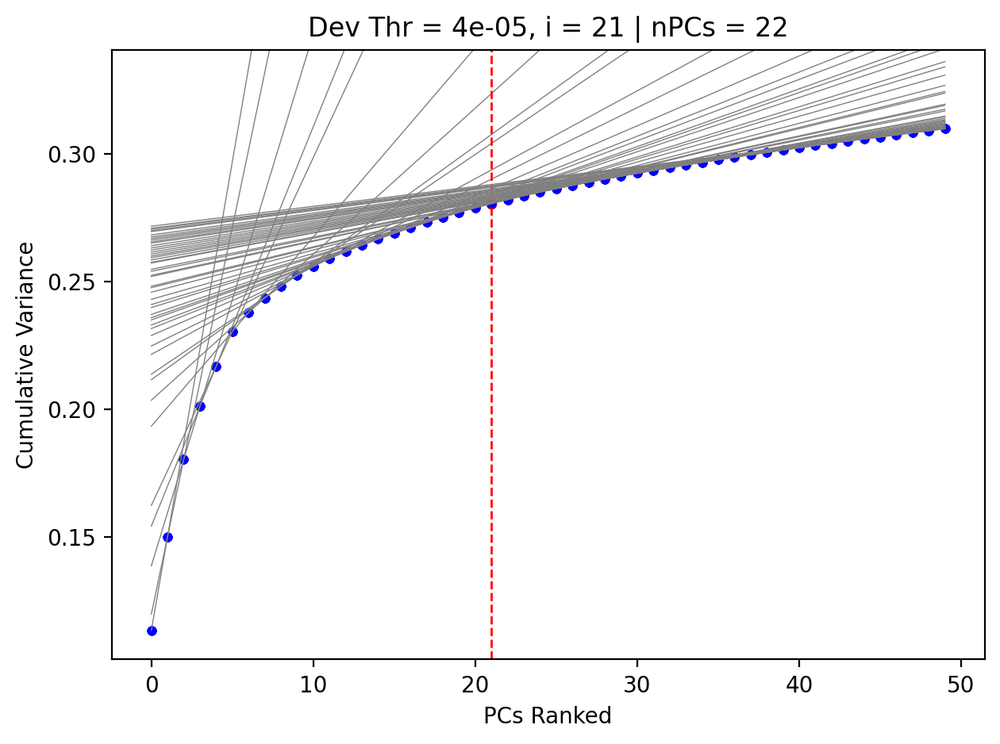

3e-05
Optimal nPCs = 22
Optimal PCs index = 21
Deviation = 2.4974346160888672e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_3e-05.png


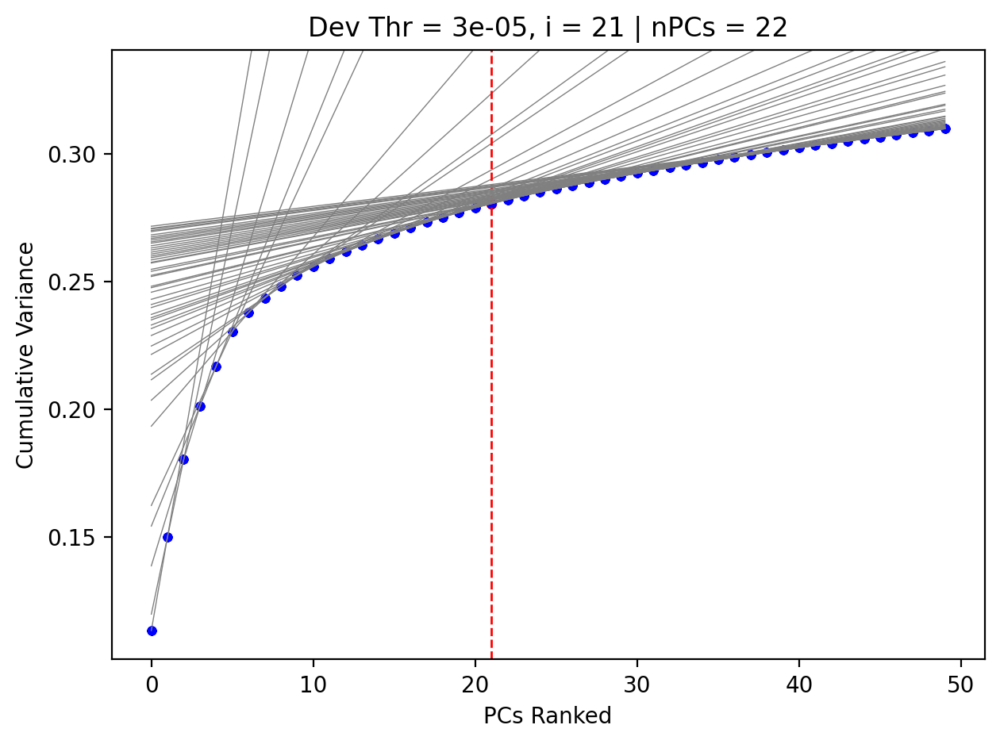

2e-05
Optimal nPCs = 24
Optimal PCs index = 23
Deviation = 1.811981201171875e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_2e-05.png


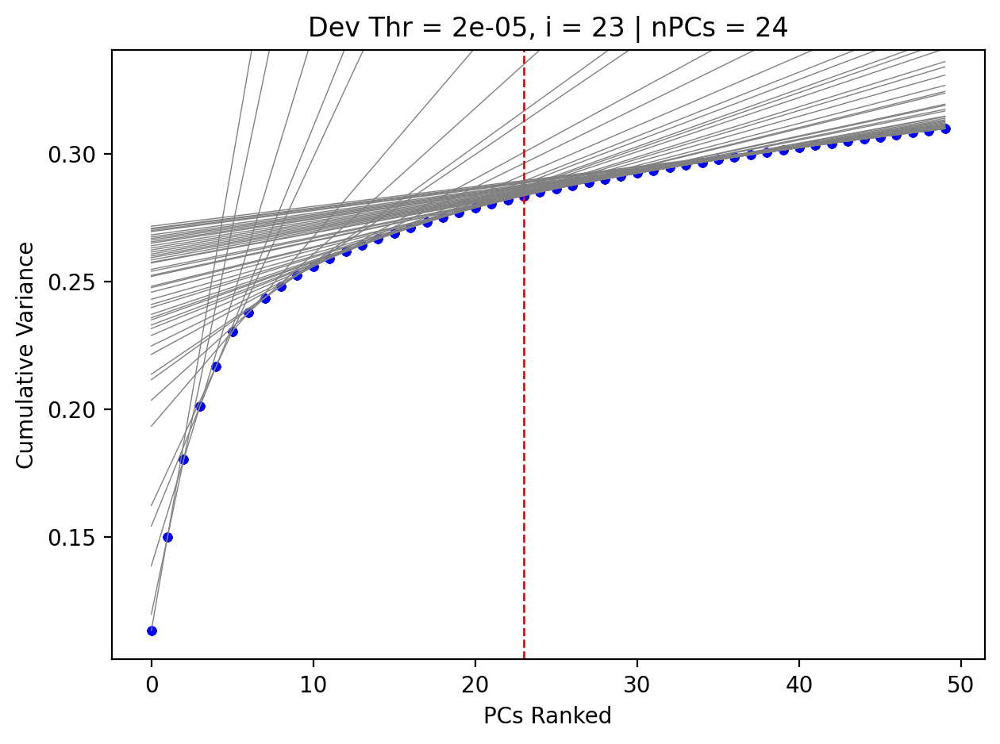

1e-05
Optimal nPCs = 28
Optimal PCs index = 27
Deviation = 9.953975677490234e-06
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_1e-05.png


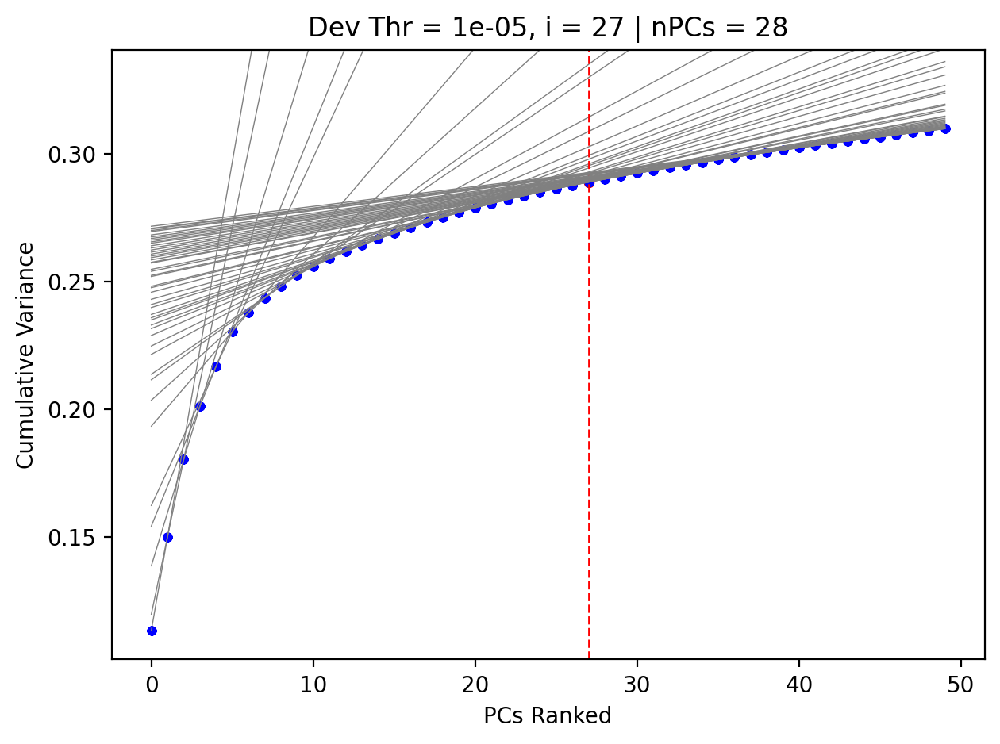

9e-06
Optimal nPCs = 46
Optimal PCs index = 45
Deviation = 5.900859832763672e-06
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_9e-06.png


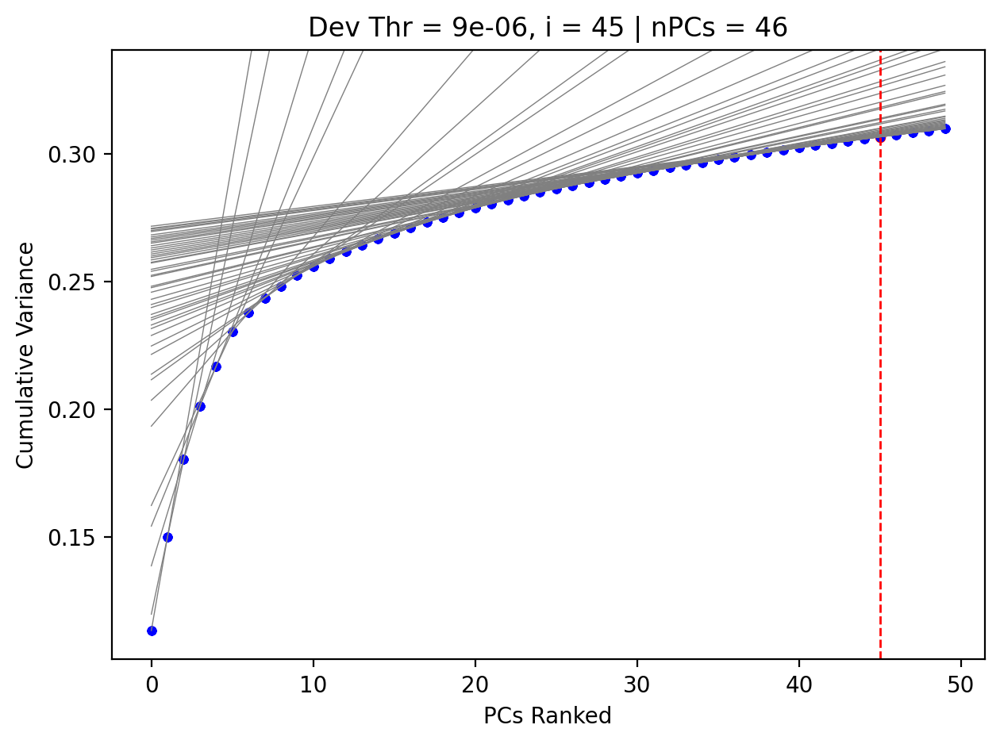

8e-06
Optimal nPCs = 46
Optimal PCs index = 45
Deviation = 5.900859832763672e-06
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_8e-06.png


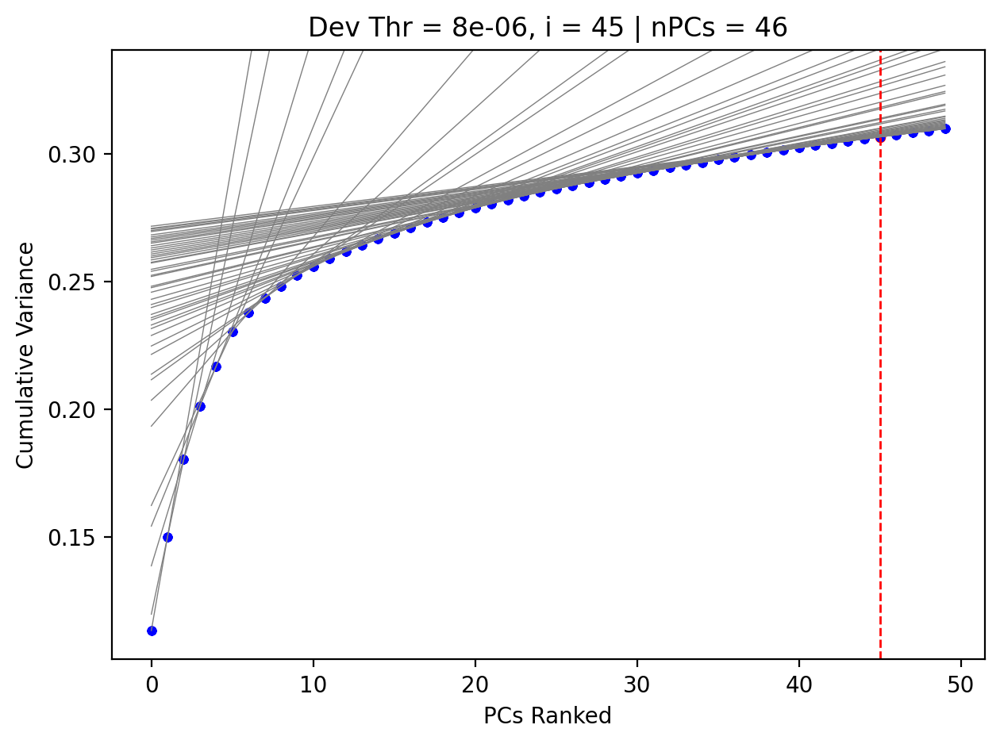

7e-06
Optimal nPCs = 46
Optimal PCs index = 45
Deviation = 5.900859832763672e-06
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_7e-06.png


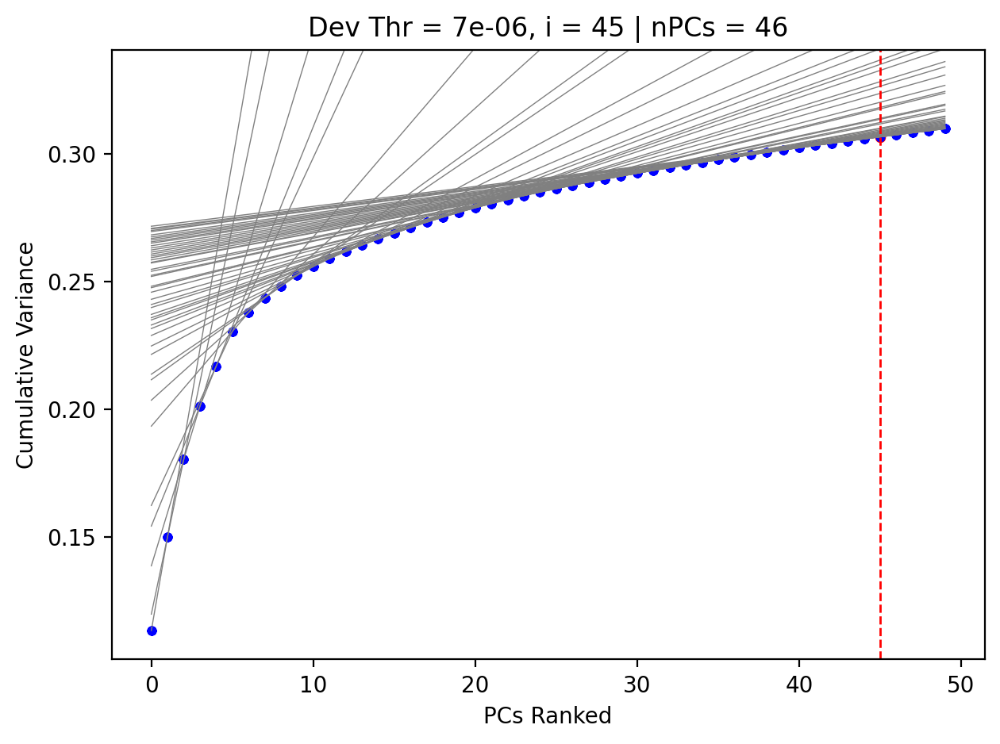

6e-06
Optimal nPCs = 46
Optimal PCs index = 45
Deviation = 5.900859832763672e-06
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_6e-06.png


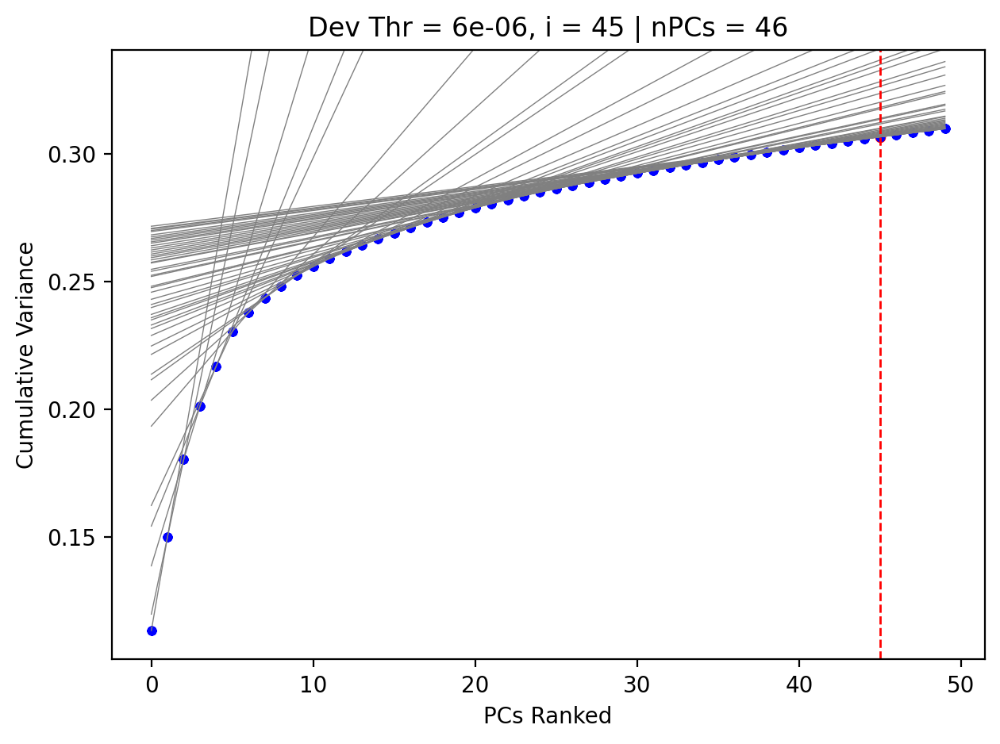

5e-06
Optimal nPCs = 50
Optimal PCs index = 49
Deviation = 1.1920928955078125e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_5e-06.png


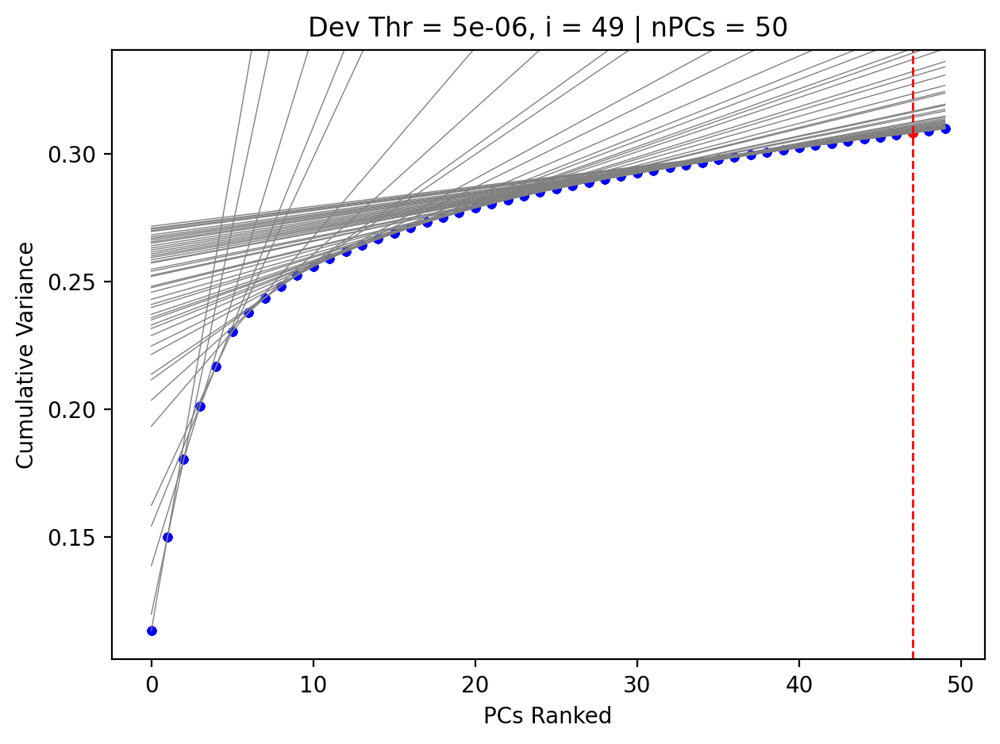

4e-06
Optimal nPCs = 50
Optimal PCs index = 49
Deviation = 1.1920928955078125e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_4e-06.png


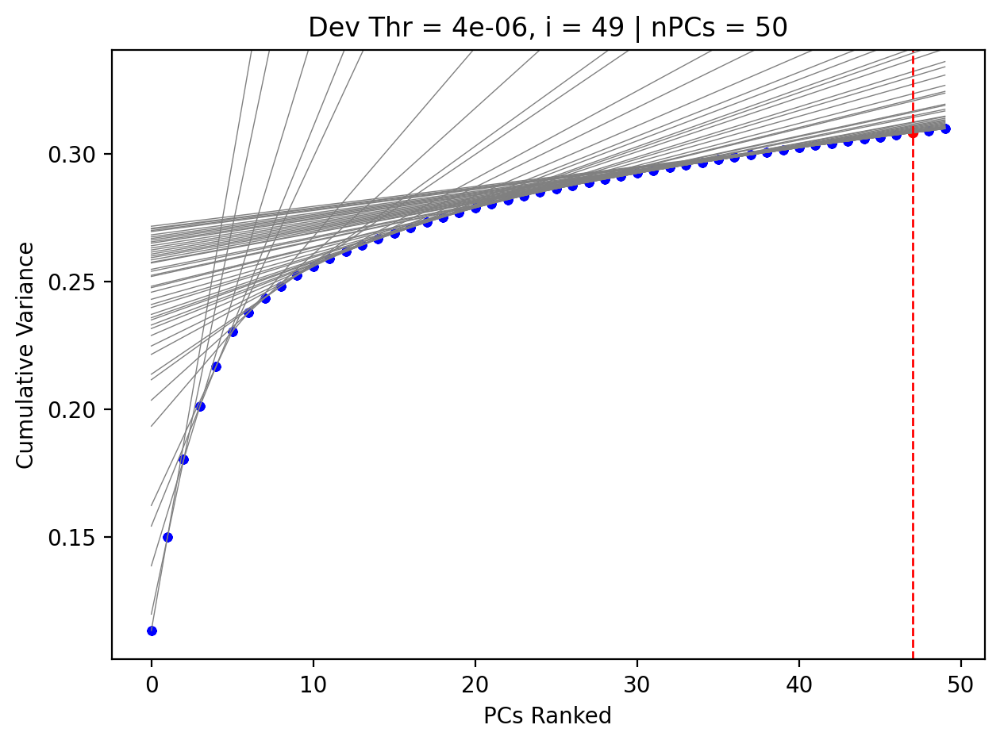

3e-06
Optimal nPCs = 50
Optimal PCs index = 49
Deviation = 1.1920928955078125e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_3e-06.png


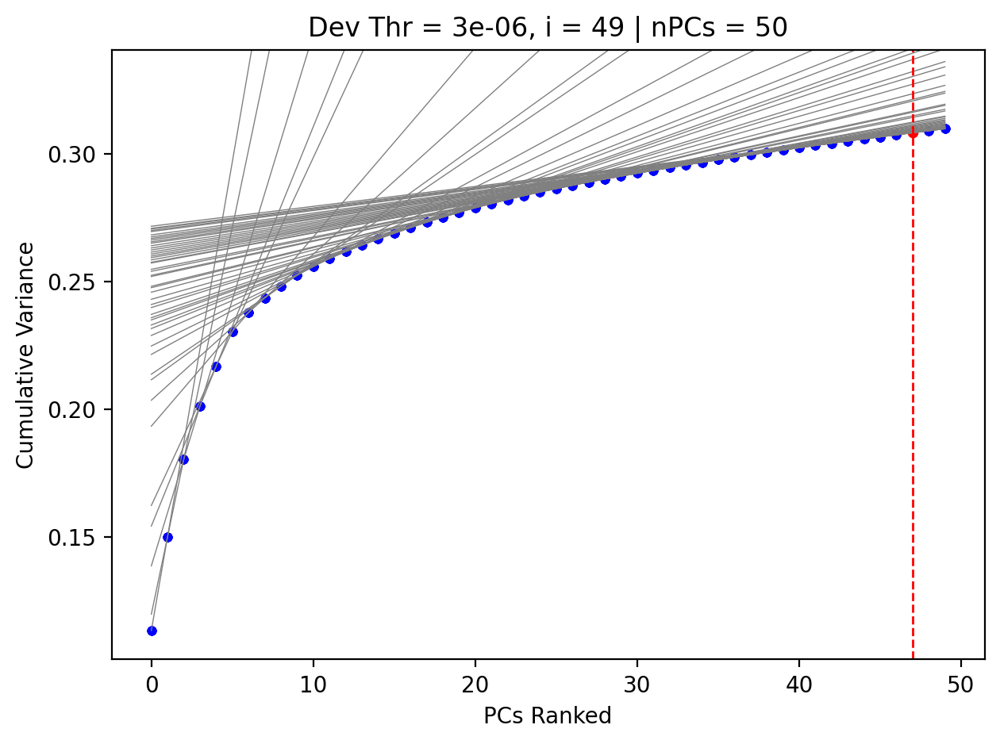

2e-06
Optimal nPCs = 50
Optimal PCs index = 49
Deviation = 1.1920928955078125e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_2e-06.png


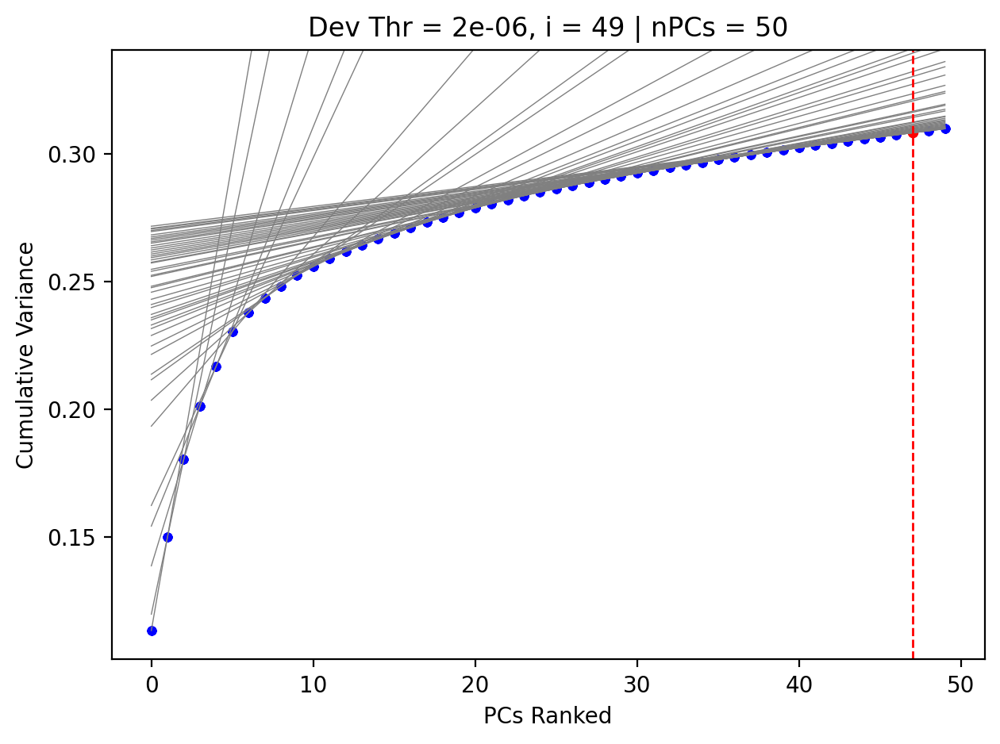

1e-08
Optimal nPCs = 50
Optimal PCs index = 49
Deviation = 1.1920928955078125e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_1e-08.png


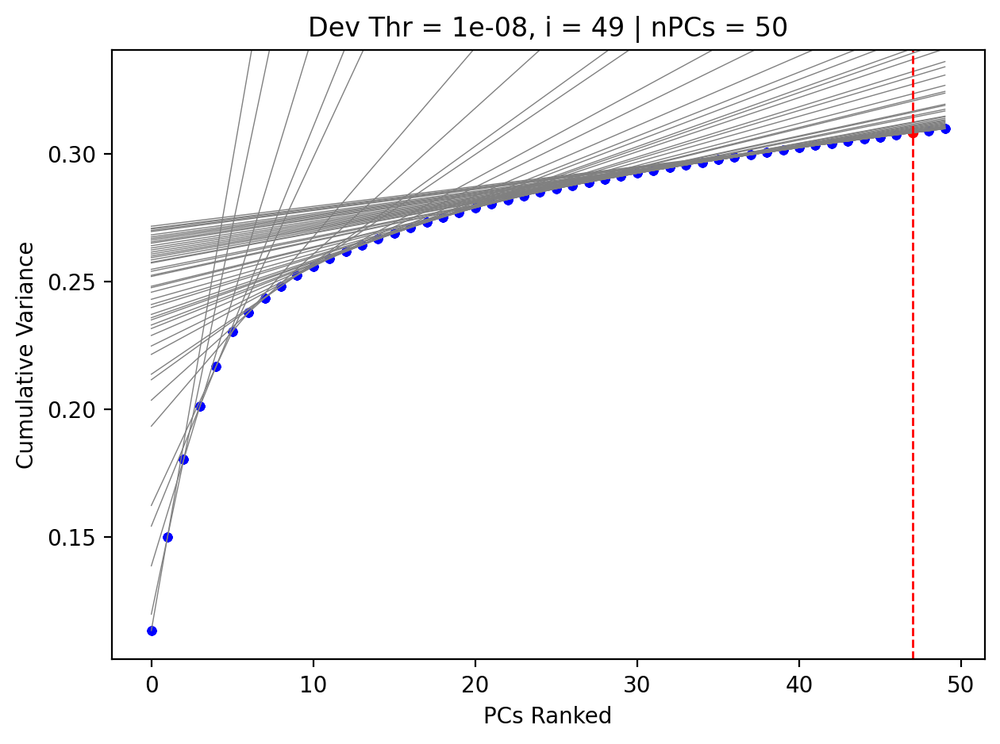

1e-09
Optimal nPCs = 50
Optimal PCs index = 49
Deviation = 1.1920928955078125e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_1e-09.png


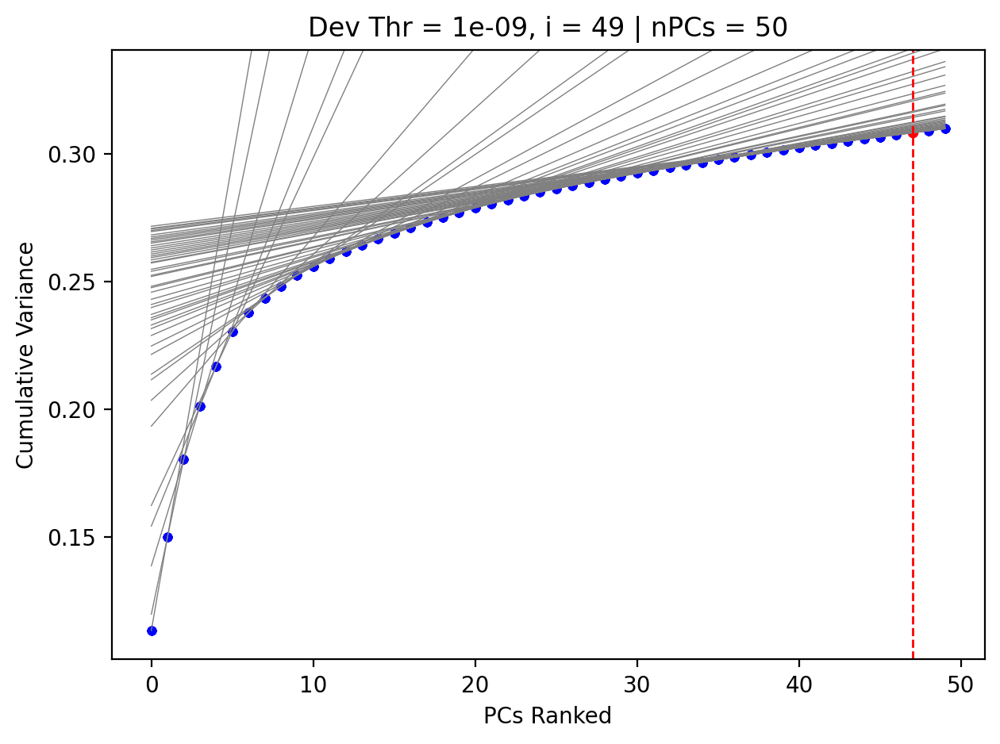

1e-10
Optimal nPCs = 50
Optimal PCs index = 49
Deviation = 1.1920928955078125e-05
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_1e-10.png


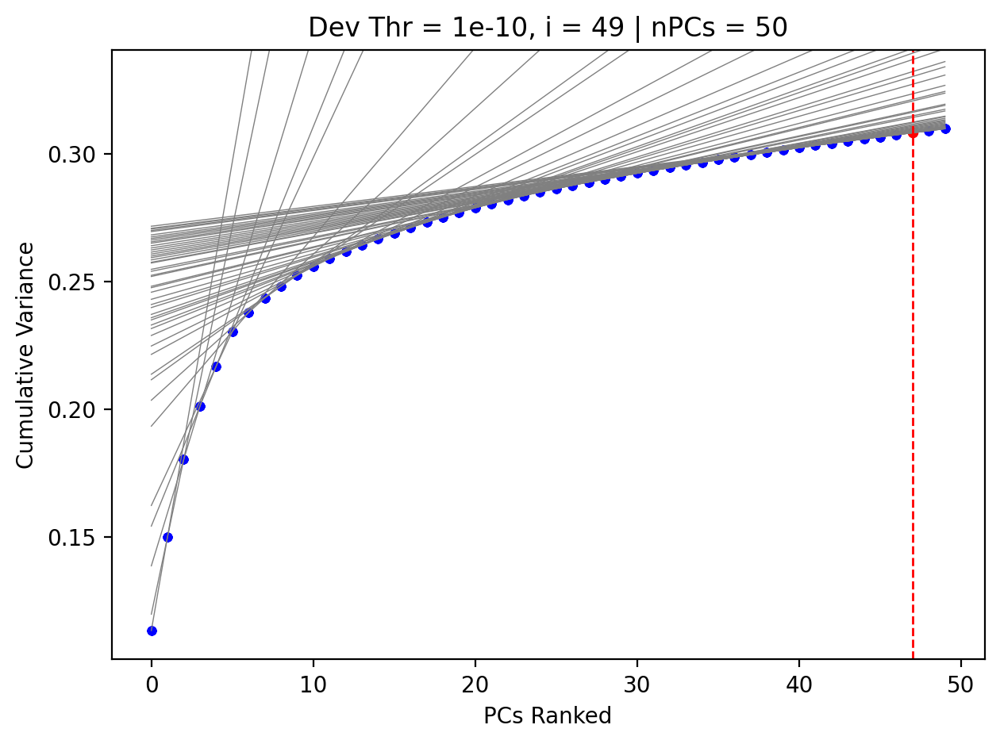

In [30]:
plt.style.use('default')
x = range(len(adata.uns['pca']['variance_ratio']))
y = np.cumsum(adata.uns['pca']['variance_ratio'])

end_line_slope = (y[-1] - y[-2]) / (x[-1] - x[-2])
end_line_int = y[-1] - end_line_slope*x[-1]

deviation = []
slopes = []

#dev_thr_list = [0.0001, 0.00009, 0.00008, 0.00007, 0.00006, 0.00005, 0.00004, 0.00003, 0.00002, 
#                0.00001, 0.000009, 0.000008, 0.000007, 0.000006, 0.000005, 0.000004, 0.000003, 0.000002,
#                0.000001]

dev_thr_list = [0.001, 0.0009, 0.0008, 0.0007, 0.0006, 0.0005, 0.0004, 0.0003, 0.0002,
                0.0001, 0.00009, 0.00008, 0.00007, 0.00006, 0.00005, 0.00004, 0.00003, 0.00002, 
                0.00001, 0.000009, 0.000008, 0.000007, 0.000006, 0.000005, 0.000004, 0.000003, 0.000002,
                0.00000001, 0.000000001, 0.0000000001]

thr_hit=False

opt_n_pcs_linear_dev_list=[]

#fig = plt.subplots(figsize=(8,8))

for dev_thr in dev_thr_list:
    
    print(dev_thr)
    thr_hit=False
    
    for i in range(len(x)-2):
        
        tmp_slope = (y[i+1] - y[i]) / (x[i+1] - x[i])
        tmp_int = y[i] - tmp_slope*x[i]
        
        plt.scatter(x, y, s=10, color='blue')
        
        y_line = [tmp_slope*x + tmp_int for x in x]
        
        tmp_dev = abs(y_line[i+2] - y[i+2])
        
        deviation.append(tmp_dev)
        
        slopes.append(tmp_slope)
        
        plt.plot(x, y_line, color='grey', linewidth=0.5)
        
        if (tmp_dev < dev_thr) and (thr_hit==False):
            print(f'Optimal nPCs = {i+1}')
            print(f'Optimal PCs index = {i}')
            print(f'Deviation = {tmp_dev}')
            
            opt_n_pcs_linear_dev = i
            opt_n_pcs_linear_dev_list.append(i)
            
            plt.scatter(x[i], y[i], s=15, color='red')
            plt.axvline(x[i], color='red', linestyle='--', linewidth=1)
            
            thr_hit=True
    
    if thr_hit==False:
        print(f'Optimal nPCs = {len(x)}')
        print(f'Optimal PCs index = {len(x)-1}')
        print(f'Deviation = {tmp_dev}')
        
        opt_n_pcs_linear_dev = len(x)-1
        opt_n_pcs_linear_dev_list.append(len(x)-1)
        
        plt.scatter(x[i], y[i], s=15, color='red')
        plt.axvline(x[i], color='red', linestyle='--', linewidth=1)
        
        thr_hit=True
        
    plt.xlabel('PCs Ranked')
    plt.ylabel('Cumulative Variance')
    plt.title(f'Dev Thr = {dev_thr}, i = {opt_n_pcs_linear_dev} | nPCs = {opt_n_pcs_linear_dev+1}')
    
    plt.ylim([y[0]*0.9, y[-1]*1.1])
    
    fn = output_dir + f'/PCA_linear_deviation_optimization_dev_thr_{dev_thr}.png'
    plt.tight_layout()
    
    print(fn)
    plt.savefig(fn, dpi=400)
    plt.show()

/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_dev_thr_stability.png


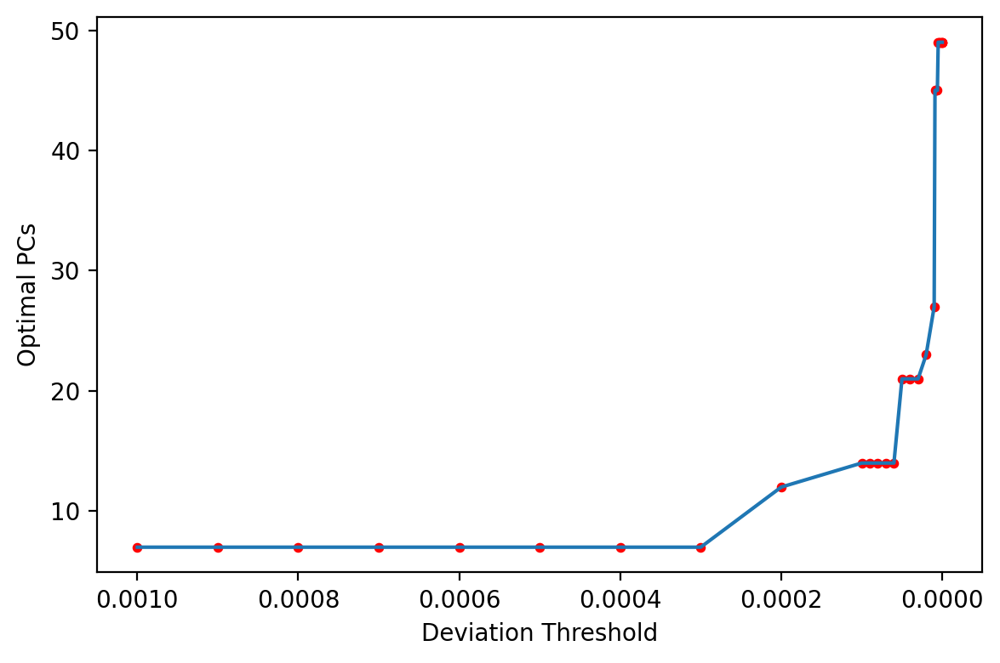

In [31]:
fig, ax = plt.subplots(figsize=(6,4))

plt.plot(dev_thr_list, opt_n_pcs_linear_dev_list)
plt.scatter(dev_thr_list, opt_n_pcs_linear_dev_list, color='red', s=10)

ax.invert_xaxis()

plt.ylabel('Optimal PCs')
plt.xlabel('Deviation Threshold')

fn = output_dir + f'/PCA_linear_deviation_optimization_dev_thr_stability.png'
plt.tight_layout()

print(fn)
plt.savefig(fn, dpi=400)

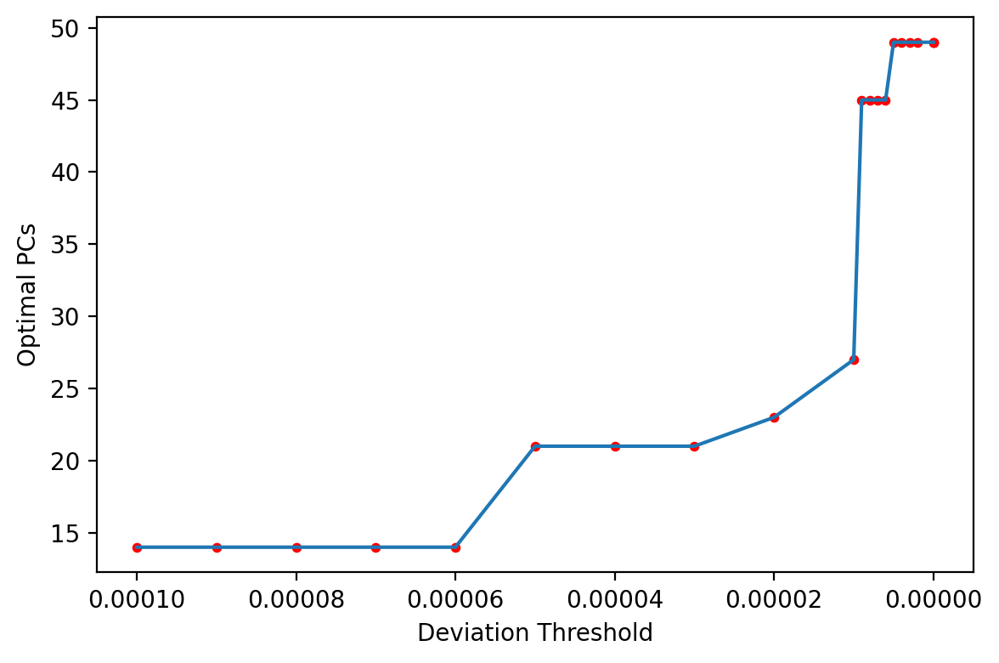

In [32]:
fig, ax = plt.subplots(figsize=(6,4))

plt.plot(dev_thr_list[9:], opt_n_pcs_linear_dev_list[9:])
plt.scatter(dev_thr_list[9:], opt_n_pcs_linear_dev_list[9:], color='red', s=10)

ax.invert_xaxis()

plt.ylabel('Optimal PCs')
plt.xlabel('Deviation Threshold')

fn = output_dir + f'/PCA_linear_deviation_optimization_dev_thr_stability_2.png'
plt.tight_layout()

Optimal nPCs = 28
Optimal PCs index = 27
Deviation = 9.953975677490234e-06
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//PCA_linear_deviation_optimization_AT2_1mo_SCLC_Traj.png


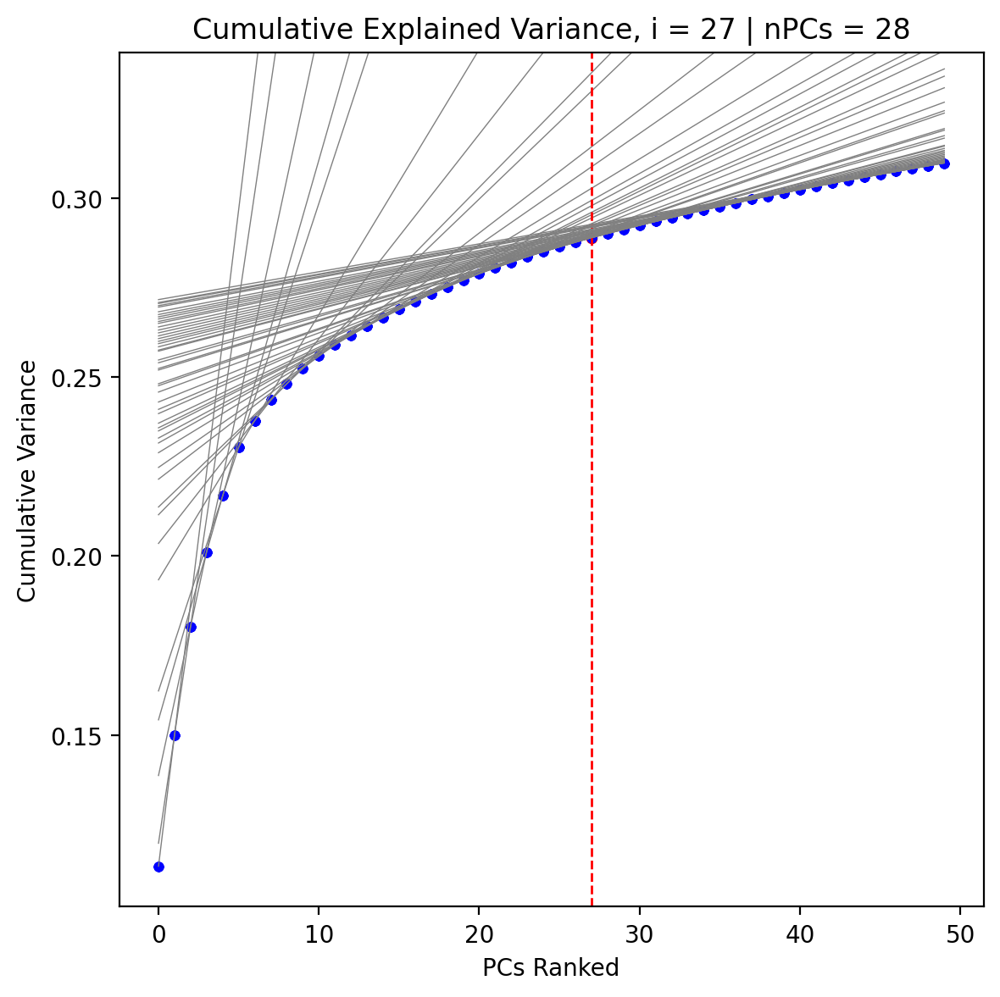

In [33]:
x = range(len(adata.uns['pca']['variance_ratio']))
y = np.cumsum(adata.uns['pca']['variance_ratio'])

deviation = []
slopes = []

dev_thr = 1e-5
thr_hit=False

opt_n_pcs_linear_dev=0

fig = plt.subplots(figsize=(6,6))

for i in range(len(x)-2):
    
    tmp_slope = (y[i+1] - y[i]) / (x[i+1] - x[i])
    tmp_int = y[i] - tmp_slope*x[i]
    
    plt.scatter(x, y, s=10, color='blue')
    
    y_line = [tmp_slope*x + tmp_int for x in x]
    
    tmp_dev = abs(y_line[i+2] - y[i+2])
    
    deviation.append(tmp_dev)
    
    slopes.append(tmp_slope)
    
    plt.plot(x, y_line, color='grey', linewidth=0.5)
    
    if (tmp_dev < dev_thr) and (thr_hit==False):
        print(f'Optimal nPCs = {i+1}')
        print(f'Optimal PCs index = {i}')
        print(f'Deviation = {tmp_dev}')
        
        opt_n_pcs_linear_dev = i
        
        plt.scatter(x[i], y[i], s=15, color='red')
        plt.axvline(x[i], color='red', linestyle='--', linewidth=1)
        
        thr_hit=True
    
    plt.xlabel('PCs Ranked')
    plt.ylabel('Cumulative Variance')
    plt.title(f'Cumulative Explained Variance, i = {opt_n_pcs_linear_dev} | nPCs = {opt_n_pcs_linear_dev+1}')
    
    plt.ylim([y[0]*0.9, y[-1]*1.1])
    
fn = output_dir + '/PCA_linear_deviation_optimization_AT2_1mo_SCLC_Traj.png'
plt.tight_layout()

print(fn)
plt.savefig(fn, dpi=400)

In [34]:
sc.tl.pca(adata, n_comps=opt_n_pcs_linear_dev+1)

computing PCA
    on highly variable genes
    with n_comps=28
    finished (0:00:13)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


In [47]:
# define a function that will give us the relevant output for the input k
def calc_cluster_characteristics(neighbor_graph, k):
    results = pd.Series(dtype = 'float64')
    results['k'] = k
    results['communities'], results['graph'], results['Q'] = sc.external.tl.phenograph(neighbor_graph, k=k, clustering_algo="leiden")
    results['components'], _ = scipy.sparse.csgraph.connected_components(results['graph'], directed = False)
    return results

# Make a copy of adata to make sure the original results aren't unintentionally overwritten:
#tmp = adata.copy()

cluster_chars_list = []
ks = np.arange(10, 101, 5)  # This is the range of k values we will look at

for k in ks:
    # Compute neighbors graph:
    sc.pp.neighbors(adata_HVG, n_neighbors=k, key_added=f'neighbors_{k}')
    
    cluster_chars_list.append(calc_cluster_characteristics(adata_HVG.obsp[f'neighbors_{k}_distances'], k))
    print('')
    print('------------------------------------------------')
    print('')

cluster_characteristics = pd.concat(cluster_chars_list, axis = 1).transpose()

computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28
    computed neighbors (0:00:05)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors_10']`
    `.obsp['neighbors_10_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_10_connectivities']`, weighted adjacency matrix (0:00:05)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 9.4898521900177 seconds
Running Leiden optimization
Leiden completed in 2.170612335205078 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 23.65965223312378 seconds


    finished (0:00:23)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:02)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors_15']`
    `.obsp['neighbors_15_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_15_connectivities']`, weighted adjacency matrix (0:00:03)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 10.558937549591064 seconds
Running Leiden optimization
Leiden completed in 2.5849008560180664 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 28.295891046524048 seconds


    finished (0:00:28)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:04)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors_20']`
    `.obsp['neighbors_20_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_20_connectivities']`, weighted adjacency matrix (0:00:04)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 10.85638427734375 seconds
Running Leiden optimization
Leiden completed in 2.6760220527648926 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 28.23670268058777 seconds


    finished (0:00:28)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:05)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors_25']`
    `.obsp['neighbors_25_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_25_connectivities']`, weighted adjacency matrix (0:00:06)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 698.1728839874268 seconds
Running Leiden optimization
Leiden completed in 2.1987364292144775 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 710.2416660785675 seconds


    finished (0:11:50)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:06)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors_30']`
    `.obsp['neighbors_30_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_30_connectivities']`, weighted adjacency matrix (0:00:07)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 10.271974086761475 seconds
Running Leiden optimization
Leiden completed in 1.2922735214233398 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 20.541234016418457 seconds


    finished (0:00:20)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:08)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors_35']`
    `.obsp['neighbors_35_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_35_connectivities']`, weighted adjacency matrix (0:00:09)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 12.459977865219116 seconds
Running Leiden optimization
Leiden completed in 6.196702003479004 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 28.730242490768433 seconds


    finished (0:00:28)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:11)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors_40']`
    `.obsp['neighbors_40_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_40_connectivities']`, weighted adjacency matrix (0:00:12)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 13.181931495666504 seconds
Running Leiden optimization
Leiden completed in 1.9395792484283447 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 25.309727668762207 seconds


    finished (0:00:25)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:12)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors_45']`
    `.obsp['neighbors_45_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_45_connectivities']`, weighted adjacency matrix (0:00:13)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 14.650008916854858 seconds
Running Leiden optimization
Leiden completed in 2.2205123901367188 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 27.041034698486328 seconds


    finished (0:00:27)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:13)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors_50']`
    `.obsp['neighbors_50_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_50_connectivities']`, weighted adjacency matrix (0:00:14)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 14.586326360702515 seconds
Running Leiden optimization
Leiden completed in 4.454999208450317 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 29.737224102020264 seconds


    finished (0:00:29)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:15)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors_55']`
    `.obsp['neighbors_55_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_55_connectivities']`, weighted adjacency matrix (0:00:17)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 15.573792695999146 seconds
Running Leiden optimization
Leiden completed in 1.9622571468353271 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 27.8433678150177 seconds


    finished (0:00:27)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:17)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors_60']`
    `.obsp['neighbors_60_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_60_connectivities']`, weighted adjacency matrix (0:00:19)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 15.63104510307312 seconds
Running Leiden optimization
Leiden completed in 4.038533926010132 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 30.275918006896973 seconds


    finished (0:00:30)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:19)
    computed connectivities (0:00:01)
    finished: added to `.uns['neighbors_65']`
    `.obsp['neighbors_65_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_65_connectivities']`, weighted adjacency matrix (0:00:21)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 15.357332706451416 seconds
Running Leiden optimization
Leiden completed in 2.311069965362549 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 27.488628387451172 seconds


    finished (0:00:27)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:18)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors_70']`
    `.obsp['neighbors_70_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_70_connectivities']`, weighted adjacency matrix (0:00:21)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 15.069844722747803 seconds
Running Leiden optimization
Leiden completed in 3.854168653488159 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 29.220556259155273 seconds


    finished (0:00:29)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:21)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors_75']`
    `.obsp['neighbors_75_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_75_connectivities']`, weighted adjacency matrix (0:00:23)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 15.834296703338623 seconds
Running Leiden optimization
Leiden completed in 3.333991050720215 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 29.55964732170105 seconds


    finished (0:00:29)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:23)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors_80']`
    `.obsp['neighbors_80_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_80_connectivities']`, weighted adjacency matrix (0:00:25)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 16.59166932106018 seconds
Running Leiden optimization
Leiden completed in 2.845405101776123 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 30.331746339797974 seconds


    finished (0:00:30)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:23)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors_85']`
    `.obsp['neighbors_85_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_85_connectivities']`, weighted adjacency matrix (0:00:26)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 16.531224250793457 seconds
Running Leiden optimization
Leiden completed in 2.829008102416992 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 30.487943410873413 seconds


    finished (0:00:30)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:25)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors_90']`
    `.obsp['neighbors_90_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_90_connectivities']`, weighted adjacency matrix (0:00:27)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 16.50296115875244 seconds
Running Leiden optimization
Leiden completed in 3.8367888927459717 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 29.94632625579834 seconds


    finished (0:00:29)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:18)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors_95']`
    `.obsp['neighbors_95_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_95_connectivities']`, weighted adjacency matrix (0:00:21)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 15.057428359985352 seconds
Running Leiden optimization
Leiden completed in 3.07602858543396 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 27.50031805038452 seconds


    finished (0:00:27)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 28



------------------------------------------------



    computed neighbors (0:00:17)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors_100']`
    `.obsp['neighbors_100_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_100_connectivities']`, weighted adjacency matrix (0:00:20)
PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 15.17906403541565 seconds
Running Leiden optimization
Leiden completed in 3.0295631885528564 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 26.94695472717285 seconds


    finished (0:00:26)



------------------------------------------------



/workdir/varmus_single_cell/merged_pipeline_out/TEC_out/Trajectory_Analyses_RERUN_v5//Phenograph_cluster_metrics.png


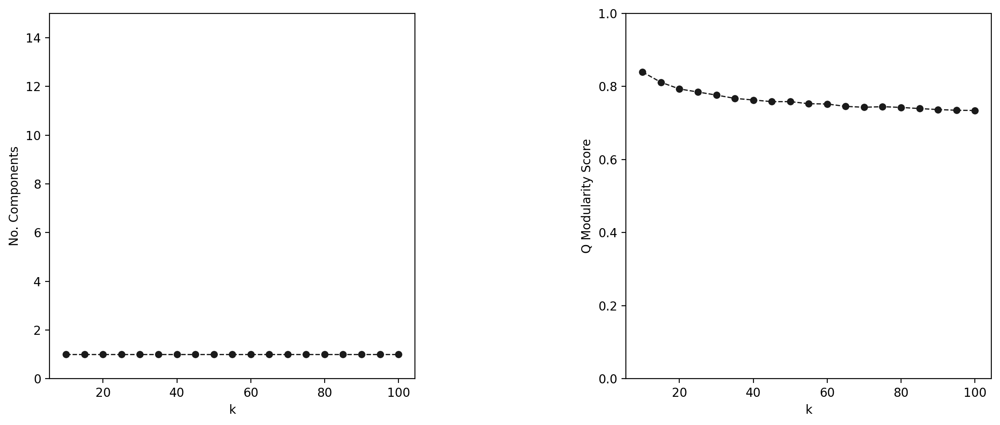

In [48]:
k = cluster_characteristics['k']
no_components = cluster_characteristics['components']
Q = cluster_characteristics['Q']

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(14, 5))
ax1.set_box_aspect(1)
ax1.plot(k, no_components, color='k', marker='o', linestyle='dashed', linewidth=1, markersize=5, )
ax1.set_xlabel('k')
ax1.set_ylabel('No. Components')
ax1.set_ylim(0, 15)

ax2.set_box_aspect(1)
ax2.plot(k, Q, color='k', marker='o', linestyle='dashed', linewidth=1, markersize=5)
ax2.set_xlabel('k')
ax2.set_ylabel('Q Modularity Score')
ax2.set_ylim(0, 1)

fn = output_dir + '/Phenograph_cluster_metrics.png'
plt.tight_layout()

print(fn)
plt.savefig(fn, dpi=400)

/workdir/varmus_single_cell/merged_pipeline_out/TEC_out/Trajectory_Analyses_RERUN_v5//Phenograph_clustering_knn_ARI_heatmap.png


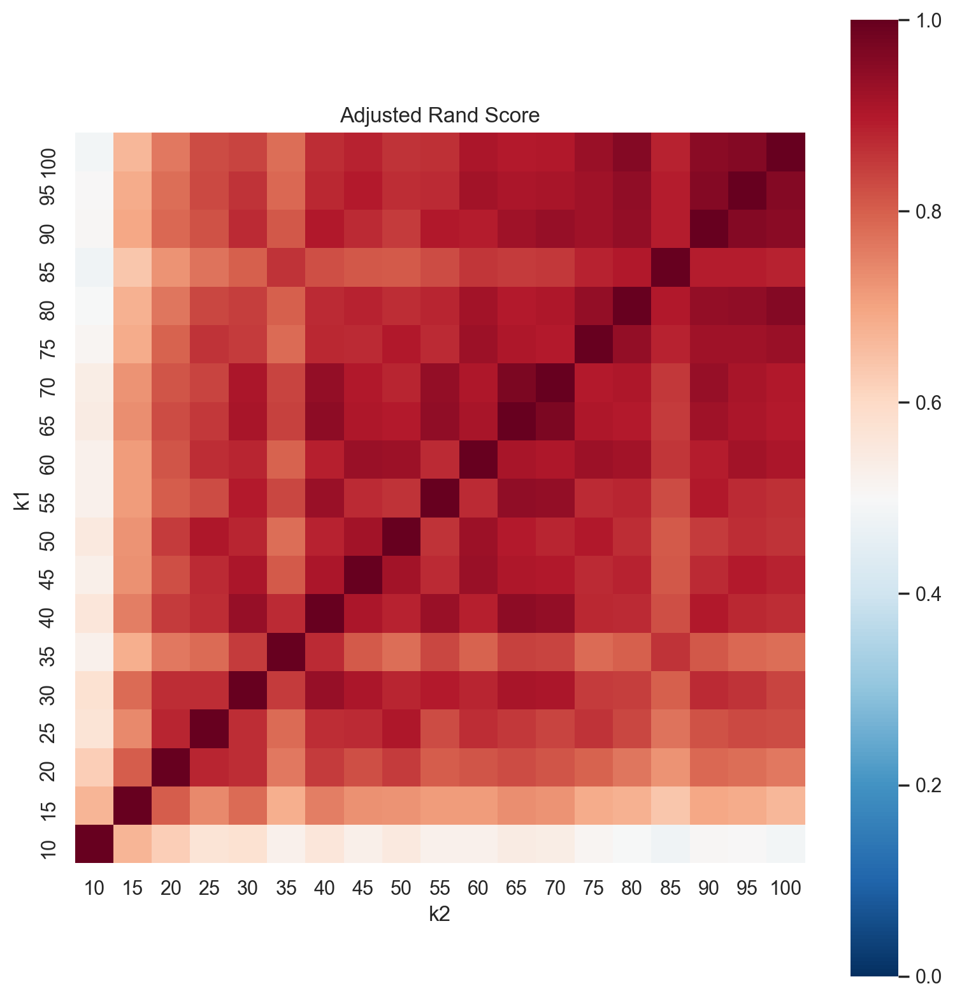

In [53]:
n = len(ks)
Rand_indices = pd.DataFrame(np.zeros((n,n)), index = ks, columns = ks)

#n_sub = False
n_sub = 100000

Rand_indices.index.name = 'k1'
Rand_indices.columns.name = 'k2'

for i in range(n):
    for j in range(n):
        Rand_indices.iloc[i, j] = adjusted_rand_score(cluster_characteristics['communities'][i],
                                                          cluster_characteristics['communities'][j])
        
plt.figure(figsize = (8,8))
sns.heatmap(Rand_indices, cmap=plt.cm.RdBu_r, square=True, vmin=0, vmax=1).invert_yaxis()
sns.set(font_scale=1)
plt.xlabel('k2')
plt.ylabel('k1')
plt.title('Adjusted Rand Score')

fn = output_dir + '/Phenograph_clustering_knn_ARI_heatmap.png'
plt.tight_layout()

print(fn)
plt.savefig(fn, dpi=400)

In [ ]:
# Compute Neighbors Graph:
k = 40
sc.pp.neighbors(adata, n_neighbors=k, key_added=f'neighbors_{k}')

In [37]:
# define a function that will give us the relevant output for the input k
def calc_cluster_characteristics(neighbor_graph, k):
    results = pd.Series(dtype = 'float64')
    results['k'] = k
    results['communities'], results['graph'], results['Q'] = sc.external.tl.phenograph(neighbor_graph, k=k, clustering_algo="leiden")
    results['components'], _ = scipy.sparse.csgraph.connected_components(results['graph'], directed = False)
    return results

# Add clusters to anndata:
clusters = calc_cluster_characteristics(adata.obsp[f'neighbors_{k}_distances'], k)

PhenoGraph clustering


Using neighbor information from provided graph, rather than computing neighbors directly
Jaccard graph constructed in 6.371874809265137 seconds
Running Leiden optimization
Leiden completed in 1.29032301902771 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 13.64216923713684 seconds


    finished (0:00:13)


In [40]:
adata.obs[f'pheno_{k}'] = clusters['communities'].tolist()

#### Diffusion Components

In [55]:
adata.X = adata.layers['logX']

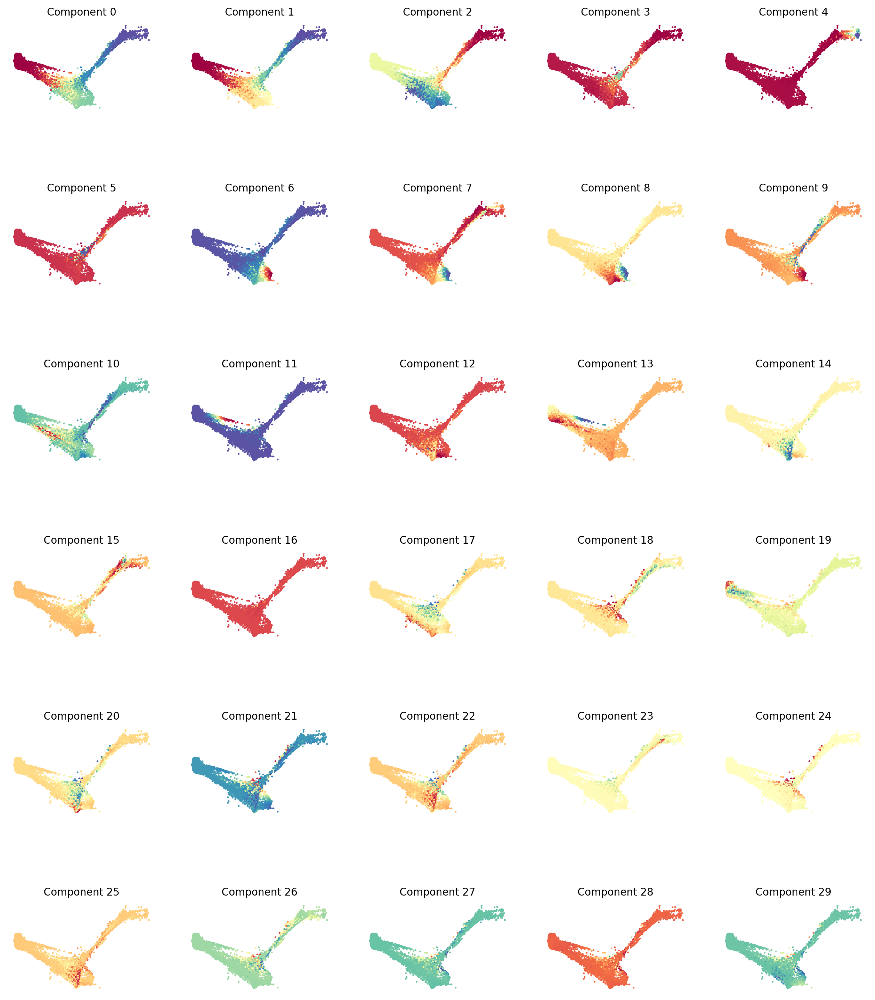

In [41]:
k = 40
n_dcs = 30

neighbors_key = f'neighbors_{k}_distances'

dm_res = palantir.utils.run_diffusion_maps(adata.obsp[neighbors_key], n_components=n_dcs)
ms_data = palantir.utils.determine_multiscale_space(dm_res, n_eigs=n_dcs) # and here!!

dm_res["EigenVectors"].index = adata.obs.index

palantir.plot.plot_diffusion_components(
    # convert the draw-graph array in adata.obsm to a pandas dataframe with cells 
    # as indices and 'x','y' as columns:
    
    tsne = pd.DataFrame(adata.obsm['X_draw_graph_fa'], 
                        index=adata.obs.index, 
                        columns=['x','y']), 
                        dm_res = dm_res)

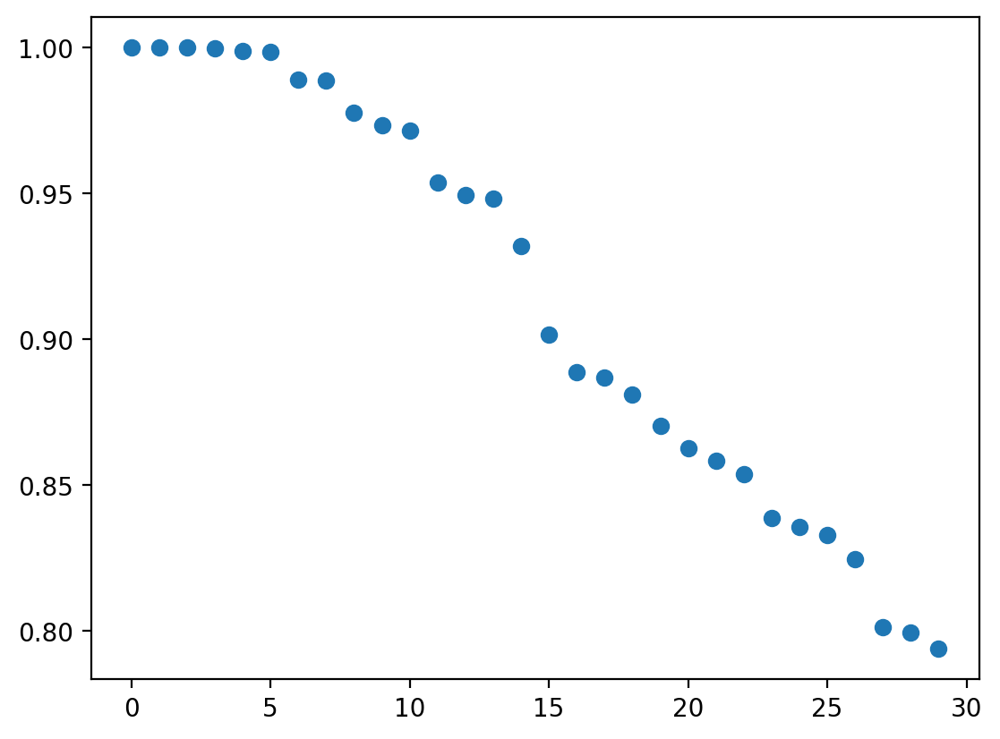

In [42]:
matplotlib.style.use('default')

plt.scatter(dm_res['EigenValues'].keys().tolist(), dm_res['EigenValues'].values)

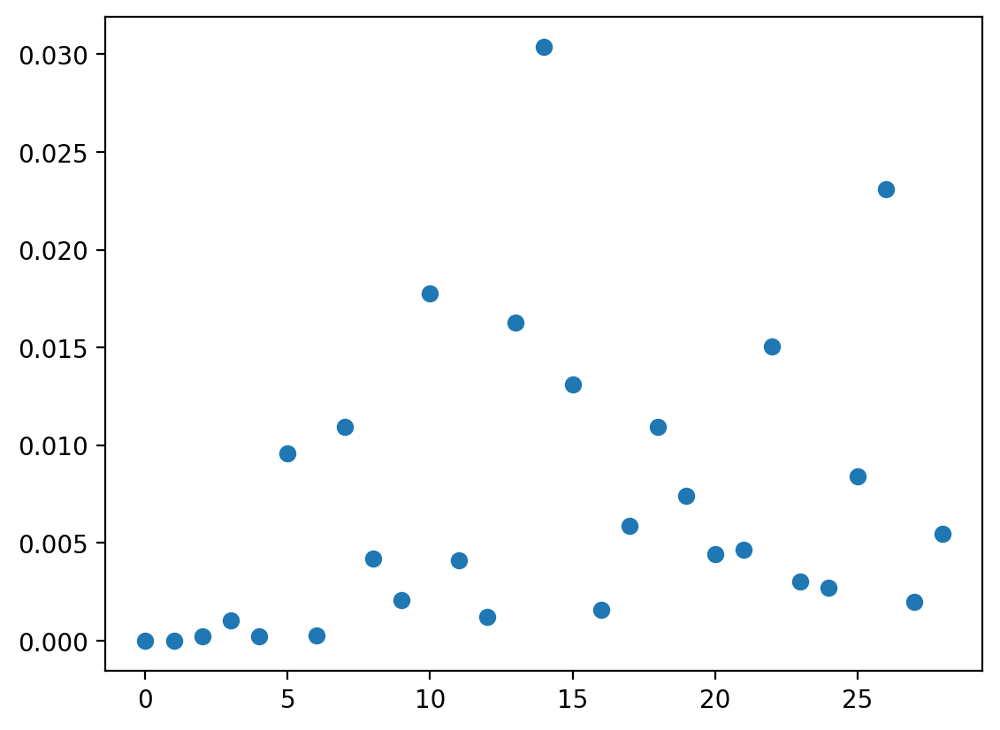

In [43]:
dm_res_diff = np.abs(np.diff(dm_res['EigenValues']))
plt.scatter([x for x in range(len(dm_res_diff))], dm_res_diff)

In [44]:
n_dcs = 6

ms_data = palantir.utils.determine_multiscale_space(dm_res, n_eigs=n_dcs)

In [45]:
adata.obsm['DC'] = ms_data.to_numpy()

In [46]:
for col in ms_data:
    
    adata.obs[f'dc{col+1}'] = ms_data[col]

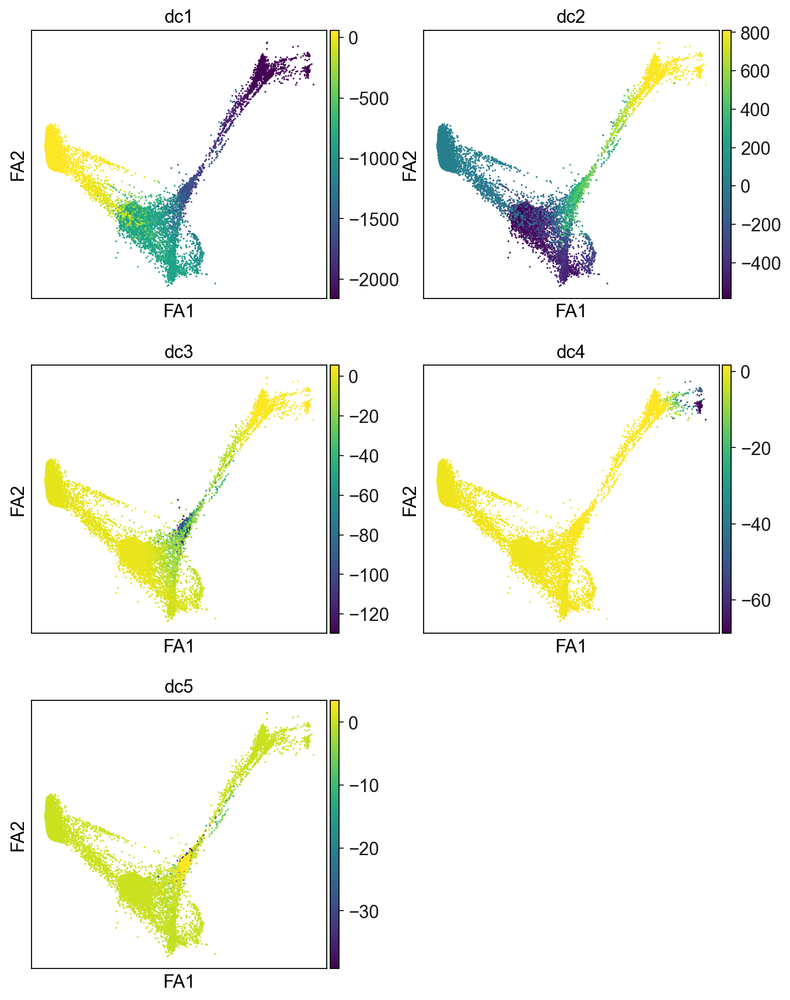

In [47]:
sc.settings.verbosity = 4
sc.set_figure_params(dpi=80, dpi_save=300)

sc.pl.draw_graph(adata, color=[f'dc{dc+1}' for dc in ms_data], ncols=2, save='_Diffusion_Components.png')

### Run CellRank

In [48]:
# Save adata with full geneset to use for visualization later:

print(adata.shape)

fn = '/workdir/LUAD_SCLC_HT/data/adata_CellRank_Input_FULL.h5ad'

adata.write(fn)

(15828, 24215)


In [49]:
# Subset to HVGs only for running CellRank:

fn = '/workdir/LUAD_SCLC_HT/data/adata_CellRank_Input_HVG.h5ad'

adata_HVG = adata[:, adata.var.highly_variable == True]
adata_HVG.write(fn)

In [51]:
output_dir

'/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/'

In [50]:
sc.settings.figdir = output_dir
scv.settings.figdir = output_dir
cr.settings.figdir = output_dir

In [52]:
print(f'adata: ', adata.shape)
print(f'adata HVG: ', adata_HVG.shape)

adata:  (15828, 24215)
adata HVG:  (15828, 4713)


#### Connectivity Kernel Backward

In [53]:
print(adata_HVG.shape)

(15828, 4713)


In [54]:
print(f'k={k}')

adata_HVG.obsp['connectivities'] = adata_HVG.obsp[f'neighbors_{k}_connectivities']

ck_bwd = cr.tl.kernels.ConnectivityKernel(adata_HVG, backward=True).compute_transition_matrix()

k=40


Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


In [55]:
g = cr.tl.estimators.GPCCA(ck_bwd)
print(g)

g.compute_schur(n_components=20, method='krylov')

Computing Schur decomposition


GPCCA[n=15828, kernel=~<ConnectivityKernel[dnorm=True, key=connectivities]>]
Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000004e+00 3.9444806122871367e-05 4.7227479418477004e-05 -1.0287862310861794e-04 -6.6424282122853561e-05 -3.8406477243575819e-04 4.3744636770495280e-05 -1.9307539022302475e-04 3.5006219434364187e-04 1.7206643458561754e-04 1.5098285915539667e-04 5.7495044280546717e-04 6.6647843966486948e-04 2.8732448236011820e-05 6.2504859476684250e-05 -3.3165128330701404e-05 1.7620338116775650e-04 -3.2421636880828106e-04 -1.9830954850525836e-04 4.5197825513749692e-04 
0.0000000000000000e+00 9.9660200441386282e-01 -3.2674982997327003e-05 2.5508242933250228e-06 -1.8040451012690285e-04 3.5601392390314862e-05 4.2883794936828626e-05 -7.1807988056285600e-06 4.5869507422030064e-05 -2.2745198467738091e-04 -3.3392566262337037e-05 -1.6497406242295574e-04 -3.6647023374599473e-05 1.5497822954359125e-04 -1.3940111317781775e-04 -8.5717058229149969e-05 -3.8986447131173429e-04 6.6936073

Adding `adata.uns['eigendecomposition_bwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:05)


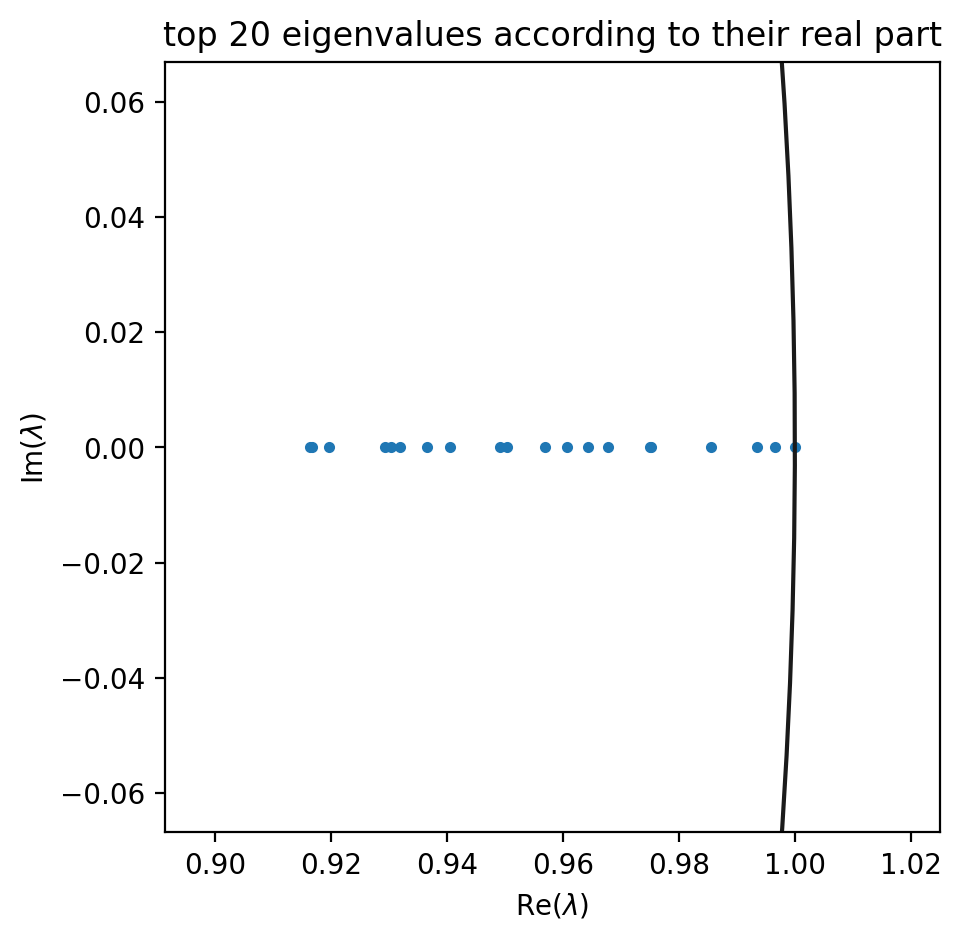

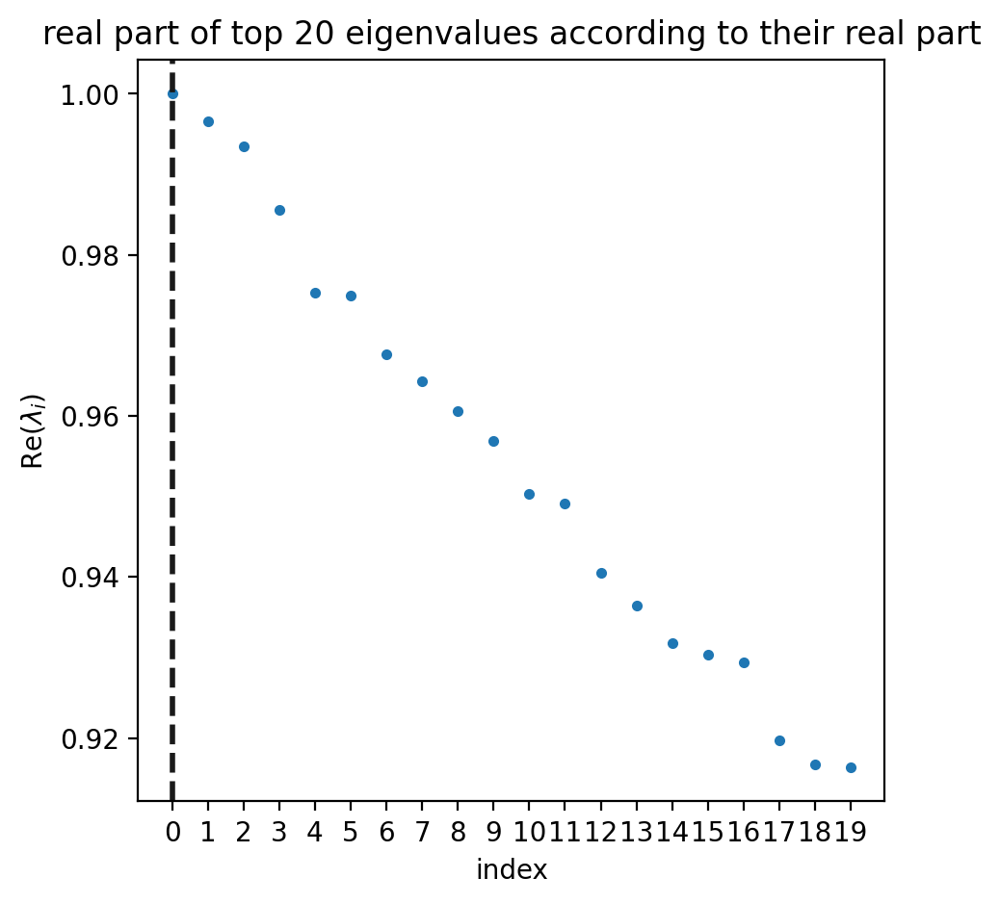

In [56]:
matplotlib.style.use('default')

g.plot_spectrum(save='Conn_kern_bwd_spectrum.png')
g.plot_spectrum(real_only=True, save='Conn_kern_bwd_spectrum_RE_only.png')

In [57]:
subclusters = 'sample'

g.compute_macrostates(n_states=3, cluster_key=subclusters)

Computing `3` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)


saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Conn_kern_bwd_macrostates_discrete.png


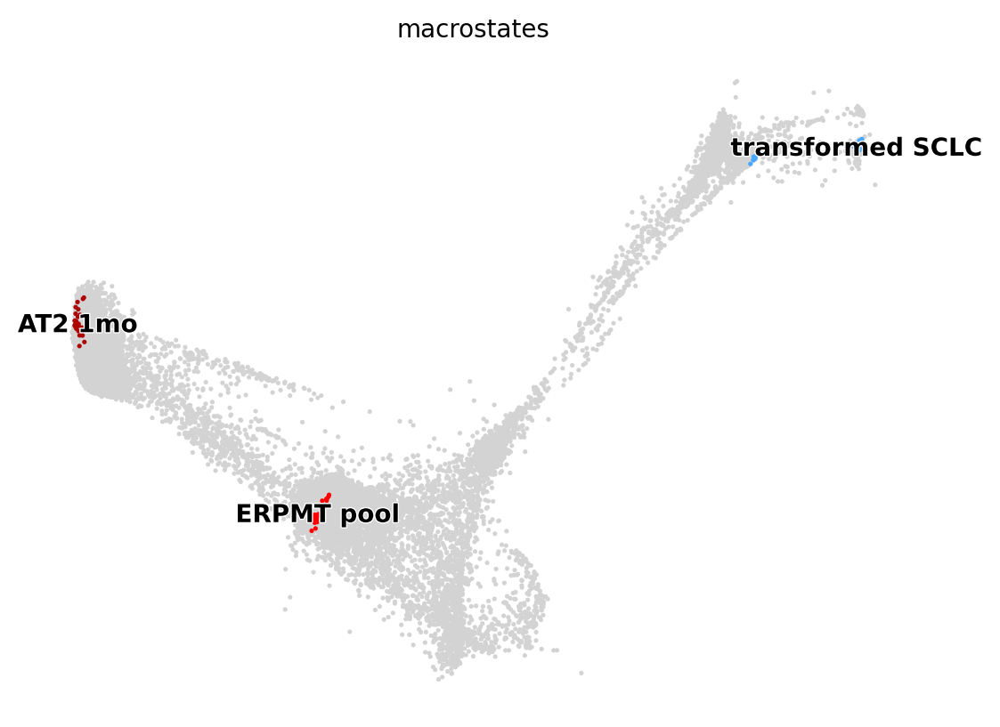

In [58]:
g.plot_macrostates(discrete=True, basis='draw_graph_fa', save='Conn_kern_bwd_macrostates_discrete.png')

In [59]:
g.set_terminal_states_from_macrostates(names=['AT2_1mo'])

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


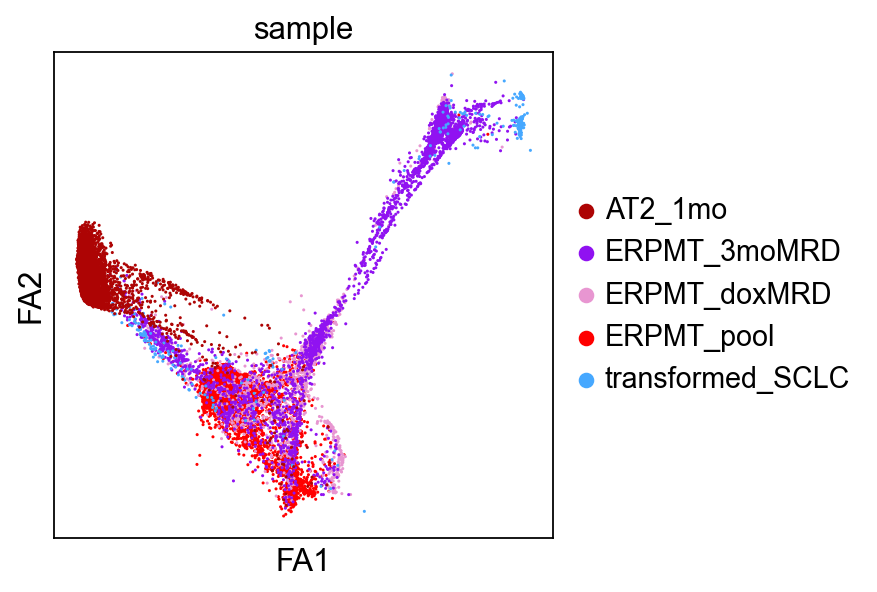

In [60]:
sc.settings.verbosity = 4
sc.set_figure_params(dpi=80, dpi_save=300)

sc.pl.draw_graph(adata_HVG, color='sample', save='_Traj_Subset_sample.png')

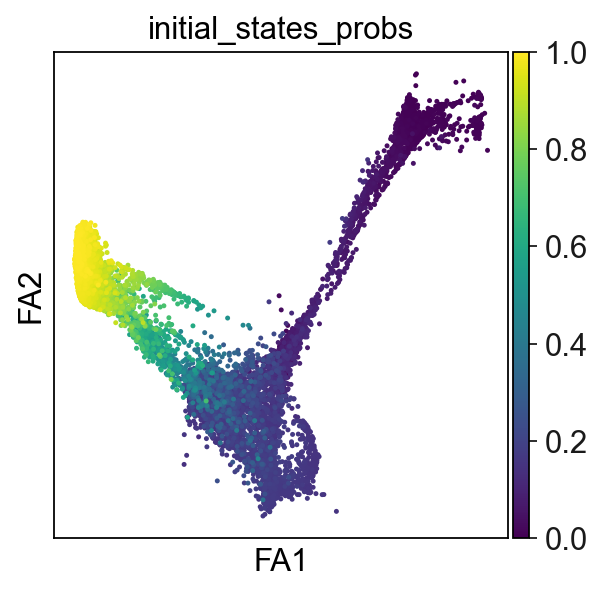

In [61]:
sc.settings.verbosity = 4
sc.set_figure_params(dpi=80, dpi_save=300)

sc.pl.embedding(adata_HVG, color='initial_states_probs', cmap='viridis', s=20, basis='draw_graph_fa', save='_Conn_bwd_initial_state_probs.png')

/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare//Conn_bwd_early_cells.png


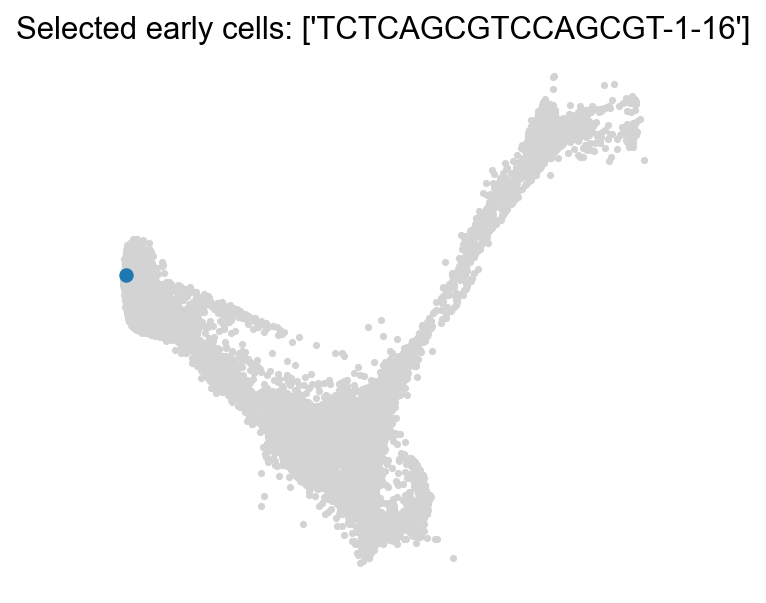

In [62]:
early_cells = adata_HVG[adata_HVG.obs['initial_states_probs'] == 1].obs.index.tolist()
#early_cells = QUERY_gb.obs.index[QUERY_gb.obs['initial_states'] == 'CD8+ Naive T cells']

fig, ax = plt.subplots()

palantir.plot.highlight_cells_on_tsne(
    # convert the draw-graph array in adata.obsm to a pandas dataframe with cells as indices and 'x','y' as columns:
    tsne = pd.DataFrame(adata_HVG.obsm['X_draw_graph_fa'], index=adata_HVG.obs.index, columns=['x','y']), 
    cells= early_cells,
    fig = fig
)
plt.title(f'Selected early cells: {early_cells}')

fn = output_dir + '/Conn_bwd_early_cells.png'
plt.tight_layout()

print(fn)
plt.savefig(fn, dpi=400)

In [63]:
early_cells

['TCTCAGCGTCCAGCGT-1-16']

#### Run Palantir Pseudotime

In [64]:
ms_data = pd.DataFrame(adata_HVG.obsm['DC'], index = adata_HVG.obs.index)

In [65]:
ms_data

,0,1,2,3,4
AAACCCAAGTGGATAT-1-7,-884.025443,-577.417320,0.583490,0.002229,-0.063752
AAACCCACATAATGAG-1-7,-887.993253,-520.537466,-2.515449,0.024560,-0.330651
AAACCCACATGTCTAG-1-7,-878.874503,-583.283421,1.242184,-0.001469,0.023180
AAACCCATCTATCCAT-1-7,-876.233508,-496.837555,-0.586926,0.029505,-0.019845
AAACGAAAGTACCATC-1-7,-879.938925,-576.143099,0.867498,0.001772,-0.012410
...,...,...,...,...,...
TTTGTTGCAGGACGAT-1-16,60.604272,13.562518,0.001879,-0.000007,0.000017
TTTGTTGCAGGTCAAG-1-16,60.759855,13.652397,0.002018,-0.000011,0.000049
TTTGTTGGTGGACTAG-1-16,60.728696,13.634459,0.001987,-0.000010,0.000043
TTTGTTGTCACCCTTG-1-16,60.768192,13.656666,0.002030,-0.000011,0.000051


In [66]:
adata_HVG.obsm['X_pca'].shape

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(15828, 28)

In [68]:
# There seems to be some degree of randomness in the below code, even given the same diffusion components above,
# more recent versions of palantir allow for setting the random seed, but this version did not. 
# The differentiation potential variable should be informative and there should be two sub trajectories below.
# If not, try rerunning. It may take a few runs.

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Some randomness has been observed in the below code, even given the same diffusion components above,
# To account for this, the seed has been set to x
# However, other random seeds have produced the same results as well.

Sampling and flocking waypoints...
Time for determining waypoints: 0.04782103697458903 minutes
Determining pseudotime...
Shortest path distances using 40-nearest neighbor graph...
Time for shortest paths: 0.5708468278249105 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out/Trajectory_Analyses_RERUN_v5/Palantir_Results_TCTCAGCGTCCAGCGT-1-16.png


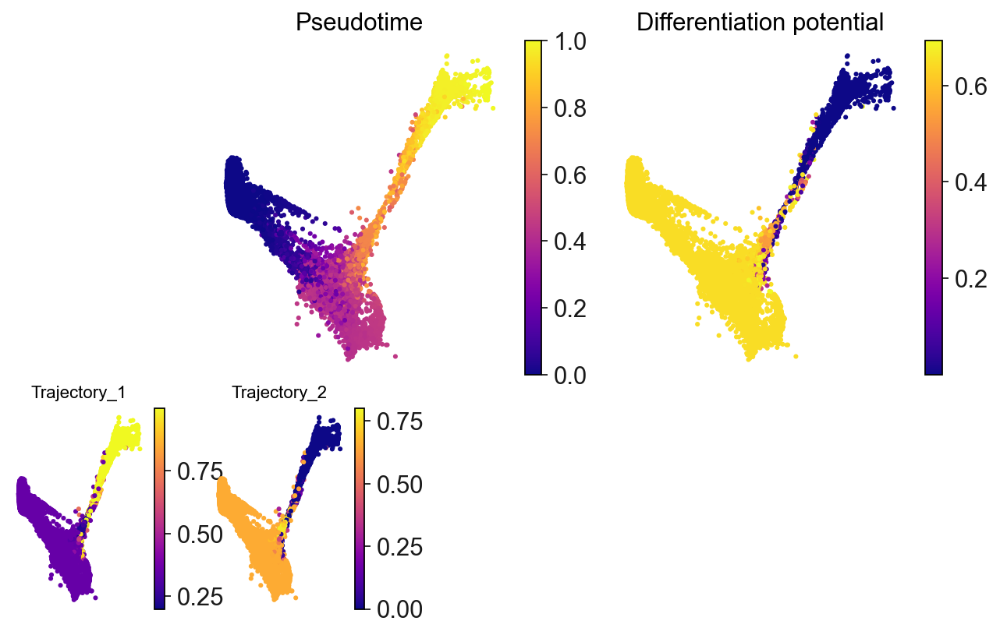

In [81]:
# Save this code block as example

pr_res_dict = {}

for early_cell in early_cells:

    pr_res_dict[early_cell] = palantir.core.run_palantir(ms_data, early_cell = early_cell, knn=k, scale_components=False, n_jobs=30)
    pr_res_dict[early_cell].branch_probs.columns = ['Trajectory_'+str(x+1) for x in range(len(pr_res_dict[early_cell].branch_probs.columns))]
    
    palantir.plot.plot_palantir_results(
                                        pr_res = pr_res_dict[early_cell],
                                        tsne = pd.DataFrame(adata_HVG.obsm['X_draw_graph_fa'], 
                                                            index=adata_HVG.obs.index, 
                                                            columns=['x','y'])
    )
    
    plt.savefig(output_dir+f'Palantir_Results_{early_cell}.png')
    print(output_dir+f'Palantir_Results_{early_cell}.png')

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Sampling and flocking waypoints...
Time for determining waypoints: 0.04647939999898275 minutes
Determining pseudotime...
Shortest path distances using 40-nearest neighbor graph...
Time for shortest paths: 0.31268126567204796 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
/workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/Palantir_Results_TCTCAGCGTCCAGCGT-1-16.png


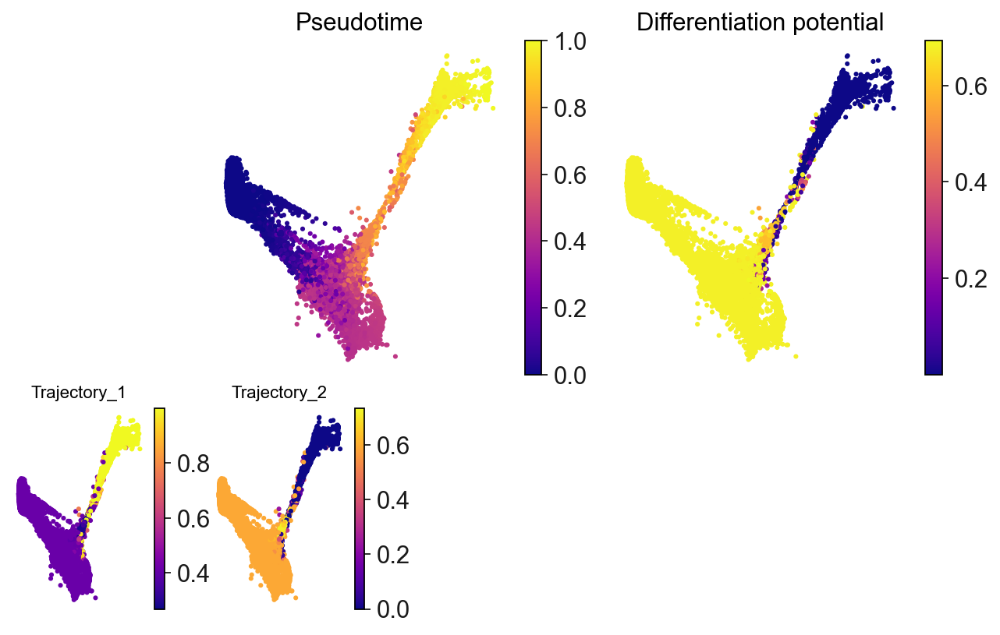

In [72]:
# Rerun this code block:

pr_res_dict = {}

for early_cell in early_cells:

    pr_res_dict[early_cell] = palantir.core.run_palantir(ms_data, early_cell = early_cell, knn=k, scale_components=False, n_jobs=30)
    pr_res_dict[early_cell].branch_probs.columns = ['Trajectory_'+str(x+1) for x in range(len(pr_res_dict[early_cell].branch_probs.columns))]
    
    palantir.plot.plot_palantir_results(
                                        pr_res = pr_res_dict[early_cell],
                                        tsne = pd.DataFrame(adata_HVG.obsm['X_draw_graph_fa'], 
                                                            index=adata_HVG.obs.index, 
                                                            columns=['x','y'])
    )
    
    plt.savefig(output_dir+f'Palantir_Results_{early_cell}.png')
    print(output_dir+f'Palantir_Results_{early_cell}.png')

In [73]:
for i in range(len(pr_res_dict.keys())):

    key = list(pr_res_dict.keys())[i]
    
    adata_HVG.obs[f'palantir_pseudotime_{i+1}'] = pr_res_dict[key].pseudotime
    adata_HVG.obs[f'palantir_diff_score_{i+1}'] = 1 - pr_res_dict[key].entropy

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [74]:
for col in pr_res_dict[early_cells[0]].branch_probs:
    
    adata_HVG.obs[f'palantir_pseudotime_{col}'] = pr_res_dict[early_cells[0]].branch_probs[col].values

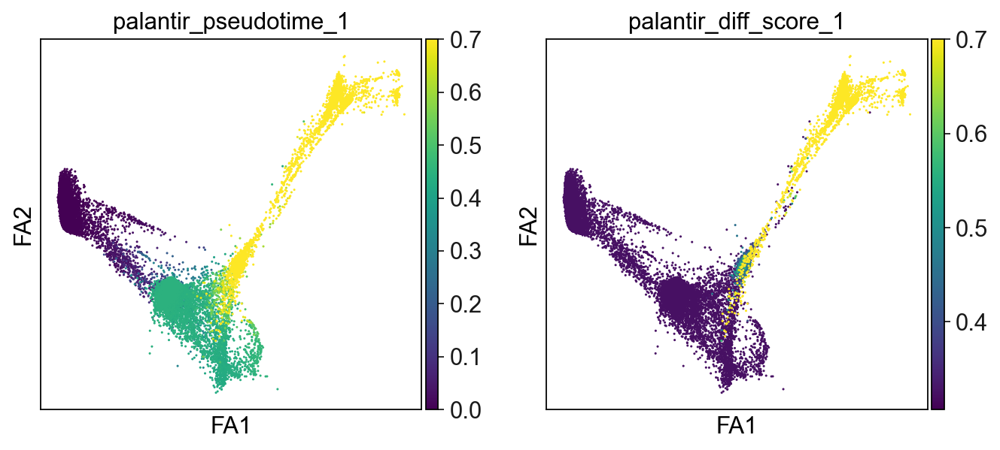

In [75]:
matplotlib.style.use('default')

sc.settings.verbosity = 4
sc.set_figure_params(dpi=80, dpi_save=300)

for i in range(len(pr_res_dict.keys())):

    sc.pl.draw_graph(adata_HVG,
                     color=[f'palantir_pseudotime_{i+1}', f'palantir_diff_score_{i+1}'],
                     cmap='viridis',
                     vmax=0.7,
                     save=f'Palantir_results_{list(pr_res_dict.keys())[i]}_FDL_projection.png')

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


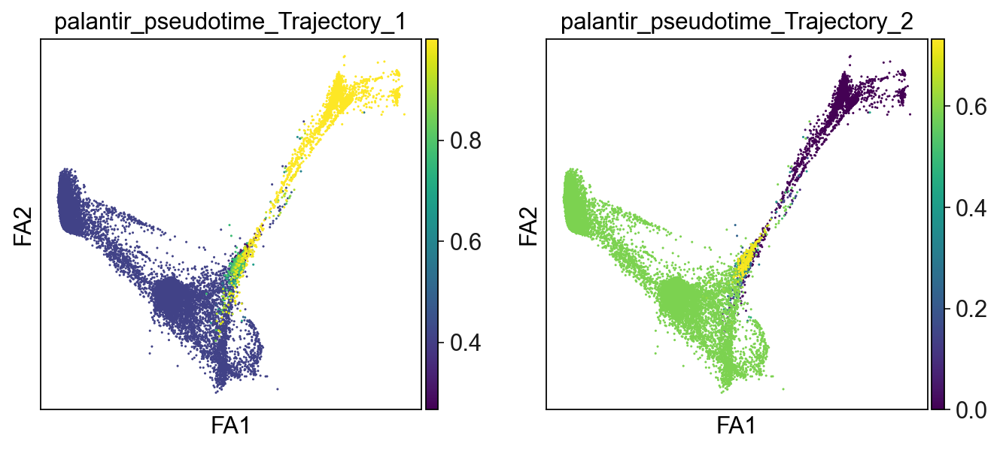

In [76]:
sc.pl.draw_graph(adata_HVG,
                 color=[f'palantir_pseudotime_{col}' for col in pr_res_dict[early_cells[0]].branch_probs],
                 cmap='viridis',
                 ncols=2,
                 save=f'Palantir_results_Trajectories_FDL_projection.png')

#### Pseudotime Kernel

In [77]:
ptk_1 = cr.tl.kernels.PseudotimeKernel(adata_HVG, mode='stochastic', time_key='palantir_pseudotime_1')
print(ptk_1)

ptk_2 = cr.tl.kernels.PseudotimeKernel(adata_HVG, mode='stochastic', time_key='palantir_diff_score_1')
print(ptk_2)

<PseudotimeKernel>
<PseudotimeKernel>


In [78]:
ptk_1.compute_transition_matrix(threshold_scheme='hard')
print(ptk_1)

ptk_2.compute_transition_matrix(threshold_scheme='hard')
print(ptk_2)

Computing transition matrix based on `palantir_pseudotime_1`


  0%|          | 0/15828 [00:00<?, ?cell/s]

    Finish (0:00:07)
Computing transition matrix based on `palantir_diff_score_1`


<PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>


  0%|          | 0/15828 [00:00<?, ?cell/s]

    Finish (0:00:08)


<PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>


#### Connectivity Kernel Forward

In [79]:
ck = cr.tl.kernels.ConnectivityKernel(adata_HVG).compute_transition_matrix()

Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)


In [80]:
g_ck_fwd = cr.tl.estimators.GPCCA(ck)
print(g_ck_fwd)

g_ck_fwd.compute_schur(n_components=20, method='krylov')

Computing Schur decomposition


GPCCA[n=15828, kernel=<ConnectivityKernel[dnorm=True, key=connectivities]>]
Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000004e+00 3.9444806122871367e-05 4.7227479418477004e-05 -1.0287862310861794e-04 -6.6424282122853561e-05 -3.8406477243575819e-04 4.3744636770495280e-05 -1.9307539022302475e-04 3.5006219434364187e-04 1.7206643458561754e-04 1.5098285915539667e-04 5.7495044280546717e-04 6.6647843966486948e-04 2.8732448236011820e-05 6.2504859476684250e-05 -3.3165128330701404e-05 1.7620338116775650e-04 -3.2421636880828106e-04 -1.9830954850525836e-04 4.5197825513749692e-04 
0.0000000000000000e+00 9.9660200441386282e-01 -3.2674982997327003e-05 2.5508242933250228e-06 -1.8040451012690285e-04 3.5601392390314862e-05 4.2883794936828626e-05 -7.1807988056285600e-06 4.5869507422030064e-05 -2.2745198467738091e-04 -3.3392566262337037e-05 -1.6497406242295574e-04 -3.6647023374599473e-05 1.5497822954359125e-04 -1.3940111317781775e-04 -8.5717058229149969e-05 -3.8986447131173429e-04 6.69360734

Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:02)


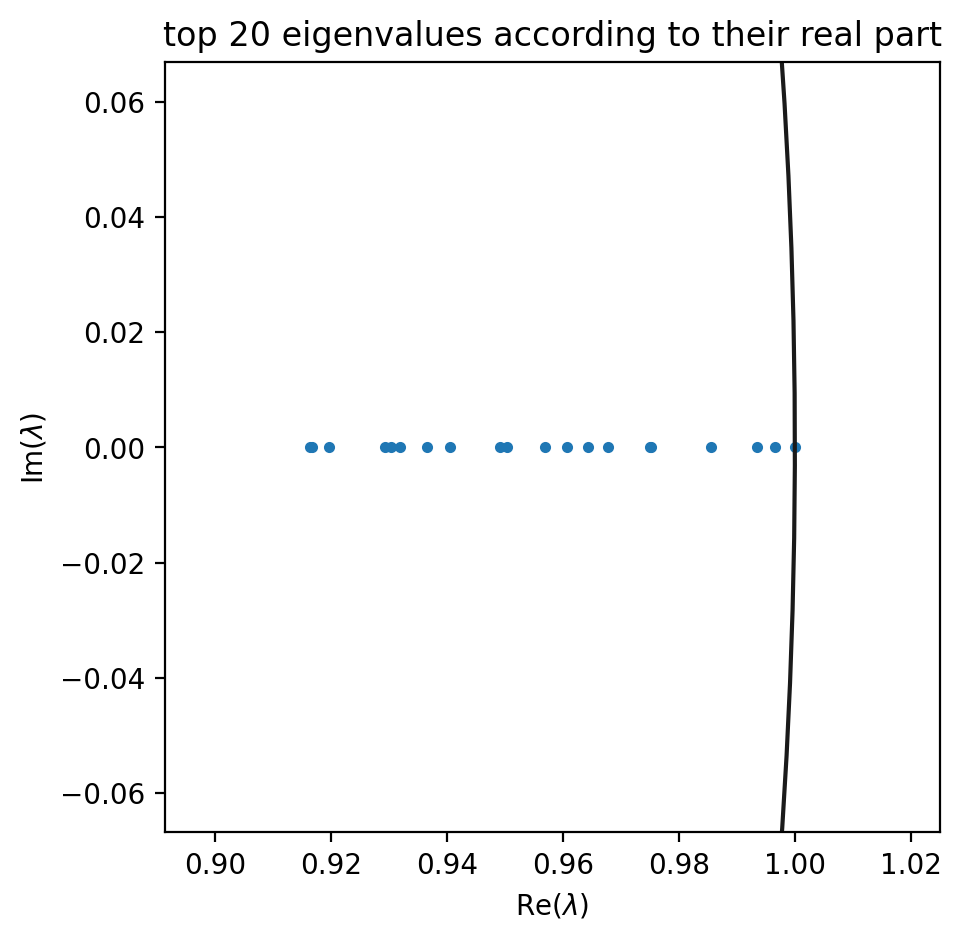

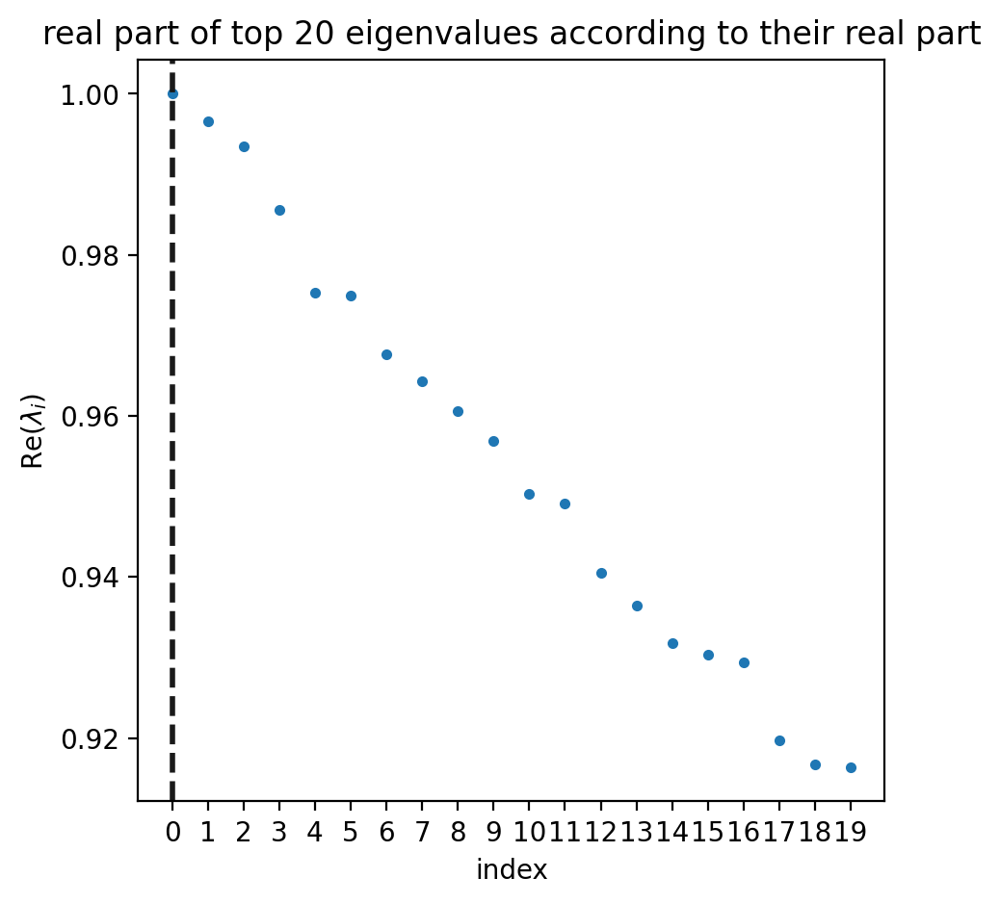

In [81]:
matplotlib.style.use('default')

g_ck_fwd.plot_spectrum(save='Conn_kern_spectrum.png')
g_ck_fwd.plot_spectrum(real_only=True, save='Conn_kern_spectrum_RE_only.png')

#### Combine Kernels

In [82]:
# Different linear combinations should be tested here:
# Note, the combined kernel doesn't distribute the 0.4 weight:

combined_kernel = 0.4 * (ptk_1 + ptk_2) + 0.2 * ck

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [84]:
combined_kernel.compute_transition_matrix()

((0.67 * ((0.5 * <PseudotimeKernel>) + (0.5 * <PseudotimeKernel>))) + (0.33 * <ConnectivityKernel>))

In [85]:
g = cr.tl.estimators.GPCCA(combined_kernel)
print(g)

GPCCA[n=15828, kernel=((0.67 * ((0.5 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>) + (0.5 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>))) + (0.33 * <ConnectivityKernel[dnorm=True, key=connectivities]>))]


##### Compute Macrostates

In [86]:
g.compute_schur(n_components=20, method='krylov')

Computing Schur decomposition


Mat Object: 1 MPI processes
  type: seqdense
9.9999999999999878e-01 2.7591150432179669e-03 3.1137137602170145e-03 1.2797910972942171e-03 -2.9382405077191297e-03 -5.2071494680230878e-04 -3.6358608524944243e-04 -1.1047730002037212e-03 -3.4185423266389404e-03 -4.5913051972277623e-03 -3.6948507264256848e-03 -2.0818377881375296e-03 3.4854503842573110e-03 -2.2842403735196869e-03 1.4730607379329069e-04 -1.2003972590445885e-03 1.4813941028585329e-03 -2.4386723072929929e-03 2.6112196716066645e-03 8.7237557950013023e-03 
0.0000000000000000e+00 9.9808622729117502e-01 -2.7616665051701304e-03 3.3922280880189486e-03 -7.5219320986200941e-03 -1.5536948045988082e-04 4.2076496969606601e-03 -2.5666831396000964e-03 2.0312268953823261e-03 -1.6005003014540470e-03 -1.7119307148322298e-03 2.8792133890676564e-03 -6.6491118595924162e-05 2.0922603154869724e-03 5.4852072292935422e-03 -6.1030749795586738e-03 1.6968323967302362e-03 -7.1915033793681039e-03 -4.2320254107117532e-03 -7.0461784211402223e-04 
0.000000000

Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:01)


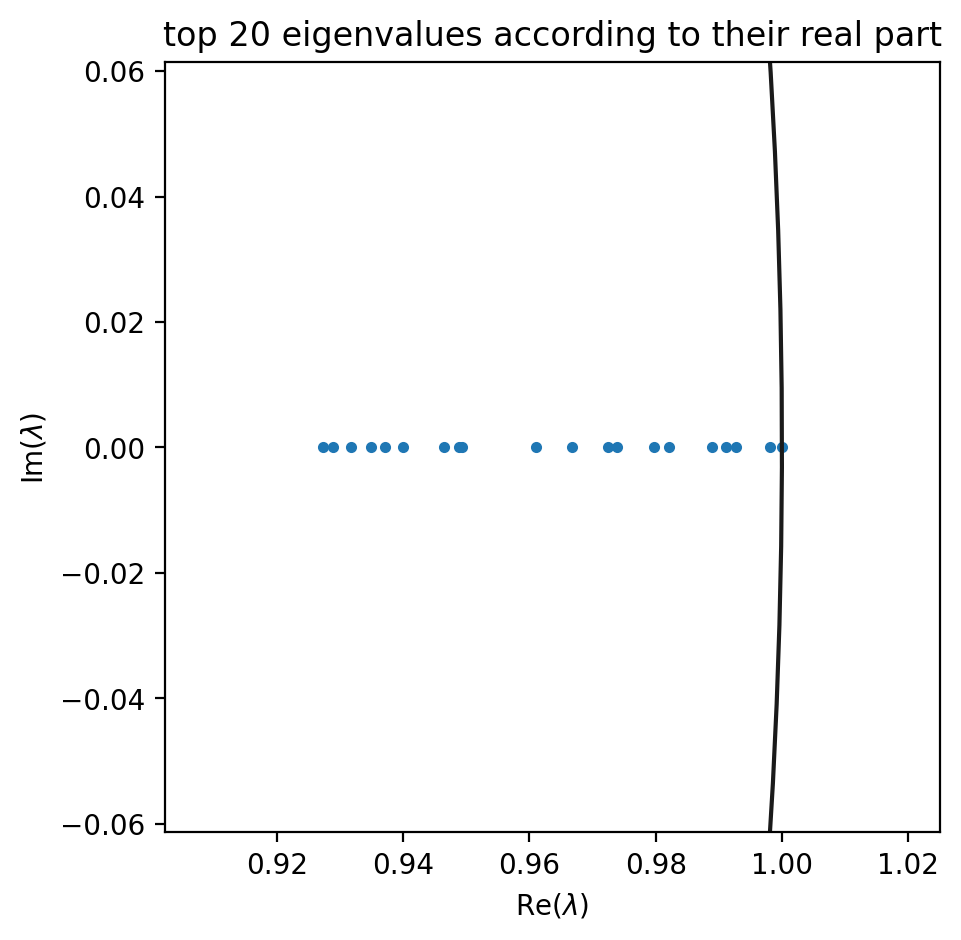

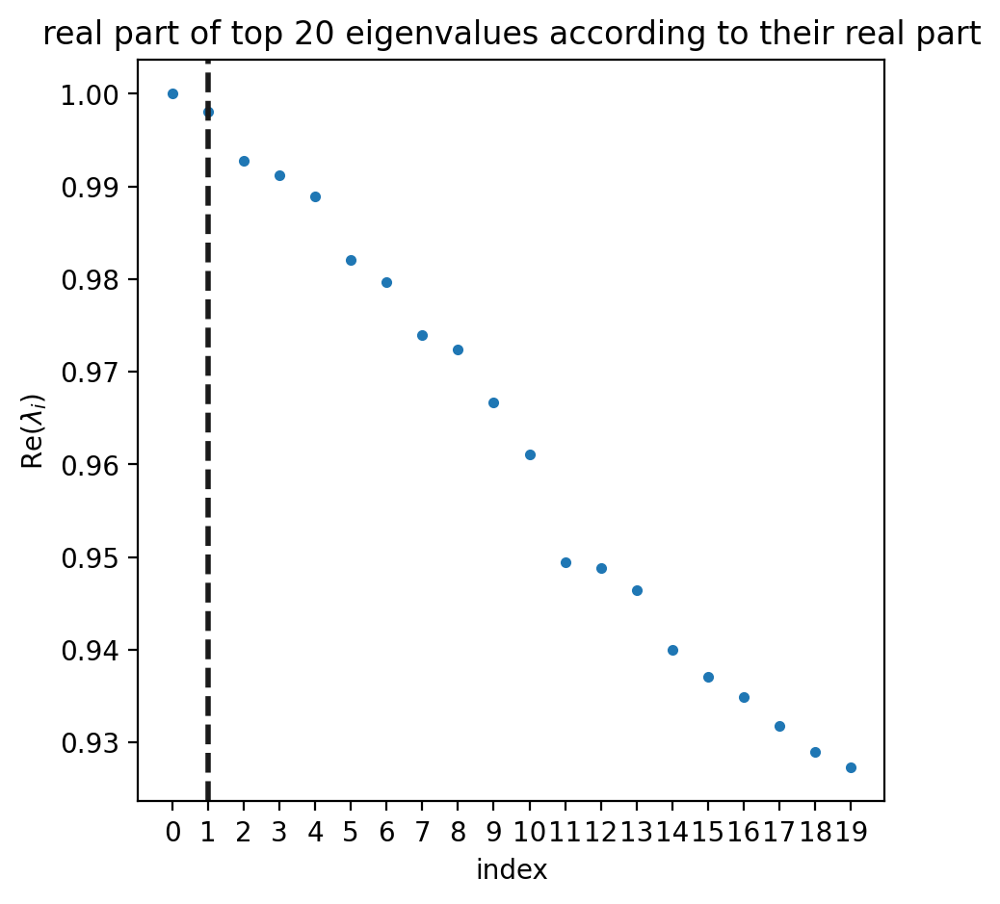

In [87]:
matplotlib.style.use('default')

g.plot_spectrum(save='Comb_kern_spectrum.png')
g.plot_spectrum(real_only=True, save='Comb_kern_spectrum_RE_only.png')

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
Computing `4` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:01)


saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Comb_kern_macrostates_discrete.png


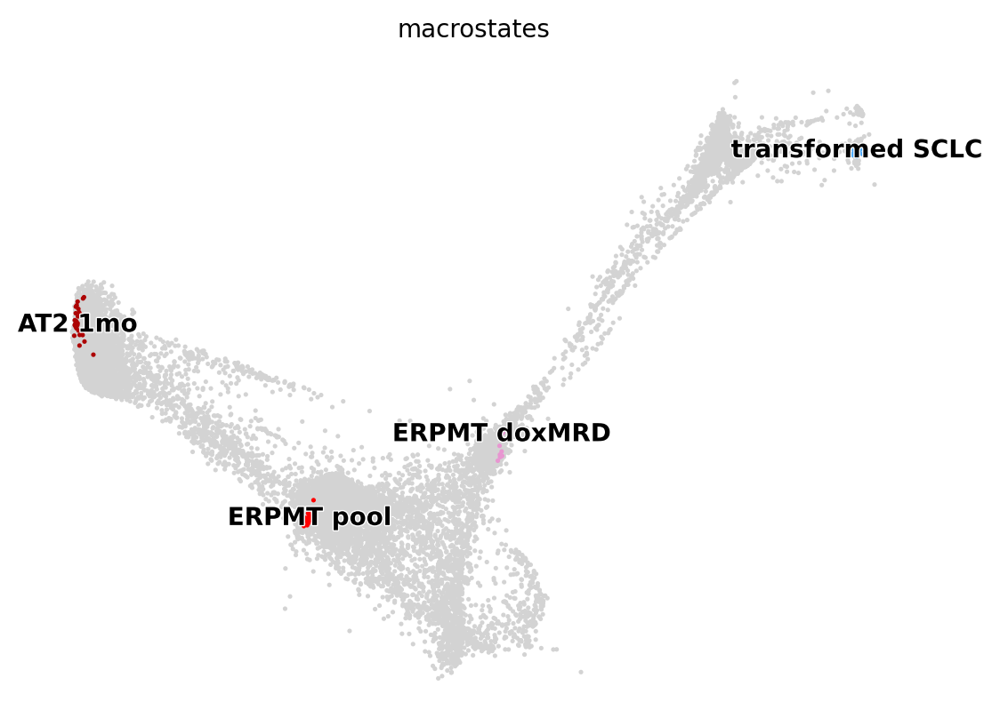

In [88]:
g.compute_macrostates(n_states=4, cluster_key=subclusters)
g.plot_macrostates(discrete=True, basis='draw_graph_fa', save='Comb_kern_macrostates_discrete.png')

saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Comb_kern_macrostates_continuous.png


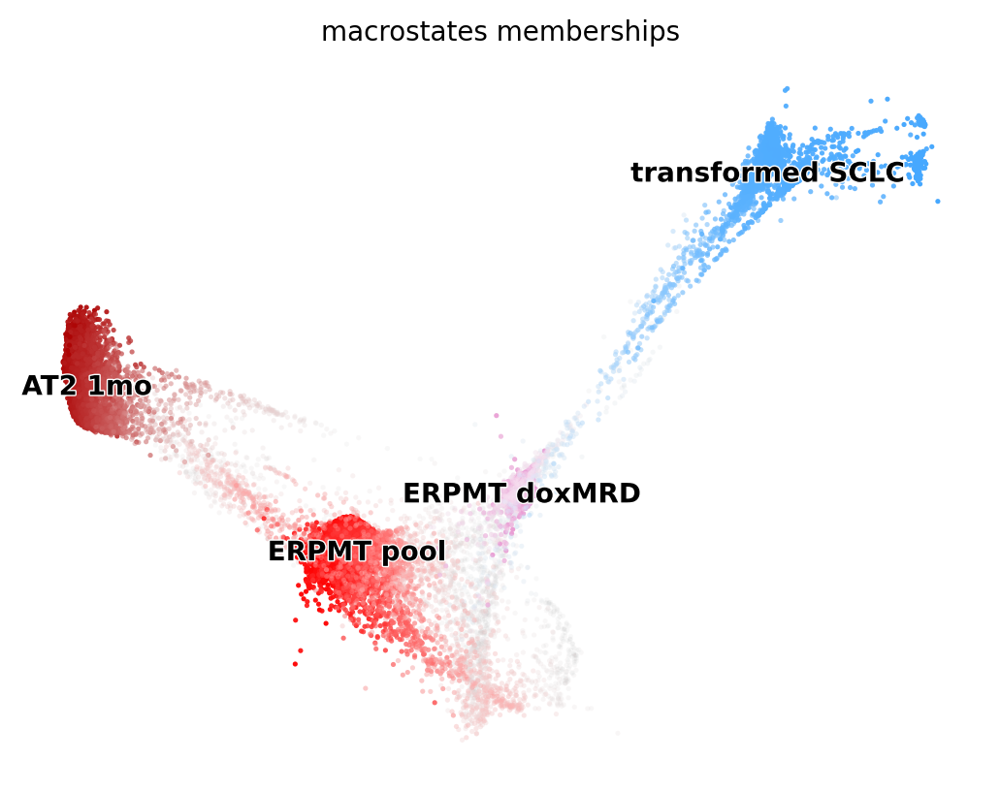

saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Comb_kern_macrostates_separate.png


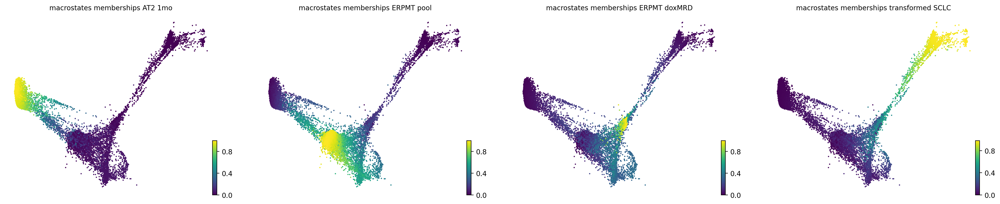

In [92]:
g.plot_macrostates(states=['AT2_1mo', 'ERPMT_pool', 'ERPMT_doxMRD', 'transformed_SCLC'], 
                          save='Comb_kern_macrostates_continuous.png', basis='draw_graph_fa')

g.plot_macrostates(states=['AT2_1mo', 'ERPMT_pool', 'ERPMT_doxMRD', 'transformed_SCLC'], 
                          same_plot=False, save='Comb_kern_macrostates_separate.png', basis='draw_graph_fa')

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


ERPMT_pool
saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Comb_kern_macrostates_ERPMT_pool.png


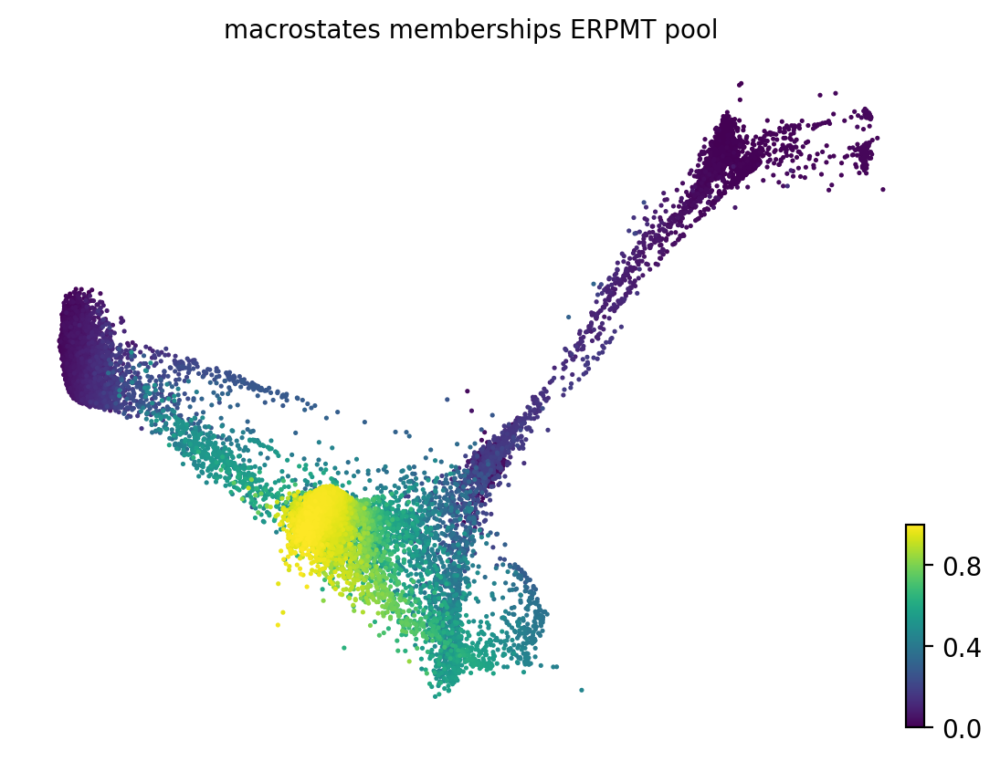

ERPMT_doxMRD
saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Comb_kern_macrostates_ERPMT_doxMRD.png


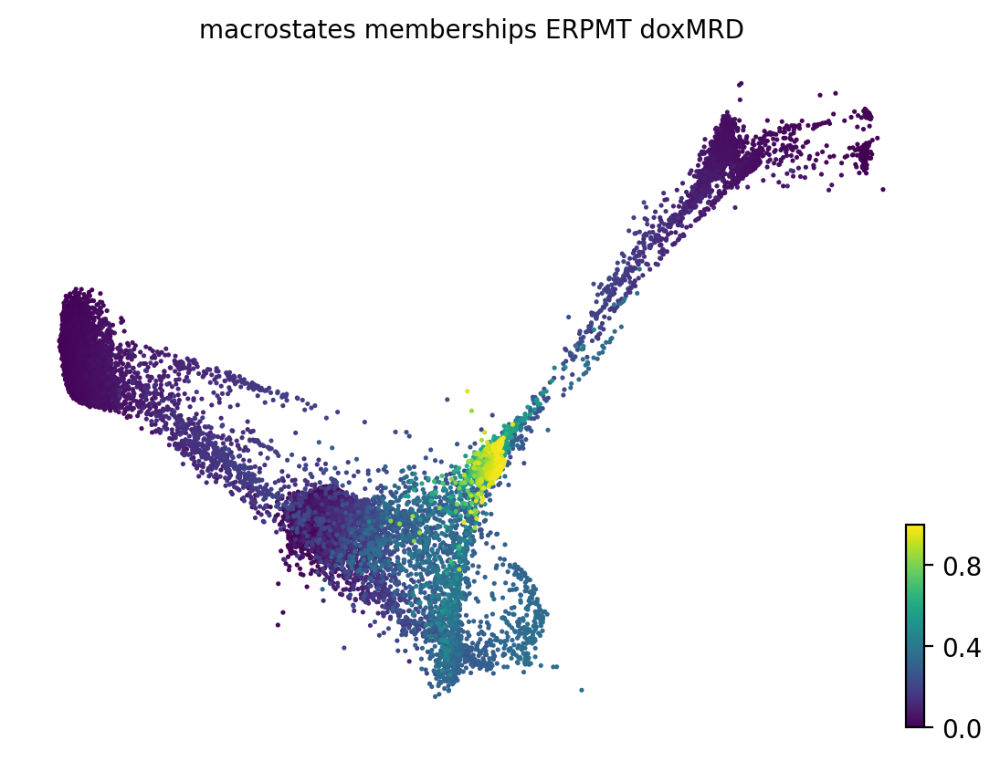

transformed_SCLC
saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Comb_kern_macrostates_transformed_SCLC.png


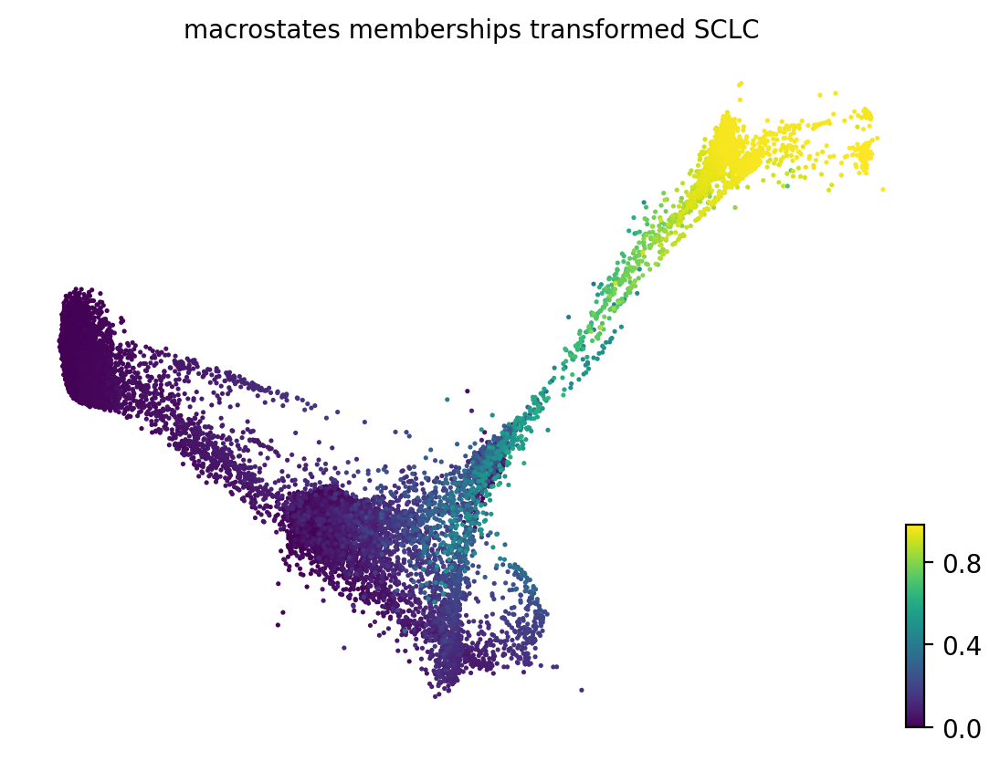

AT2_1mo
saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Comb_kern_macrostates_AT2_1mo.png


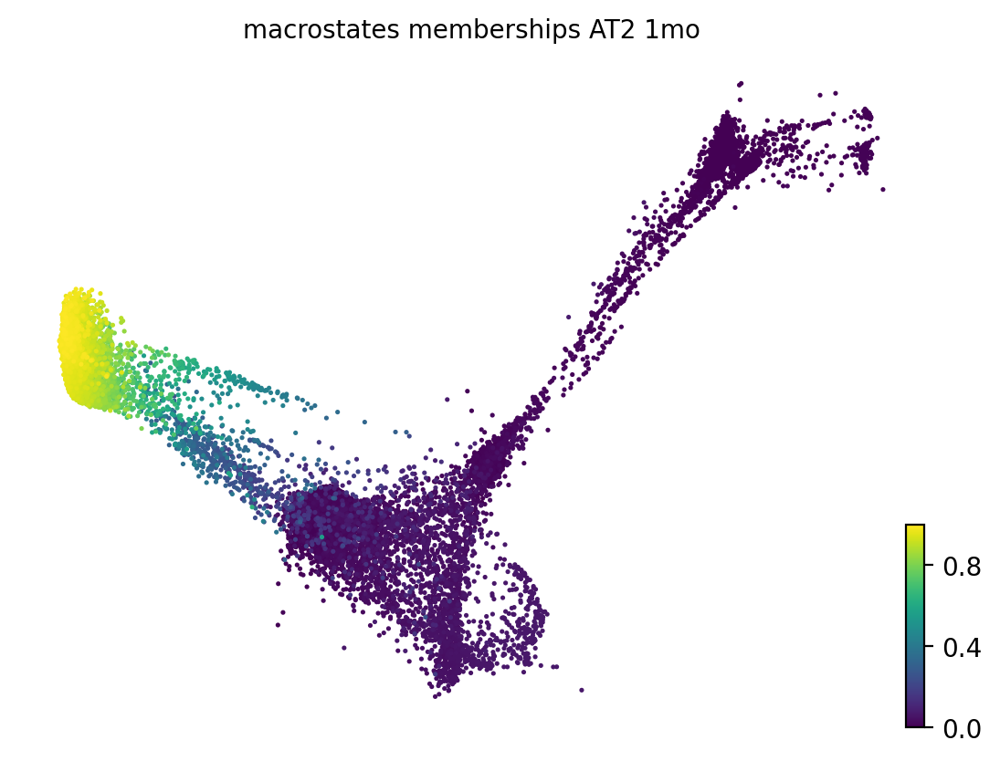

In [93]:
cr.settings.figdir = output_dir

for state in g.macrostates.unique().dropna().tolist():
    
    cr.settings.figdir = output_dir
    scv.settings.figdir = output_dir

    print(state)
    
    state_save = state.replace(' ', '_')
    
    g.plot_macrostates(states=[state], 
                       same_plot=False, save=f'Comb_kern_macrostates_{state_save}.png', basis='draw_graph_fa')

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


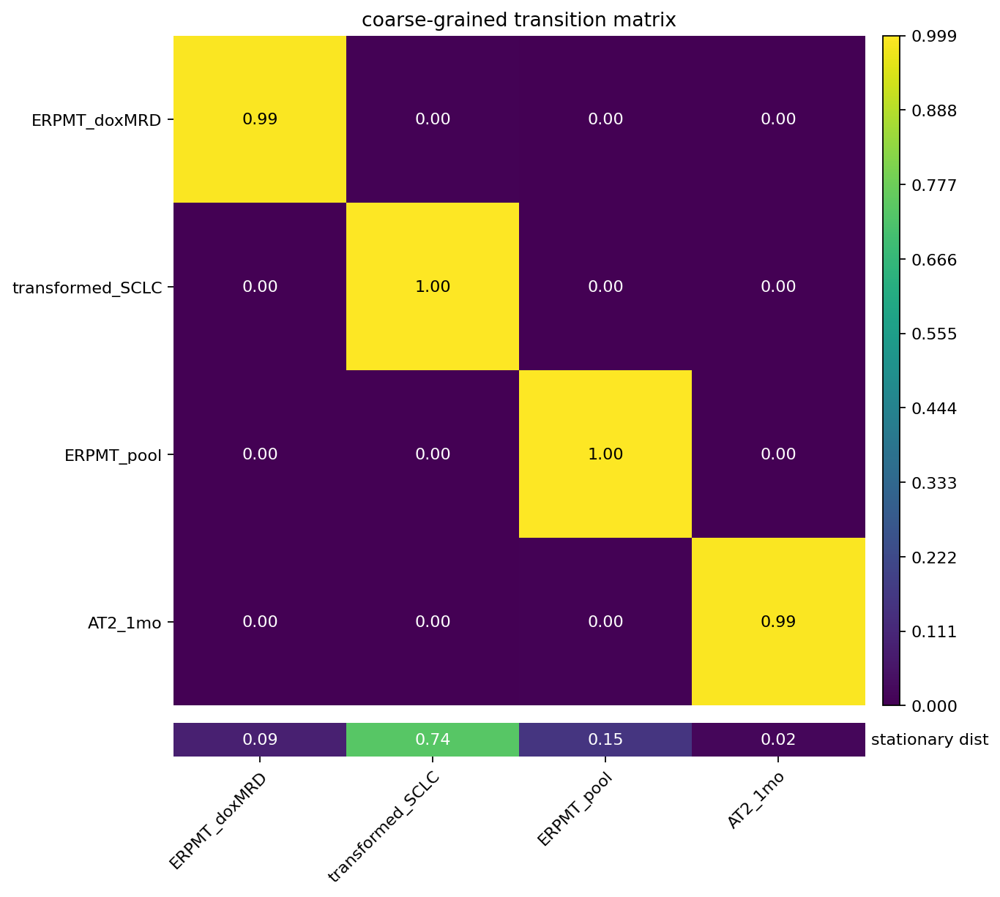

In [94]:
g.plot_coarse_T(save='Comb_kern_Coarse_T_Matrix.png')

In [95]:
#g.set_terminal_states_from_macrostates(names=['transformed_SCLC'])

g.compute_terminal_states(method='top_n', n_states=1)

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


In [96]:
adata_HVG.obs['terminal_states'].value_counts()

transformed_SCLC    30
Name: terminal_states, dtype: int64

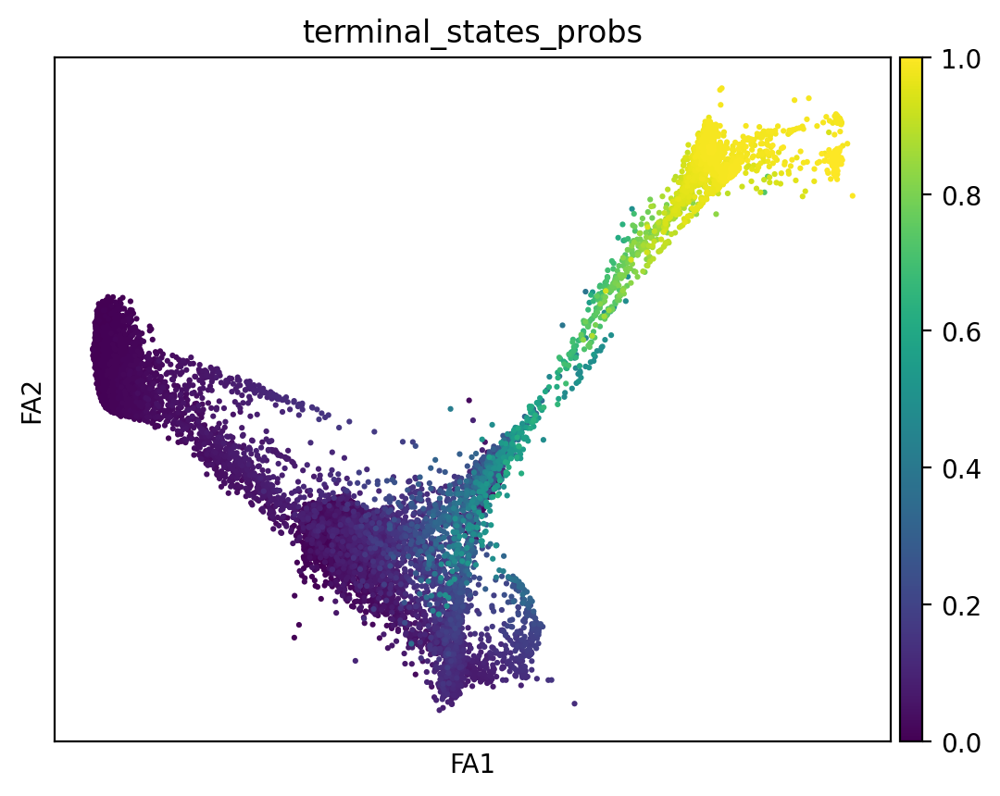

In [97]:
sc.pl.embedding(adata_HVG, color='terminal_states_probs', cmap='viridis', s=20, basis='draw_graph_fa', save='_Comb_terminal_state_probs.png')

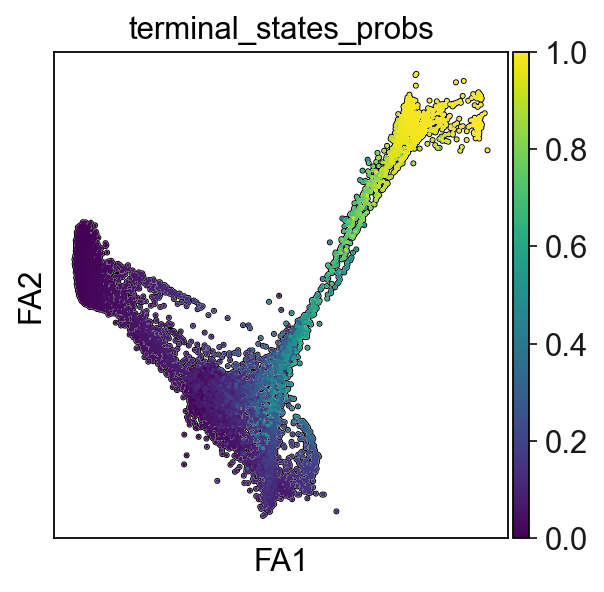

In [98]:
sc.settings.verbosity = 4
sc.set_figure_params(dpi=80, dpi_save=300) 


sc.pl.draw_graph(adata_HVG, 
                 color='terminal_states_probs', 
                 s=10,
                 alpha=1,
                 cmap='viridis',
                 add_outline=True,
                 save='_terminal_states_probs_FDL.png')

In [99]:
g.compute_absorption_probabilities()

Computing absorption probabilities


  0%|          | 0/1 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:01)


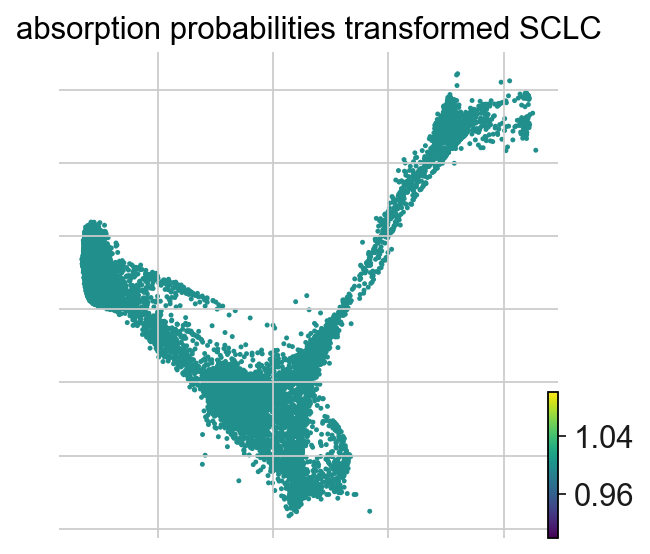

In [100]:
g.plot_absorption_probabilities(same_plot=False, size=20, basis="draw_graph_fa")

##### Embed Transition Matrix

In [101]:
combined_kernel.compute_projection(basis="draw_graph_fa")

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
Projecting transition matrix onto `draw_graph_fa`
Adding `adata.obsm['T_fwd_draw_graph_fa']`
    Finish (0:00:04)


saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Palantir_results_FDL_projection_transition_vector_stream_embedding.png


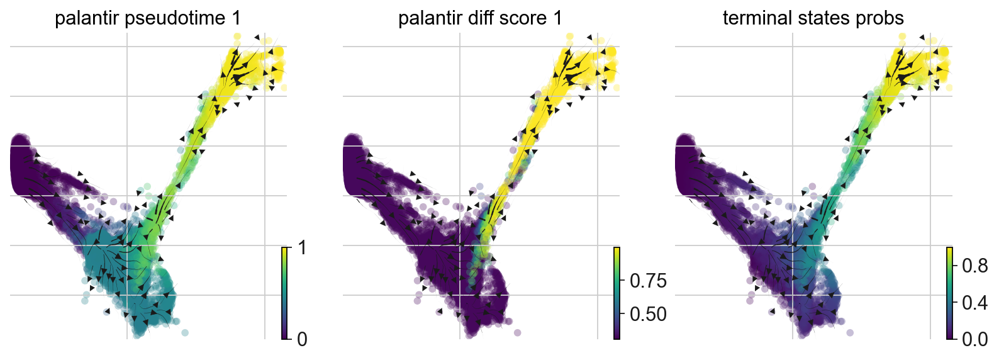

In [103]:
scv.pl.velocity_embedding_stream(adata_HVG, 
                                 color=['palantir_pseudotime_1', 'palantir_diff_score_1', 'terminal_states_probs'], 
                                 cmap='viridis', 
                                 vkey="T_fwd", 
                                 basis="draw_graph_fa", 
                                 #legend_loc="right",
                                 save='Palantir_results_FDL_projection_transition_vector_stream_embedding.png')

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_terminal_states_probs_FDL_projection_transition_vector_stream_embedding.png


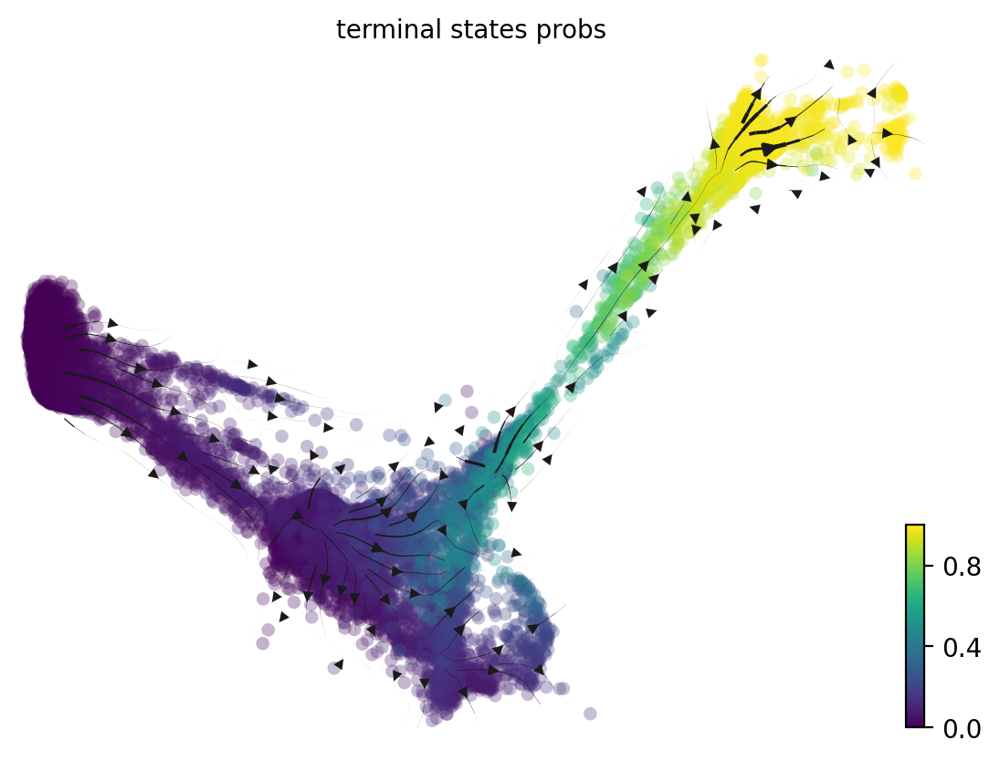

In [104]:
matplotlib.style.use('default')

scv.pl.velocity_embedding_stream(adata_HVG, 
                                 color=['terminal_states_probs'], 
                                 cmap='viridis', 
                                 vkey="T_fwd", 
                                 basis="draw_graph_fa", 
                                 #legend_loc="right",
                                 save='terminal_states_probs_FDL_projection_transition_vector_stream_embedding.png')

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Sample_FDL_projection_transition_vector_stream_embedding.png


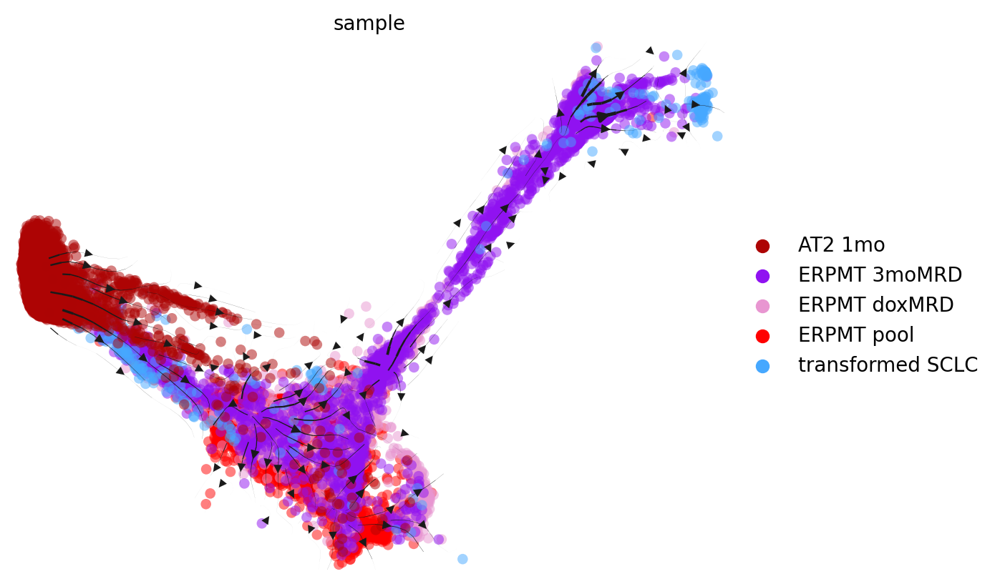

In [105]:
scv.pl.velocity_embedding_stream(adata_HVG, 
                                 color=['sample'], 
                                 alpha=0.5,
                                 vkey="T_fwd", 
                                 basis="draw_graph_fa", 
                                 legend_loc="right",
                                 save='Sample_FDL_projection_transition_vector_stream_embedding.png')

##### Compute Initial States

In [106]:
ptk_1_bwd = cr.tl.kernels.PseudotimeKernel(adata_HVG, backward=True, method='stochastic', 
                                           time_key='palantir_pseudotime_1').compute_transition_matrix(threshold_scheme='hard')
print(ptk_1_bwd)

ptk_2_bwd = cr.tl.kernels.PseudotimeKernel(adata_HVG, backward=True, method='stochastic', 
                                           time_key='palantir_diff_score_1').compute_transition_matrix(threshold_scheme='hard')
print(ptk_2_bwd)

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
Computing transition matrix based on `palantir_pseudotime_1`


  0%|          | 0/15828 [00:00<?, ?cell/s]

    Finish (0:00:07)
Computing transition matrix based on `palantir_diff_score_1`


~<PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>


  0%|          | 0/15828 [00:00<?, ?cell/s]

    Finish (0:00:09)


~<PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>


##### Combine Backward Kernels

In [107]:
# Different linear combinations should be tested here:

combined_kernel_bwd = 0.4 * (ptk_1_bwd + ptk_2_bwd) + 0.2 * ck_bwd

In [108]:
g_bwd = cr.tl.estimators.GPCCA(combined_kernel_bwd)
print(g_bwd)

GPCCA[n=15828, kernel=~((0.67 * ((0.5 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>) + (0.5 * <PseudotimeKernel[dnorm=False, scheme=hard, frac_to_keep=0.3]>))) + (0.33 * <ConnectivityKernel[dnorm=True, key=connectivities]>))]


Computing Schur decomposition


Mat Object: 1 MPI processes
  type: seqdense
9.9999999999999900e-01 5.1537427246558659e-03 1.5490950009285512e-03 -6.7279188217376183e-04 3.7142589126022531e-03 -2.7088654148049243e-03 -2.4855991422681424e-03 -3.1967649692942871e-03 1.2239190189457937e-03 -1.6659227623612258e-03 -8.2193446149458789e-03 -4.3612398577219276e-03 3.4802675664574491e-03 -2.1759023775925831e-04 -5.0670660976648912e-03 3.1366373132462066e-03 8.5337140397123419e-04 -1.8092167878902958e-03 3.7266287033815536e-03 -3.6092949675482441e-03 -4.3902694093018568e-03 
0.0000000000000000e+00 9.9486945102539370e-01 5.2696129505574521e-03 9.9756576221213624e-04 -3.9341718177948294e-03 6.3769382168560804e-03 9.0463205379415085e-05 6.1193742698780725e-03 -7.8742156638022544e-04 7.2152652301080188e-03 6.4820531111475952e-03 -5.2939018236216129e-03 -4.0608552943468553e-04 -2.5115197597543352e-03 -2.4739896828050783e-03 -4.3892712258365206e-03 -4.1387087638958931e-04 3.9772302198024159e-03 -1.1974149692553551e-02 1.61946598574

Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000051e+00 -5.1537427246571062e-03 1.5490950009257644e-03 6.7279188217362230e-04 -2.7088654147904311e-03 -3.7142589126117308e-03 2.4855991422690843e-03 -3.1967649692955197e-03 -1.2239190189586673e-03 -1.6659227623597804e-03 4.3612398577941424e-03 -8.2193446149018377e-03 3.4802675664623211e-03 -2.1759023776451864e-04 -5.0670660976608875e-03 -3.1366373132520990e-03 -8.5337140397240144e-04 -1.8092167878813435e-03 3.7266287033964019e-03 4.3902694092938215e-03 3.6092949675572933e-03 
0.0000000000000000e+00 9.9486945102539237e-01 -5.2696129505564321e-03 9.9756576220843348e-04 -6.3769382168368839e-03 -3.9341718178215303e-03 9.0463205378786329e-05 -6.1193742698727894e-03 -7.8742156644121724e-04 -7.2152652301188114e-03 -5.2939018235629498e-03 -6.4820531111855874e-03 4.0608552944341509e-04 2.5115197597530160e-03 2.4739896827993451e-03 -4.3892712258321032e-03 -4.1387087639337675e-04 -3.9772302197820337e-03 1.1974149692560521e-02 2.960435476

When computing macrostates, choose a number of states NOT in `[5, 11, 14, 20]`
Adding `adata.uns['eigendecomposition_bwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:03)


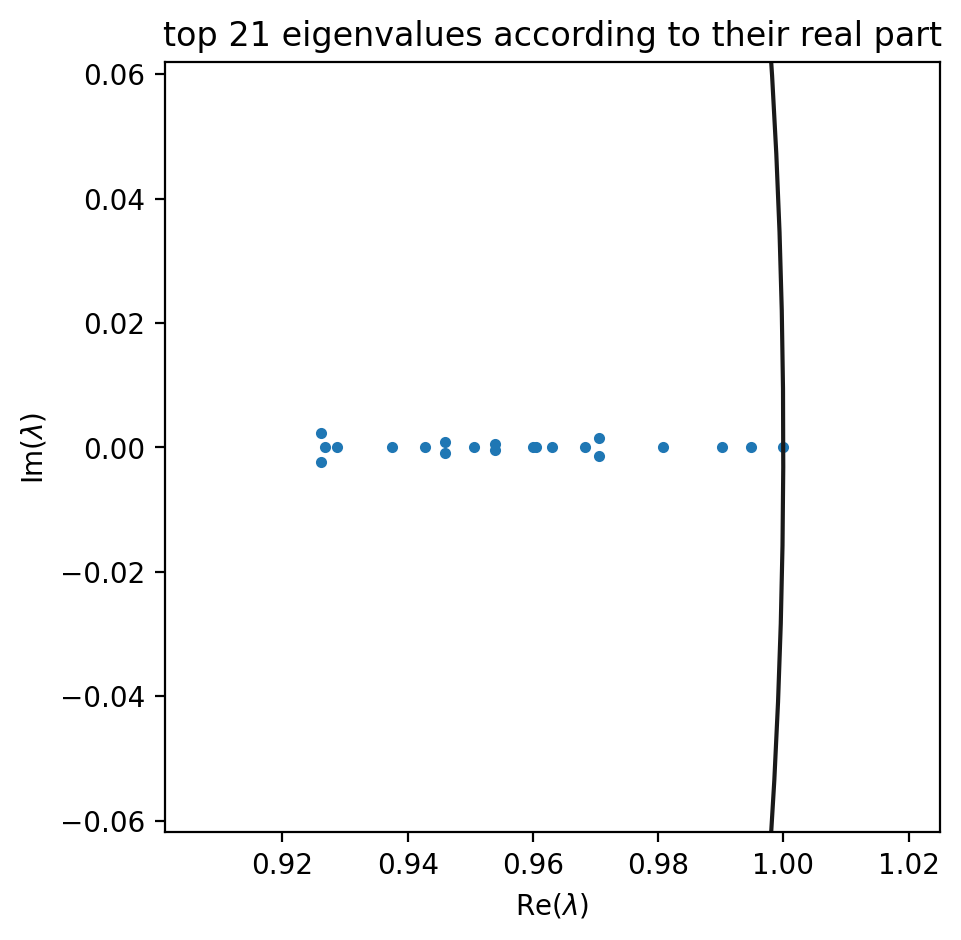

In [109]:
g_bwd.compute_schur(n_components=20, method='krylov')
g_bwd.plot_spectrum()

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


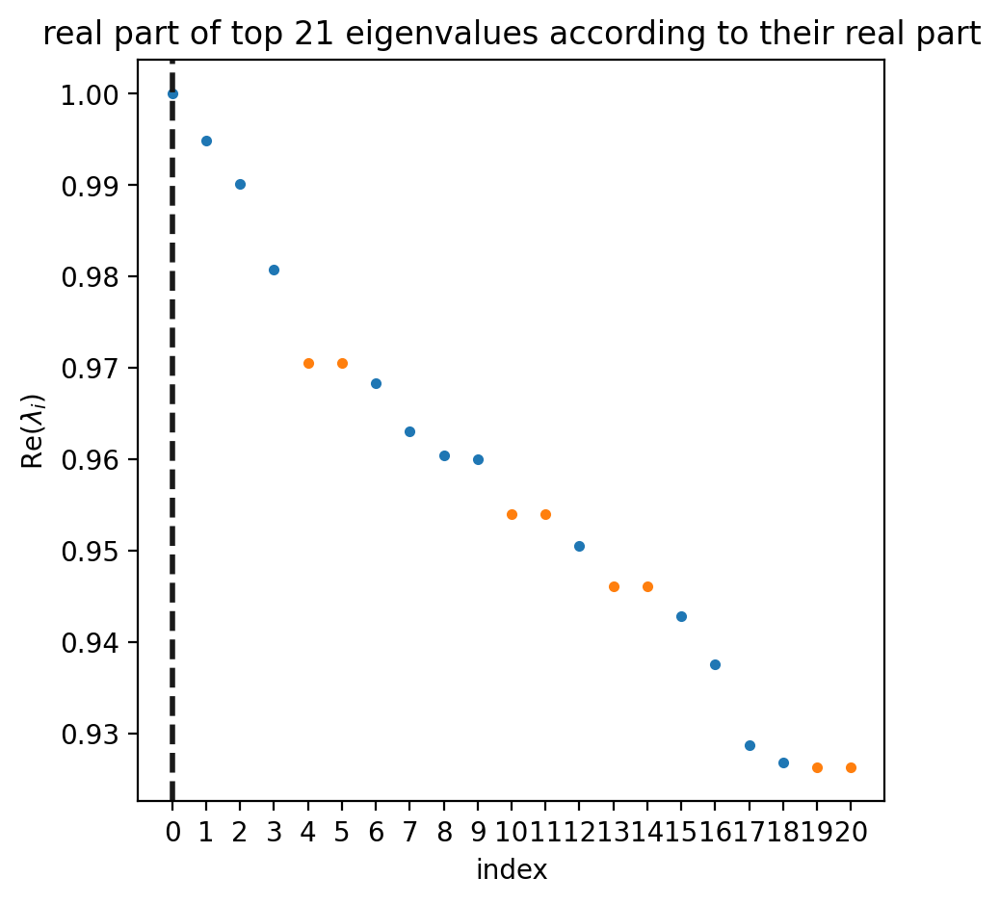

In [110]:
g_bwd.plot_spectrum(real_only=True)

Computing `3` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)


saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Combined_Kernel_Bwd_Macrostates.png


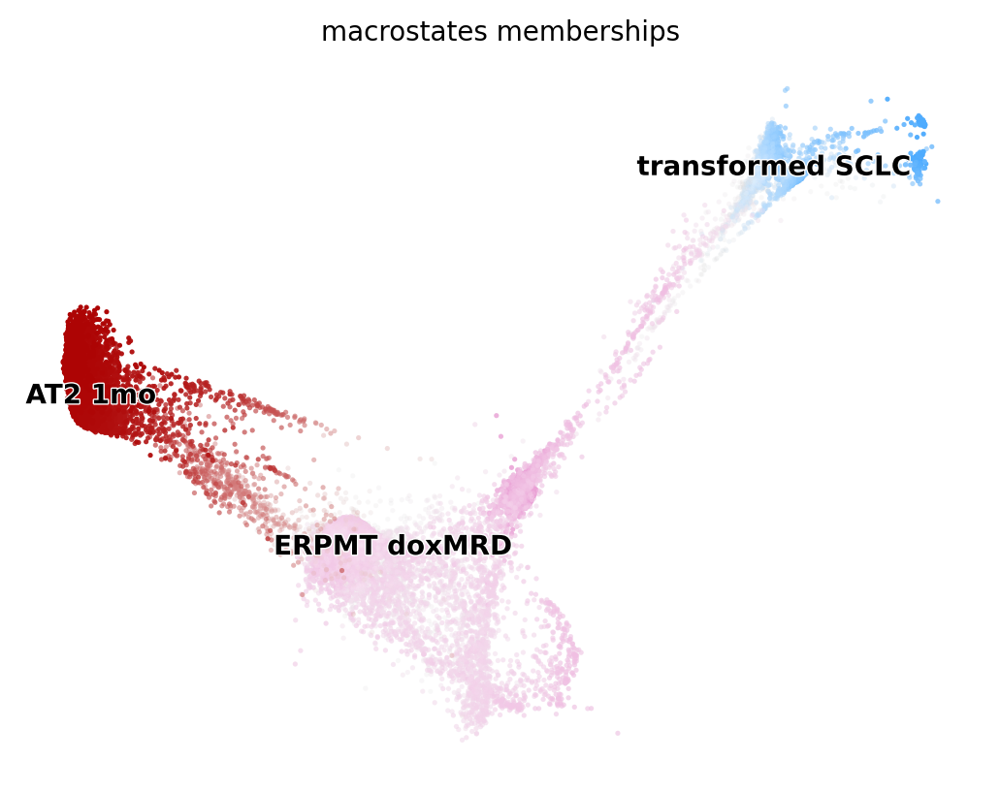

In [111]:
g_bwd.compute_macrostates(n_states=3, cluster_key='sample')
g_bwd.plot_macrostates(basis='draw_graph_fa', save='Combined_Kernel_Bwd_Macrostates.png')

In [112]:
g_bwd.set_terminal_states_from_macrostates(names=['AT2_1mo'])

/usr/local/lib/python3.7/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


Computing absorption probabilities


  0%|          | 0/1 [00:00<?, ?/s]

Adding `adata.obsm['from_initial_states']`
       `.absorption_probabilities`
    Finish (0:00:01)


saving figure to file /workdir/varmus_single_cell/merged_pipeline_out/TEC_out_PubShare/scvelo_Combined_Kernel_Bwd_Initial_state_Absorption_Probs_FDL.png


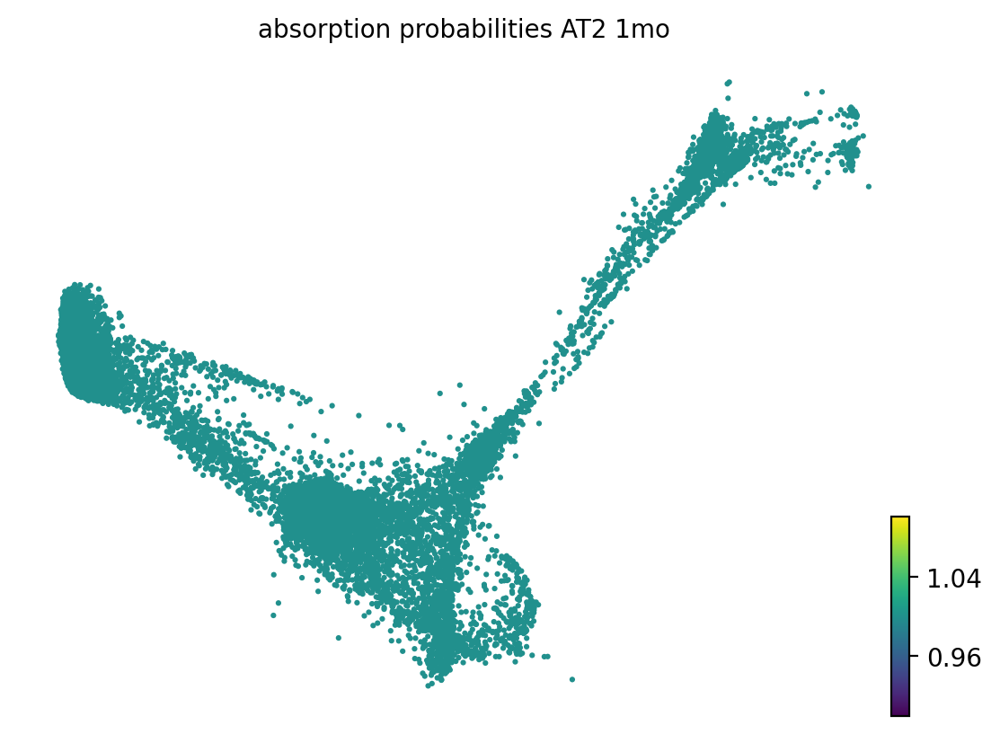

In [113]:
g_bwd.compute_absorption_probabilities()

g_bwd.plot_absorption_probabilities(same_plot=False, size=20, basis="draw_graph_fa", 
                                    save='Combined_Kernel_Bwd_Initial_state_Absorption_Probs_FDL.png')

In [ ]:
matplotlib.style.use('default')

scv.pl.velocity_embedding_stream(adata_HVG, 
                                 color=['initial_states_probs'], 
                                 cmap='viridis', 
                                 vkey="T_fwd", 
                                 basis="draw_graph_fa", 
                                 #legend_loc="right",
                                 save='initial_states_probs_FDL_projection_transition_vector_stream_embedding.png')

### Add Macrostate Probabilities to adata

In [120]:
adata_HVG.uns['macrostate_names'] = g.macrostates.unique().dropna().tolist()

/usr/local/lib/python3.7/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [121]:
for s in g.macrostates.unique().dropna():
    
    print(s)
    
    adata_HVG.obs[f'{s}_macrostate_probs'] = np.ravel(np.array(g.macrostates_memberships[s]))

ERPMT_pool
ERPMT_doxMRD
transformed_SCLC
AT2_1mo


### Save CellRank results to adata file

In [ ]:
adata_HVG

In [136]:
# Subset to HVGs only for running CellRank:

fn = '/workdir/LUAD_SCLC_HT/data/adata_CellRank_Input_HVG.h5ad'

adata_HVG.write(fn)